# Correlation Finder (Easy)
* We will cluster the stocks based on the correlation between them.
* We will use the KMeans algorithm to cluster the stocks.
* We will use the correlation matrix to find the correlation between the stocks.
* We will use the elbow method to find the optimal number of clusters.
* We will use the KMeans algorithm to cluster the stocks.
* We will use the PCA algorithm to reduce the dimensionality of the data.
* We will use the t-SNE algorithm to visualize the clusters.
* We will use the dendrogram to visualize the clusters.
* We will use the silhouette score to evaluate the clusters.

* We will work with the BIST100 data. We will work from 2022 to 2024.
* We will use the daily change rate of the stocks.
* But first, we need to download the data. So we will write a simple script to download the data.

BIST100 includes these stocks: AEFES AGROT AHGAZ AKBNK AKCNS AKFGY AKFYE AKSA AKSEN ALARK ALBRK ALFAS ANSGR ARCLK ASELS ASTOR BERA BFREN BIENY BIMAS BIOEN BOBET BRSAN BRYAT BTCIM CANTE CCOLA CIMSA CWENE DOAS DOHOL ECILC ECZYT EGEEN EKGYO ENERY ENJSA ENKAI EREGL EUPWR EUREN FROTO GARAN GESAN GUBRF GWIND HALKB HEKTS IPEKE ISCTR ISGYO ISMEN IZENR KAYSE KCAER KCHOL KLSER KONTR KONYA KOZAA KOZAL KRDMD MAVI MGROS MIATK ODAS OTKAR OYAKC PETKM PGSUS QUAGR REEDR SAHOL SASA SAYAS SDTTR SISE SKBNK SMRTG SOKM TABGD TAVHL TCELL THYAO TKFEN TOASO TSKB TTKOM TTRAK TUKAS TUPRS TURSG ULKER VAKBN VESBE VESTL YEOTK YKBNK YYLGD ZOREN

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time as time

In [4]:
stock_names_string = "AEFES AGROT AHGAZ AKBNK AKCNS AKFGY AKFYE AKSA AKSEN ALARK ALBRK ALFAS ANSGR ARCLK ASELS ASTOR BERA BFREN BIENY BIMAS BIOEN BOBET BRSAN BRYAT BTCIM CANTE CCOLA CIMSA CWENE DOAS DOHOL ECILC ECZYT EGEEN EKGYO ENERY ENJSA ENKAI EREGL EUPWR EUREN FROTO GARAN GESAN GUBRF GWIND HALKB HEKTS IPEKE ISCTR ISGYO ISMEN IZENR KAYSE KCAER KCHOL KLSER KONTR KONYA KOZAA KOZAL KRDMD MAVI MGROS MIATK ODAS OTKAR OYAKC PETKM PGSUS QUAGR REEDR SAHOL SASA SAYAS SDTTR SISE SKBNK SMRTG SOKM TABGD TAVHL TCELL THYAO TKFEN TOASO TSKB TTKOM TTRAK TUKAS TUPRS TURSG ULKER VAKBN VESBE VESTL YEOTK YKBNK YYLGD ZOREN"
stock_names = stock_names_string.split(" ")

In [5]:
print(stock_names)

['AEFES', 'AGROT', 'AHGAZ', 'AKBNK', 'AKCNS', 'AKFGY', 'AKFYE', 'AKSA', 'AKSEN', 'ALARK', 'ALBRK', 'ALFAS', 'ANSGR', 'ARCLK', 'ASELS', 'ASTOR', 'BERA', 'BFREN', 'BIENY', 'BIMAS', 'BIOEN', 'BOBET', 'BRSAN', 'BRYAT', 'BTCIM', 'CANTE', 'CCOLA', 'CIMSA', 'CWENE', 'DOAS', 'DOHOL', 'ECILC', 'ECZYT', 'EGEEN', 'EKGYO', 'ENERY', 'ENJSA', 'ENKAI', 'EREGL', 'EUPWR', 'EUREN', 'FROTO', 'GARAN', 'GESAN', 'GUBRF', 'GWIND', 'HALKB', 'HEKTS', 'IPEKE', 'ISCTR', 'ISGYO', 'ISMEN', 'IZENR', 'KAYSE', 'KCAER', 'KCHOL', 'KLSER', 'KONTR', 'KONYA', 'KOZAA', 'KOZAL', 'KRDMD', 'MAVI', 'MGROS', 'MIATK', 'ODAS', 'OTKAR', 'OYAKC', 'PETKM', 'PGSUS', 'QUAGR', 'REEDR', 'SAHOL', 'SASA', 'SAYAS', 'SDTTR', 'SISE', 'SKBNK', 'SMRTG', 'SOKM', 'TABGD', 'TAVHL', 'TCELL', 'THYAO', 'TKFEN', 'TOASO', 'TSKB', 'TTKOM', 'TTRAK', 'TUKAS', 'TUPRS', 'TURSG', 'ULKER', 'VAKBN', 'VESBE', 'VESTL', 'YEOTK', 'YKBNK', 'YYLGD', 'ZOREN']


* Scraping the data using TradingView API.

In [6]:
from tvDatafeed import TvDatafeed, Interval

username = 'ggipideneme'
password = 'tehho0-Raqdes-hoqgib'

tv = TvDatafeed(username, password)

error while signin
you are using nologin method, data you access may be limited


In [7]:
dict_stocks = {}

for stock in stock_names:
    temp_data = tv.get_hist(symbol=stock,exchange='BIST',interval=Interval.in_1_hour,n_bars=1000)
    print(stock, " data is fetched.")
    time.sleep(1.5)
    dict_stocks[stock] = temp_data

AEFES  data is fetched.
AGROT  data is fetched.
AHGAZ  data is fetched.
AKBNK  data is fetched.
AKCNS  data is fetched.
AKFGY  data is fetched.
AKFYE  data is fetched.
AKSA  data is fetched.
AKSEN  data is fetched.
ALARK  data is fetched.
ALBRK  data is fetched.
ALFAS  data is fetched.
ANSGR  data is fetched.
ARCLK  data is fetched.
ASELS  data is fetched.
ASTOR  data is fetched.
BERA  data is fetched.
BFREN  data is fetched.
BIENY  data is fetched.
BIMAS  data is fetched.
BIOEN  data is fetched.
BOBET  data is fetched.
BRSAN  data is fetched.
BRYAT  data is fetched.
BTCIM  data is fetched.
CANTE  data is fetched.
CCOLA  data is fetched.
CIMSA  data is fetched.
CWENE  data is fetched.
DOAS  data is fetched.
DOHOL  data is fetched.
ECILC  data is fetched.
ECZYT  data is fetched.
EGEEN  data is fetched.
EKGYO  data is fetched.
ENERY  data is fetched.
ENJSA  data is fetched.
ENKAI  data is fetched.
EREGL  data is fetched.
EUPWR  data is fetched.
EUREN  data is fetched.
FROTO  data is fetc

ERROR:tvDatafeed.main:Connection to remote host was lost.
ERROR:tvDatafeed.main:no data, please check the exchange and symbol


TOASO  data is fetched.
TSKB  data is fetched.
TTKOM  data is fetched.
TTRAK  data is fetched.
TUKAS  data is fetched.
TUPRS  data is fetched.
TURSG  data is fetched.
ULKER  data is fetched.
VAKBN  data is fetched.
VESBE  data is fetched.
VESTL  data is fetched.
YEOTK  data is fetched.
YKBNK  data is fetched.
YYLGD  data is fetched.
ZOREN  data is fetched.


In [9]:
len(dict_stocks)

100

In [10]:
failed_names=["TOASO"]

In [11]:
for name in failed_names:
    temp_data = tv.get_hist(symbol=name,exchange='BIST',interval=Interval.in_1_hour,n_bars=1000)
    print(name, " data is fetched.")
    dict_stocks[name] = temp_data

TOASO  data is fetched.


In [101]:
for stock in stock_names:
    print(stock, len(dict_stocks[stock]))

AEFES 1000
AGROT 1000
AHGAZ 1000
AKBNK 1000
AKCNS 1000
AKFGY 1000
AKFYE 1000
AKSA 1000
AKSEN 1000
ALARK 1000
ALBRK 1000
ALFAS 1000
ANSGR 1000
ARCLK 1000
ASELS 1000
ASTOR 1000
BERA 1000
BFREN 1000
BIENY 1000
BIMAS 1000
BIOEN 1000
BOBET 1000
BRSAN 1000
BRYAT 1000
BTCIM 1000
CANTE 1000
CCOLA 1000
CIMSA 1000
CWENE 1000
DOAS 1000
DOHOL 1000
ECILC 1000
ECZYT 1000
EGEEN 1000
EKGYO 1000
ENERY 1000
ENJSA 1000
ENKAI 1000
EREGL 1000
EUPWR 1000
EUREN 1000
FROTO 1000
GARAN 1000
GESAN 1000
GUBRF 1000
GWIND 1000
HALKB 1000
HEKTS 1000
IPEKE 1000
ISCTR 1000
ISGYO 1000
ISMEN 1000
IZENR 1000
KAYSE 1000
KCAER 1000
KCHOL 1000
KLSER 1000
KONTR 1000
KONYA 1000
KOZAA 1000
KOZAL 1000
KRDMD 1000
MAVI 1000
MGROS 1000
MIATK 1000
ODAS 1000
OTKAR 1000
OYAKC 1000
PETKM 1000
PGSUS 1000
QUAGR 1000
REEDR 1000
SAHOL 1000
SASA 1000
SAYAS 1000
SDTTR 1000
SISE 1000
SKBNK 1000
SMRTG 1000
SOKM 1000
TABGD 1000
TAVHL 1000
TCELL 1000
THYAO 1000
TKFEN 1000
TOASO 1000
TSKB 1000
TTKOM 1000
TTRAK 1000
TUKAS 1000
TUPRS 1000
TURSG 10

* Now that we have retrieved all of our data, let's process them.

In [102]:
def process_data(data):
    data['change_oc_percentage'] = (data['open'] - data['close']) / data['close'] * 100
    data['change_hl_percentage'] = (data['high'] - data['low']) / data['high'] * 100
    data['change_hc_percentage'] = (data['high'] - data['close']) / data['close'] * 100
    data['change_lc_percentage'] = (data['low'] - data['close']) / data['close'] * 100
    data['normalized_close'] = data['close'] / data['close'].iloc[0]
    data['normalized_open'] = data['open'] / data['open'].iloc[0]
    data['normalized_high'] = data['high'] / data['high'].iloc[0]
    data['normalized_low'] = data['low'] / data['low'].iloc[0]
    data['normalized_volume'] = data['volume'] / data['volume'].iloc[0]
    
    return data

In [103]:
for stock in stock_names:
    dict_stocks[stock] = process_data(dict_stocks[stock])

* Since we have retrieved the data, we can convert the data to csv files.

In [104]:
for stock in stock_names:
    dict_stocks[stock].to_csv(stock+".csv")

In [105]:
import os
os.system("mkdir stocks")
os.system("mv *.csv stocks")

mkdir: stocks: File exists


0

## Open Close Change Rate Correlation Analysis
* We will use the daily change rate of the stocks to find the correlation between the stocks.

In [106]:
## Print the correaltion heatmap bwtween the stocks
correlation_matrix = pd.DataFrame()
for stock in stock_names:
    correlation_matrix[stock] = dict_stocks[stock]['change_oc_percentage']
correlation_matrix = correlation_matrix.corr()

In [107]:
top_100 = correlation_matrix.abs().unstack().sort_values(ascending=False).drop_duplicates().iloc[1:101]

In [108]:
top_100.to_csv("top_100_correlation.csv")

In [109]:
top_100.head(40)

YKBNK  AKBNK    0.805942
KOZAA  KOZAL    0.795083
GARAN  AKBNK    0.786298
GESAN  EUPWR    0.786164
AKBNK  ISCTR    0.763099
VAKBN  HALKB    0.762475
KOZAA  IPEKE    0.752884
CWENE  EUPWR    0.752351
YKBNK  ISCTR    0.748904
THYAO  PGSUS    0.732125
KONYA  EGEEN    0.729170
CWENE  GESAN    0.725530
ISCTR  GARAN    0.722584
YKBNK  GARAN    0.716430
KRDMD  EREGL    0.711314
GESAN  SMRTG    0.709104
HEKTS  SASA     0.707750
KOZAL  IPEKE    0.705481
ASTOR  GESAN    0.687219
       EUPWR    0.679862
KONTR  YEOTK    0.673620
BRYAT  BRSAN    0.673582
EUPWR  SMRTG    0.662012
GESAN  YEOTK    0.658967
YEOTK  EUPWR    0.656868
GESAN  KONTR    0.646548
KCHOL  SAHOL    0.637530
SMRTG  CWENE    0.635657
YEOTK  CWENE    0.633603
TCELL  TTKOM    0.632856
CANTE  ODAS     0.628875
EUPWR  KONTR    0.626790
SMRTG  YEOTK    0.625783
       ASTOR    0.619870
       KONTR    0.609954
ECZYT  ECILC    0.602631
BFREN  EGEEN    0.602221
CWENE  ASTOR    0.596005
KONTR  CWENE    0.594516
ISGYO  SKBNK    0.593687


In [110]:
top_40 = top_100.head(60)
top_40 = top_40.reset_index()
top_40.columns = ['stock1', 'stock2', 'correlation']

top_40

,stock1,stock2,correlation
0,YKBNK,AKBNK,0.805942
1,KOZAA,KOZAL,0.795083
2,GARAN,AKBNK,0.786298
3,GESAN,EUPWR,0.786164
4,AKBNK,ISCTR,0.763099
5,VAKBN,HALKB,0.762475
6,KOZAA,IPEKE,0.752884
7,CWENE,EUPWR,0.752351
8,YKBNK,ISCTR,0.748904
9,THYAO,PGSUS,0.732125


In [111]:
correlated_stocks = {}
for stock in stock_names:
    correlated_stocks[stock] = []

for i in range(len(top_40)):
    stock1 = top_40.iloc[i]['stock1']
    stock2 = top_40.iloc[i]['stock2']
    correlated_stocks[stock1].append(stock2)
    correlated_stocks[stock2].append(stock1)

correlated_stocks

{'AEFES': [],
 'AGROT': [],
 'AHGAZ': [],
 'AKBNK': ['YKBNK', 'GARAN', 'ISCTR', 'VAKBN', 'SAHOL'],
 'AKCNS': ['CIMSA'],
 'AKFGY': [],
 'AKFYE': [],
 'AKSA': [],
 'AKSEN': [],
 'ALARK': [],
 'ALBRK': [],
 'ALFAS': ['EUPWR', 'GESAN', 'ASTOR', 'SMRTG', 'CWENE'],
 'ANSGR': [],
 'ARCLK': [],
 'ASELS': [],
 'ASTOR': ['GESAN', 'EUPWR', 'SMRTG', 'CWENE', 'KONTR', 'ALFAS', 'YEOTK'],
 'BERA': [],
 'BFREN': ['EGEEN', 'KONYA'],
 'BIENY': [],
 'BIMAS': [],
 'BIOEN': [],
 'BOBET': [],
 'BRSAN': ['BRYAT'],
 'BRYAT': ['BRSAN'],
 'BTCIM': [],
 'CANTE': ['ODAS'],
 'CCOLA': [],
 'CIMSA': ['OYAKC', 'AKCNS'],
 'CWENE': ['EUPWR', 'GESAN', 'SMRTG', 'YEOTK', 'ASTOR', 'KONTR', 'ALFAS'],
 'DOAS': [],
 'DOHOL': [],
 'ECILC': ['ECZYT'],
 'ECZYT': ['ECILC'],
 'EGEEN': ['KONYA', 'BFREN'],
 'EKGYO': [],
 'ENERY': [],
 'ENJSA': [],
 'ENKAI': [],
 'EREGL': ['KRDMD'],
 'EUPWR': ['GESAN', 'CWENE', 'ASTOR', 'SMRTG', 'YEOTK', 'KONTR', 'ALFAS'],
 'EUREN': [],
 'FROTO': ['TOASO'],
 'GARAN': ['AKBNK', 'ISCTR', 'YKBNK', 'VAKB

In [178]:
## save the correlated stocks
import json
with open('correlated_stocks.json', 'w') as fp:
    json.dump(correlated_stocks, fp)

mkdir: OpenCloseChange: File exists


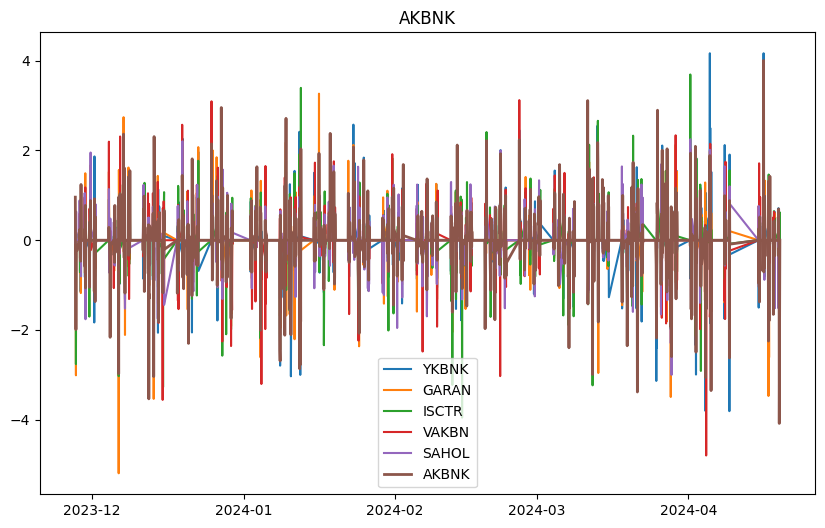

mkdir: OpenCloseChange: File exists


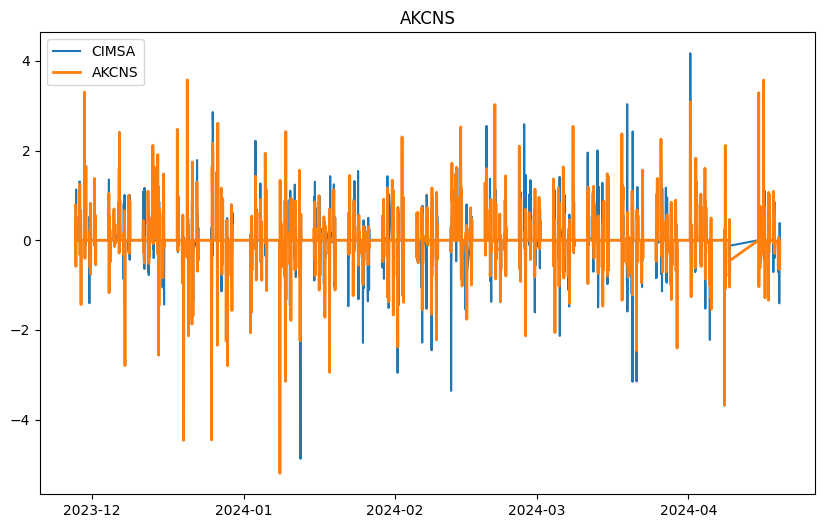

mkdir: OpenCloseChange: File exists


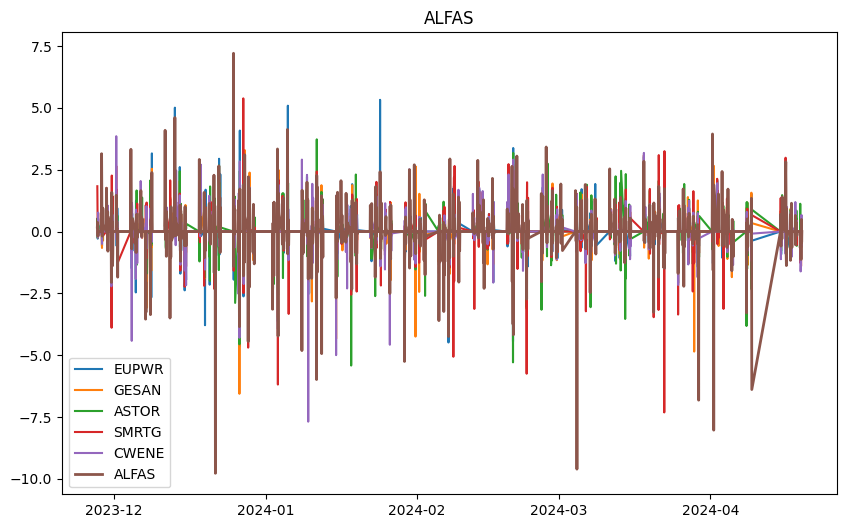

mkdir: OpenCloseChange: File exists


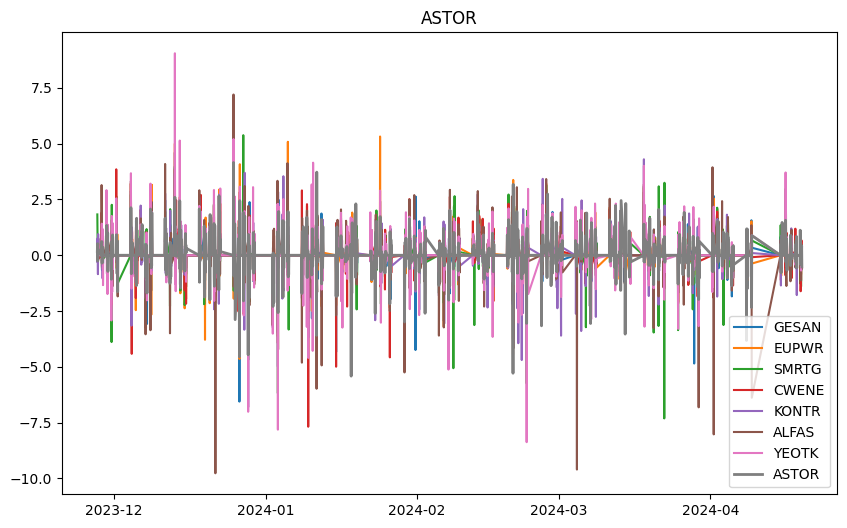

mkdir: OpenCloseChange: File exists


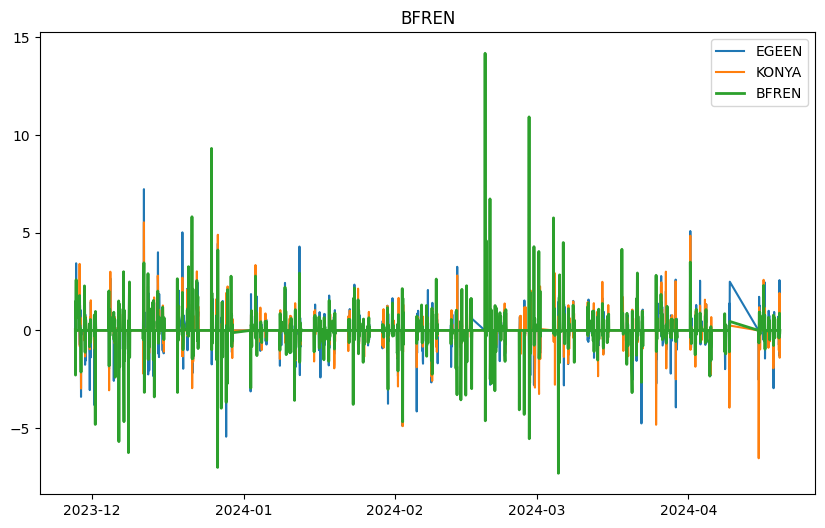

mkdir: OpenCloseChange: File exists


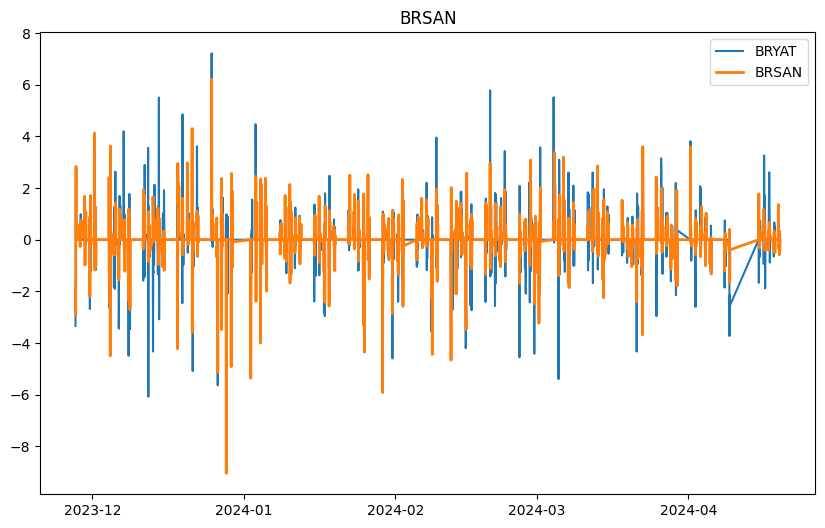

mkdir: OpenCloseChange: File exists


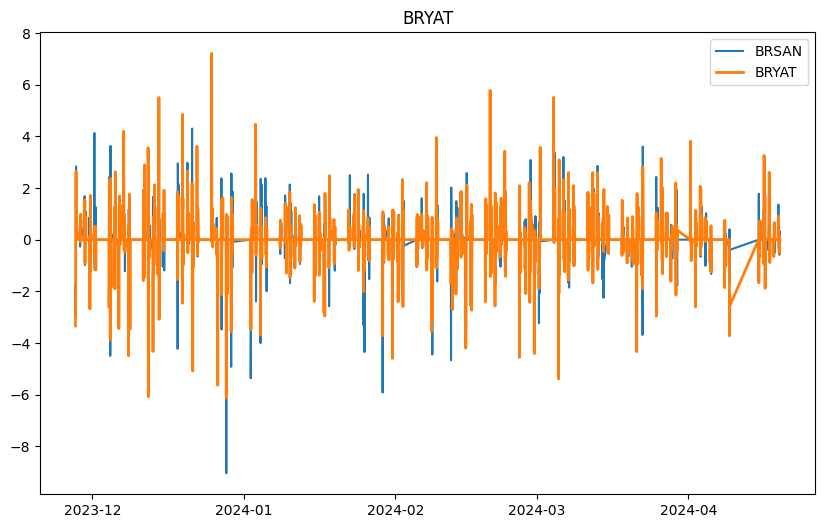

mkdir: OpenCloseChange: File exists


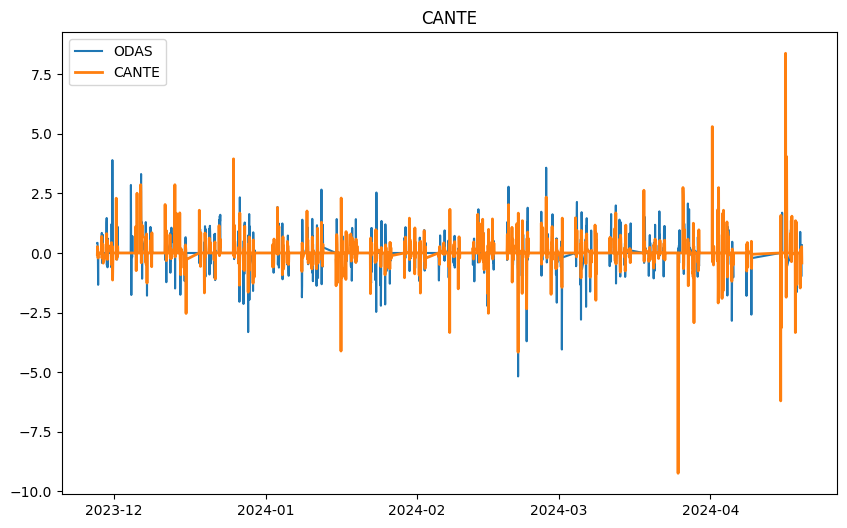

mkdir: OpenCloseChange: File exists


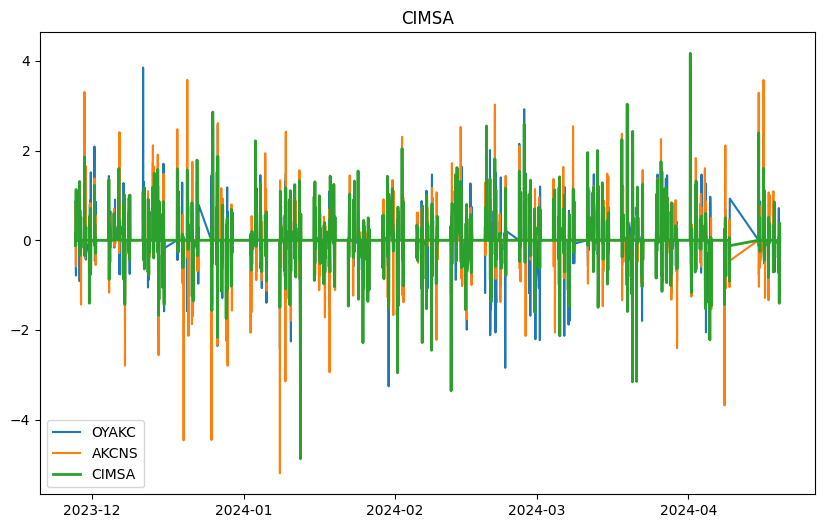

mkdir: OpenCloseChange: File exists


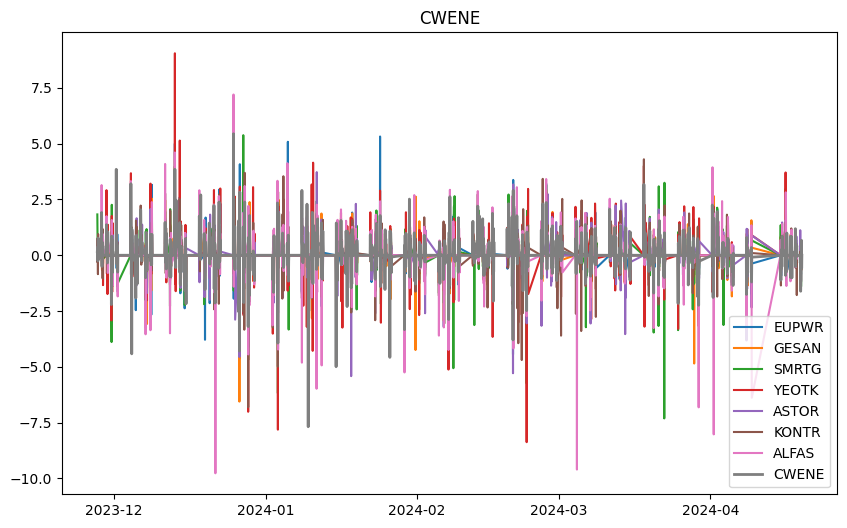

mkdir: OpenCloseChange: File exists


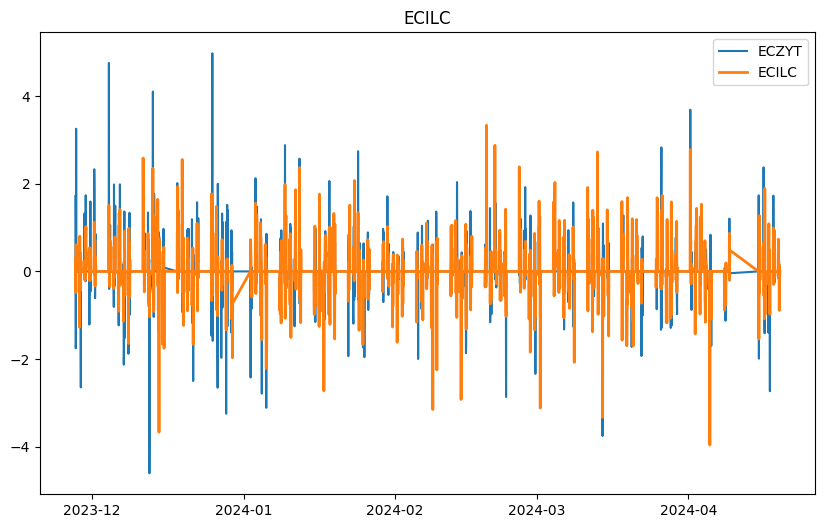

mkdir: OpenCloseChange: File exists


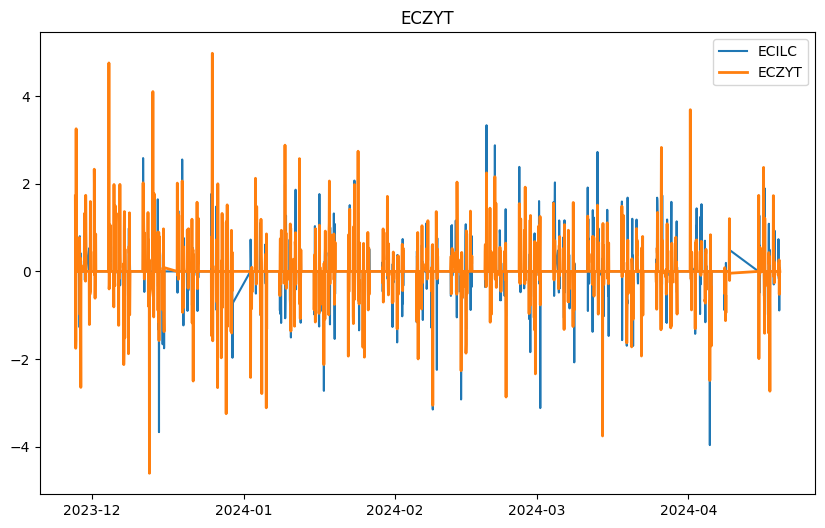

mkdir: OpenCloseChange: File exists


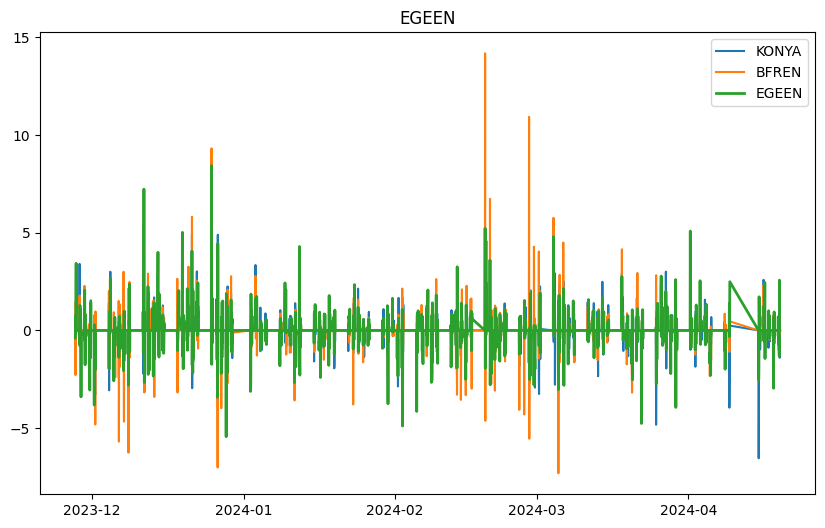

mkdir: OpenCloseChange: File exists


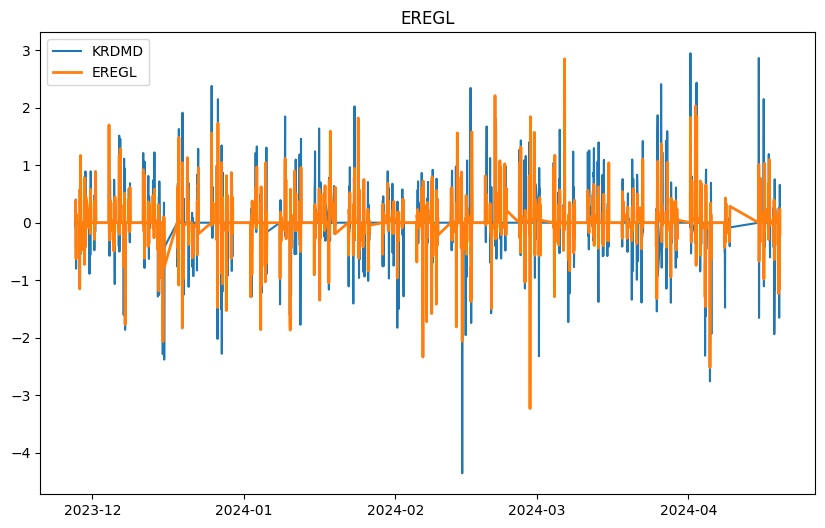

mkdir: OpenCloseChange: File exists


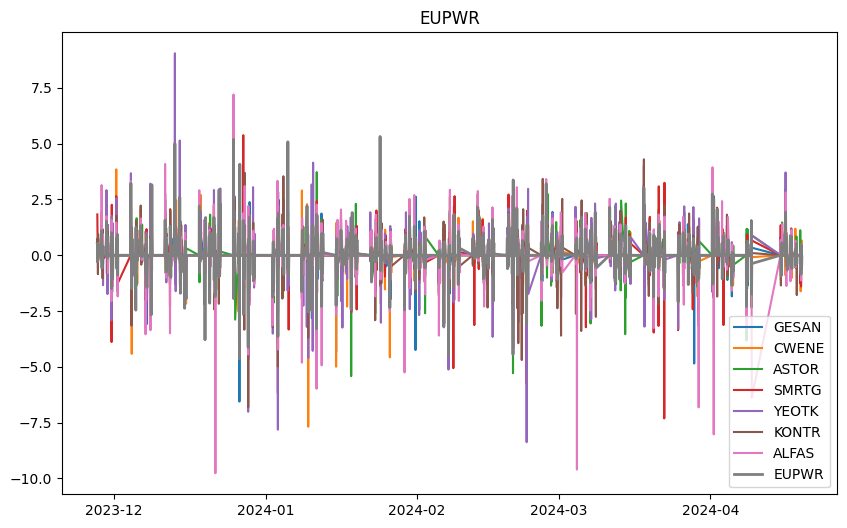

mkdir: OpenCloseChange: File exists


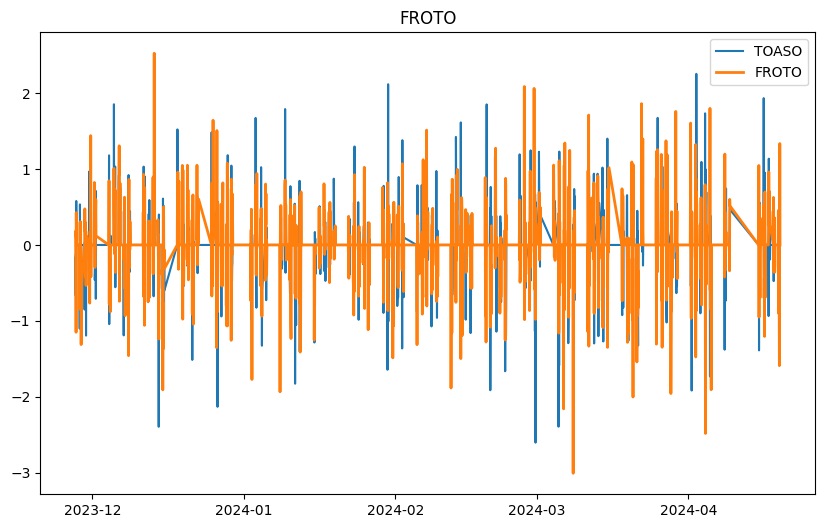

mkdir: OpenCloseChange: File exists


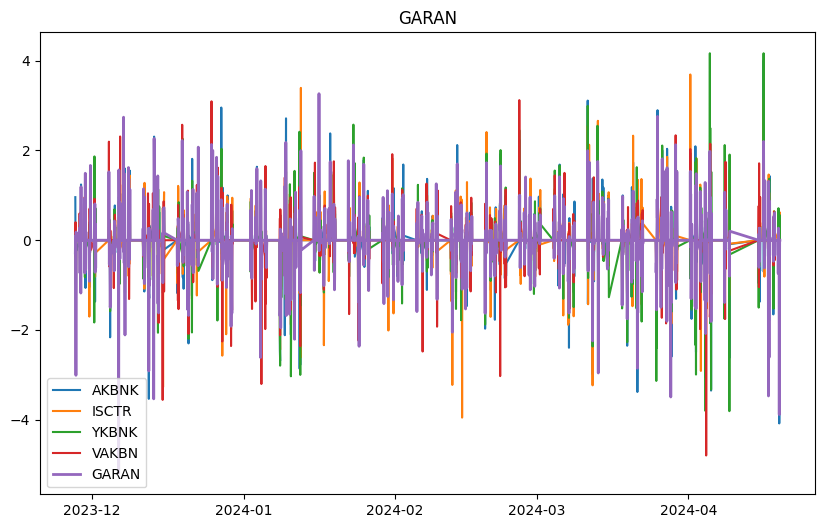

mkdir: OpenCloseChange: File exists


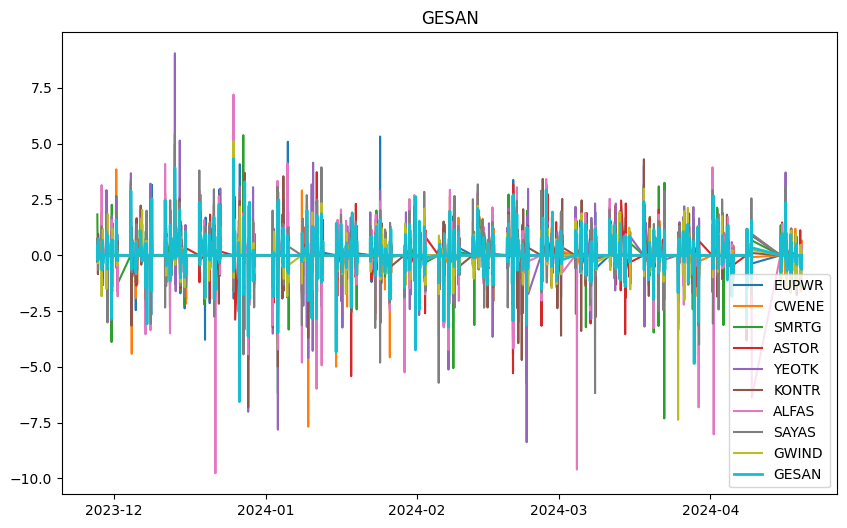

mkdir: OpenCloseChange: File exists


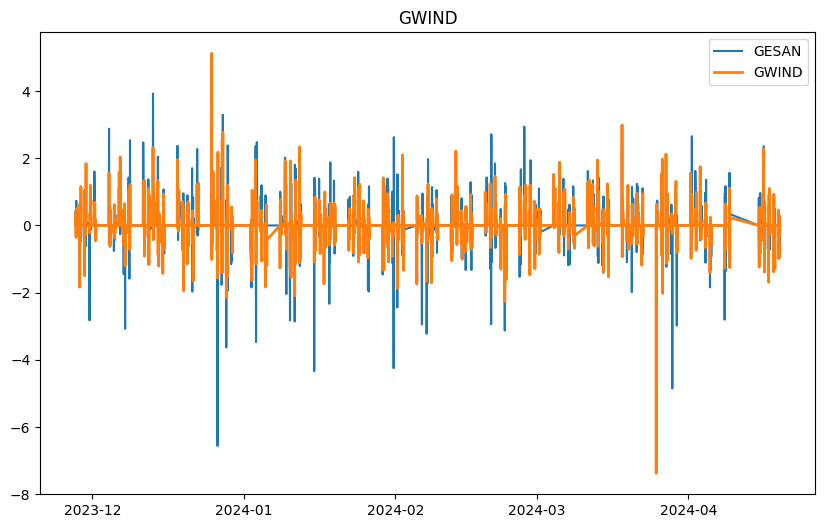

mkdir: OpenCloseChange: File exists


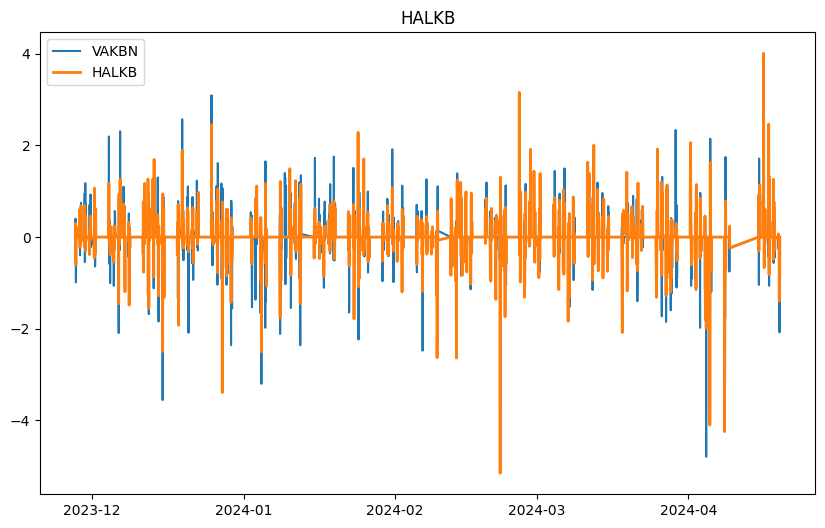

mkdir: OpenCloseChange: File exists


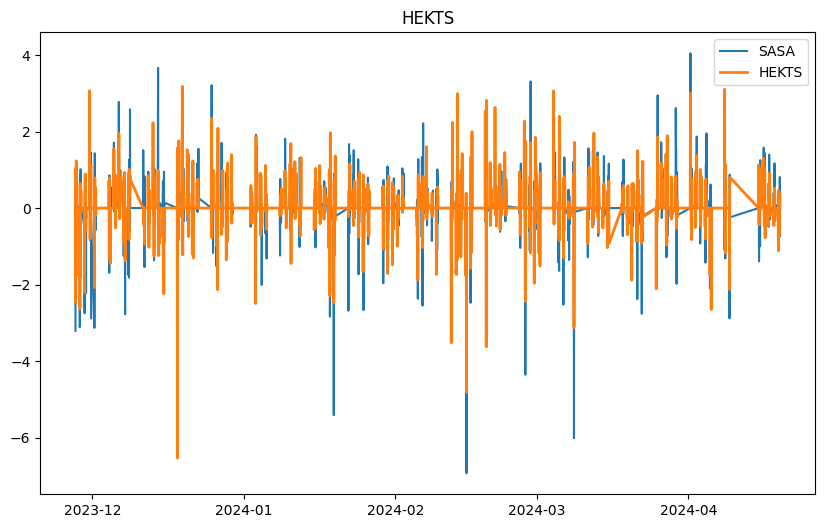

mkdir: OpenCloseChange: File exists


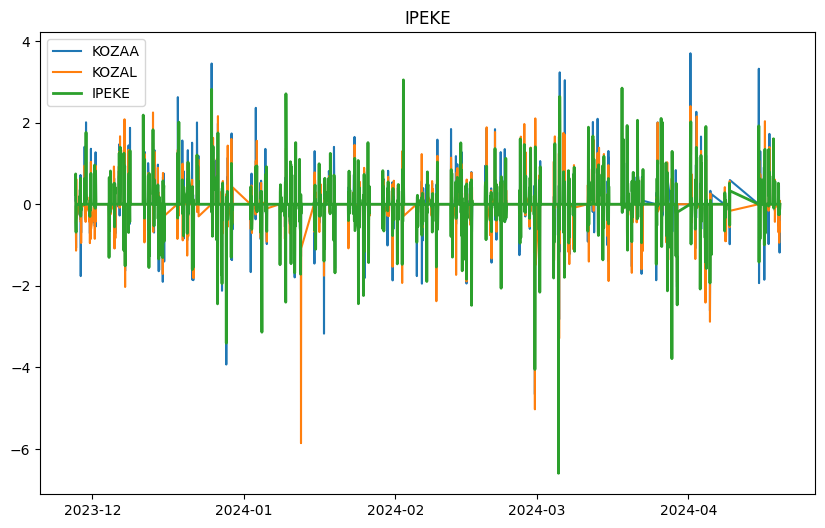

mkdir: OpenCloseChange: File exists


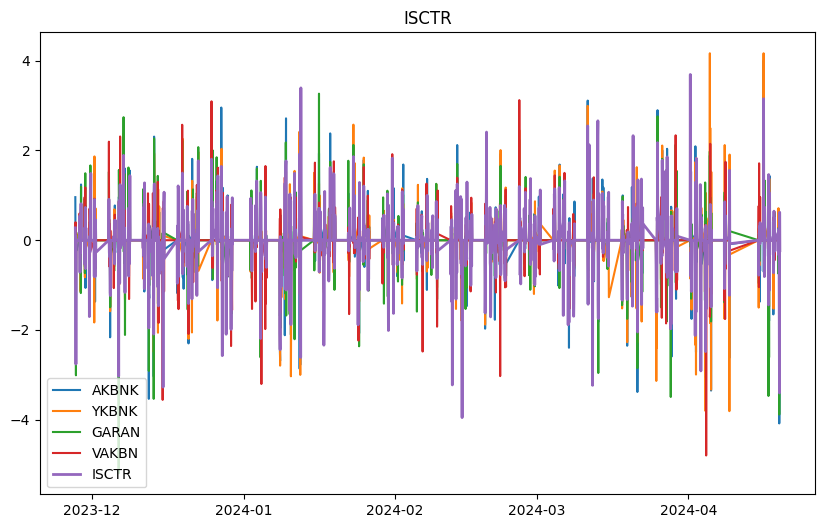

mkdir: OpenCloseChange: File exists


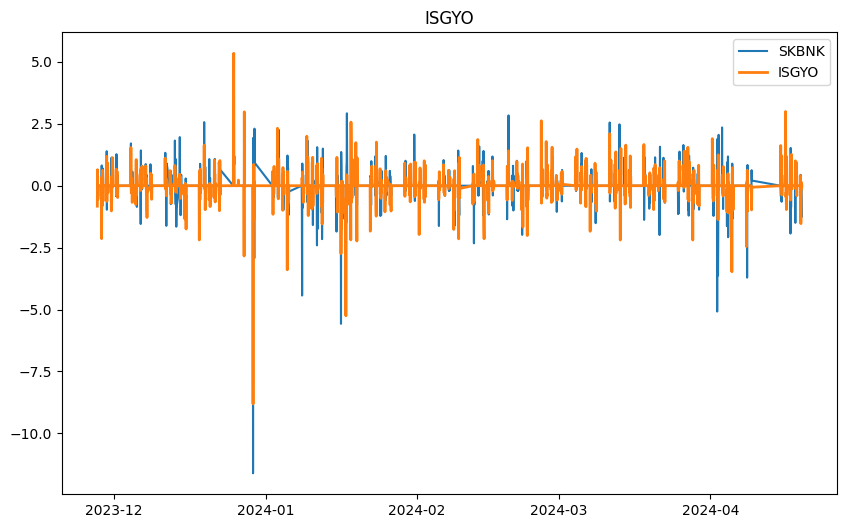

mkdir: OpenCloseChange: File exists


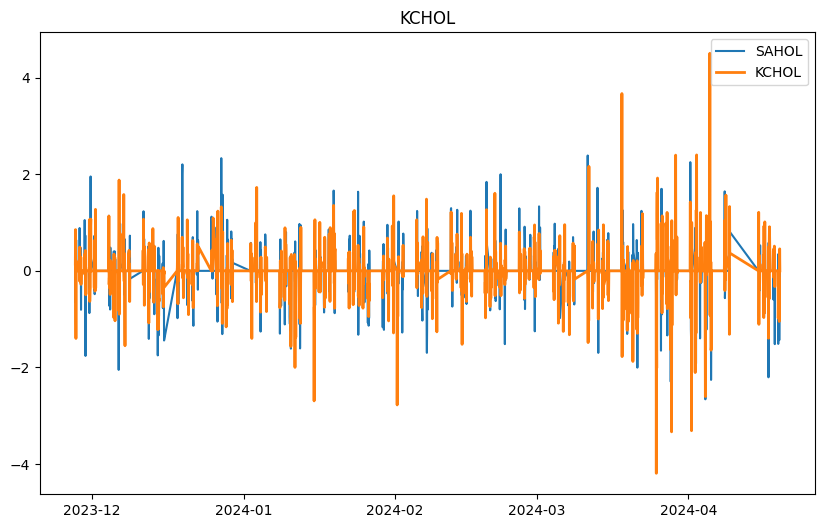

mkdir: OpenCloseChange: File exists


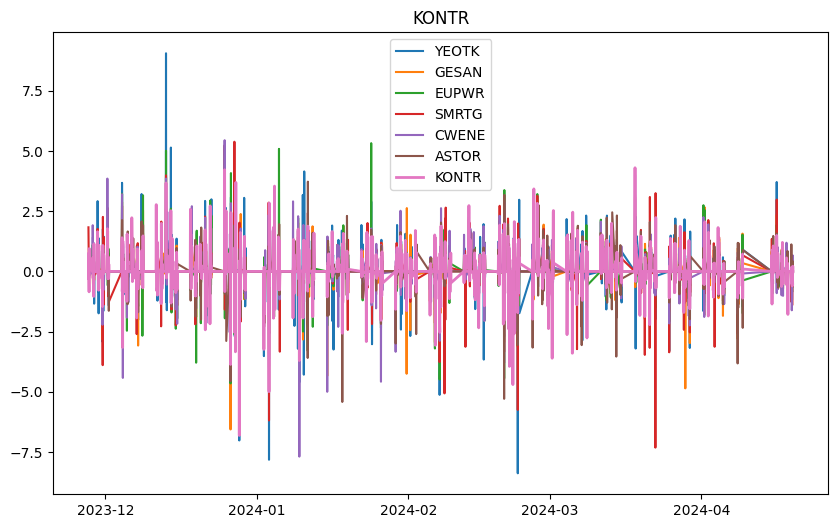

mkdir: OpenCloseChange: File exists


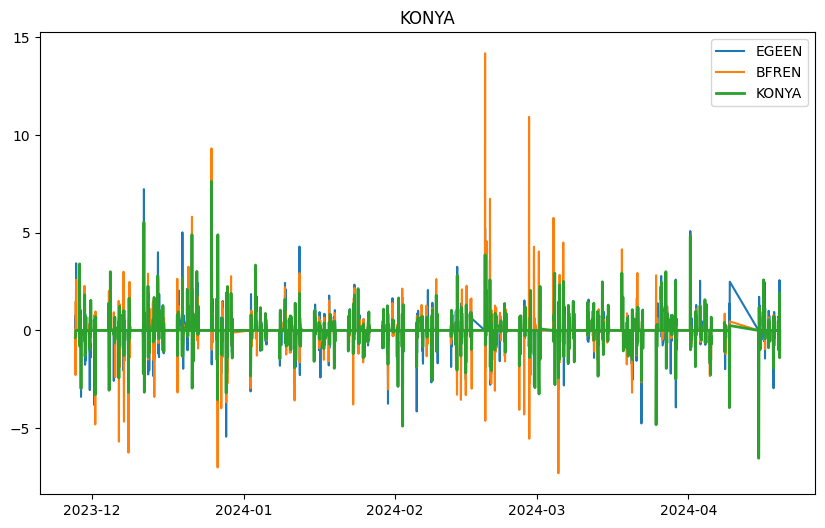

mkdir: OpenCloseChange: File exists


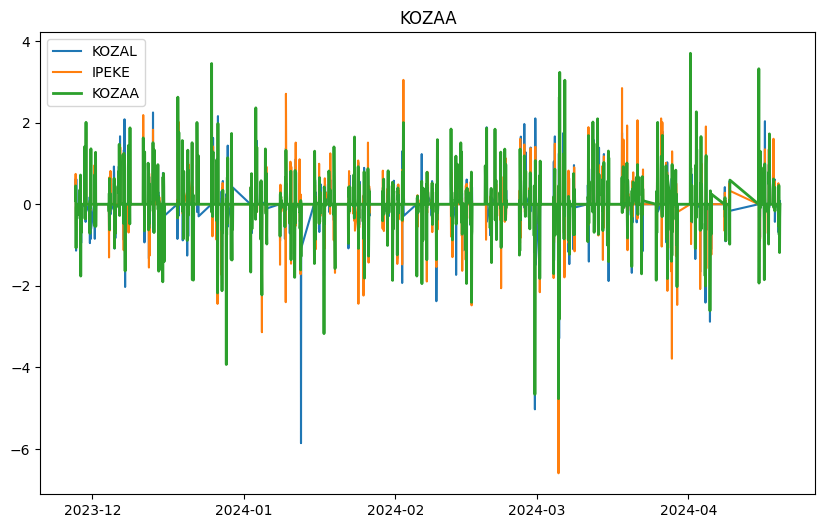

mkdir: OpenCloseChange: File exists


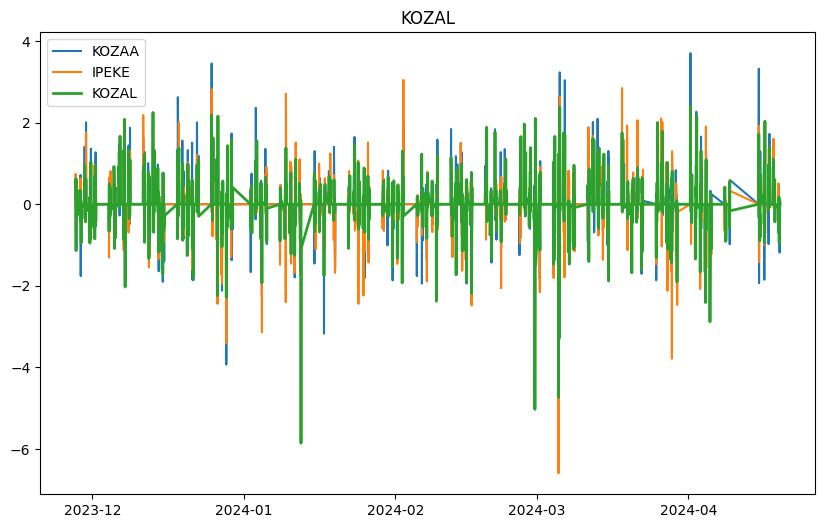

mkdir: OpenCloseChange: File exists


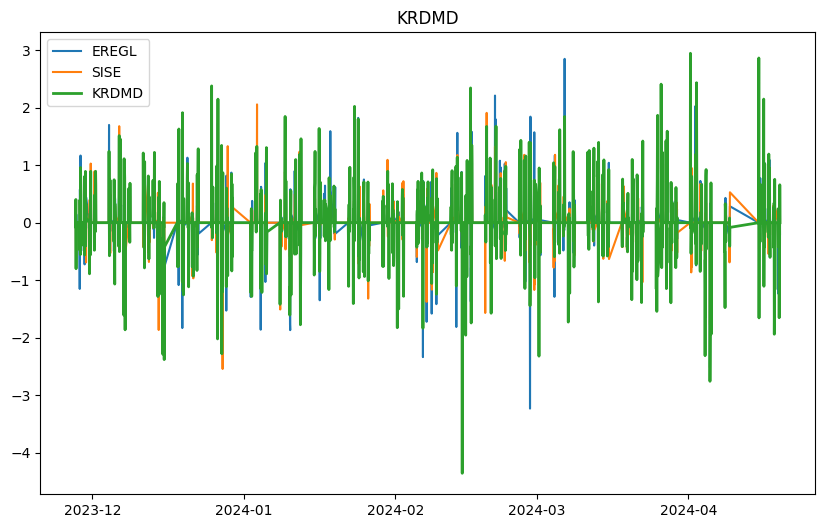

mkdir: OpenCloseChange: File exists


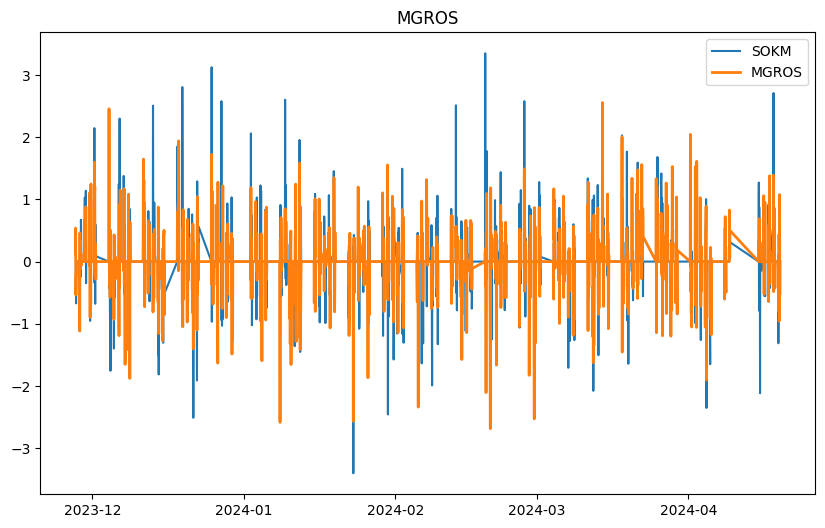

mkdir: OpenCloseChange: File exists


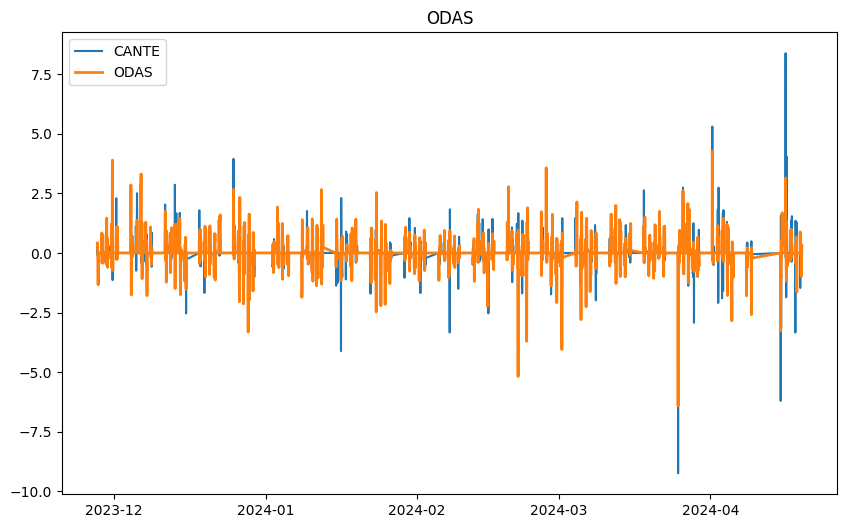

mkdir: OpenCloseChange: File exists


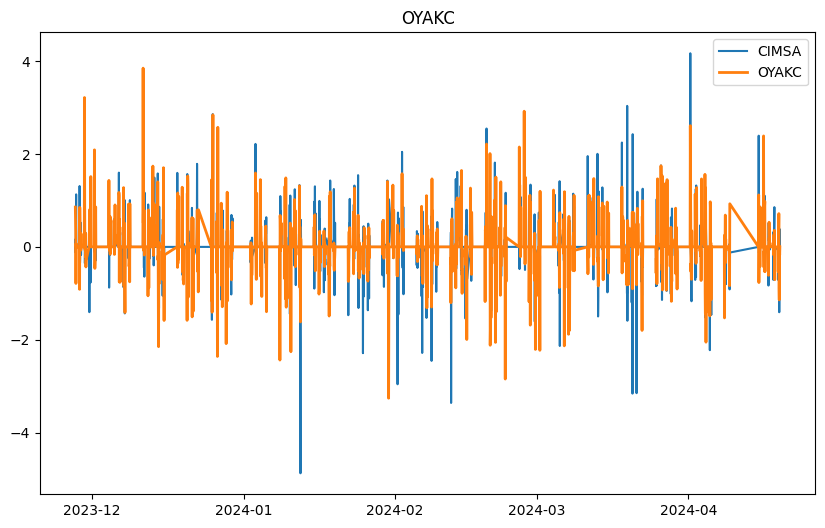

mkdir: OpenCloseChange: File exists


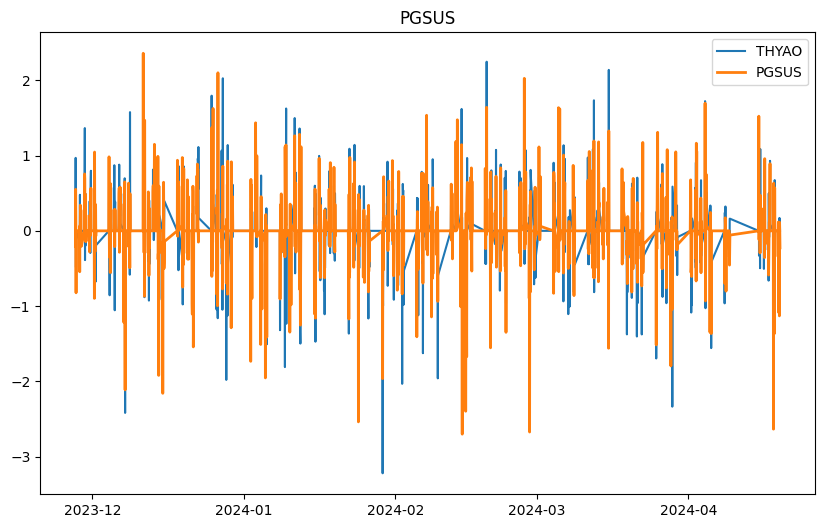

mkdir: OpenCloseChange: File exists


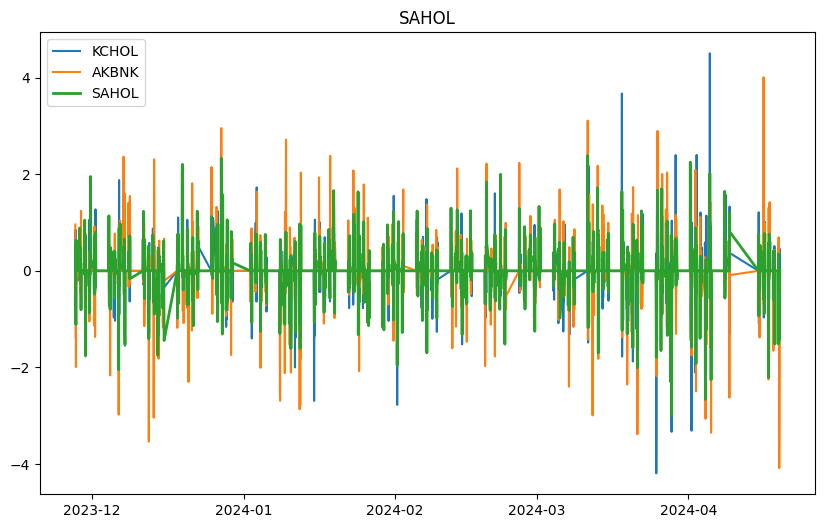

mkdir: OpenCloseChange: File exists


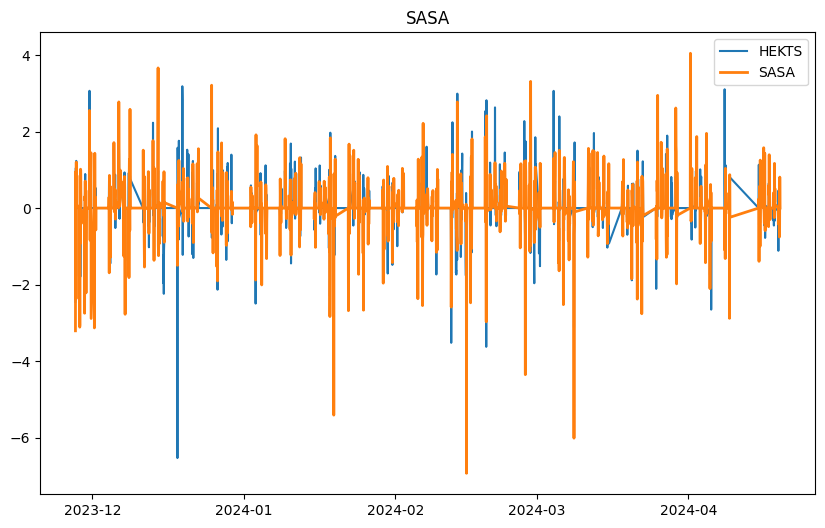

mkdir: OpenCloseChange: File exists


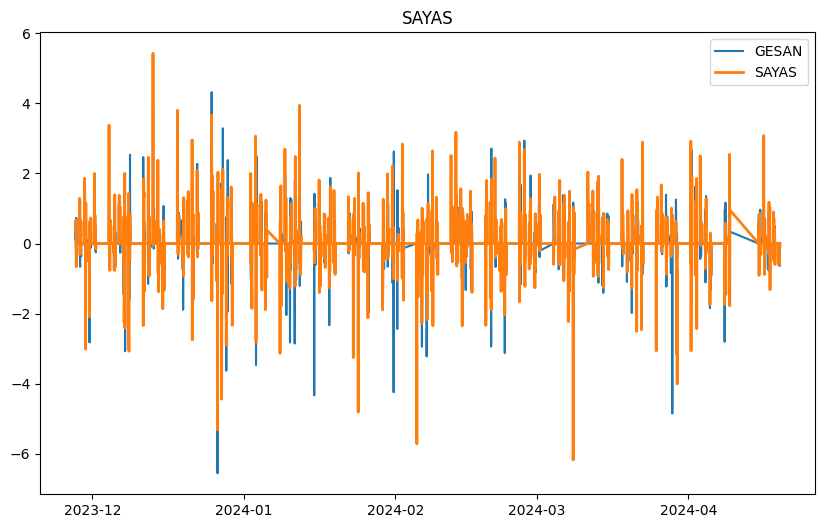

mkdir: OpenCloseChange: File exists


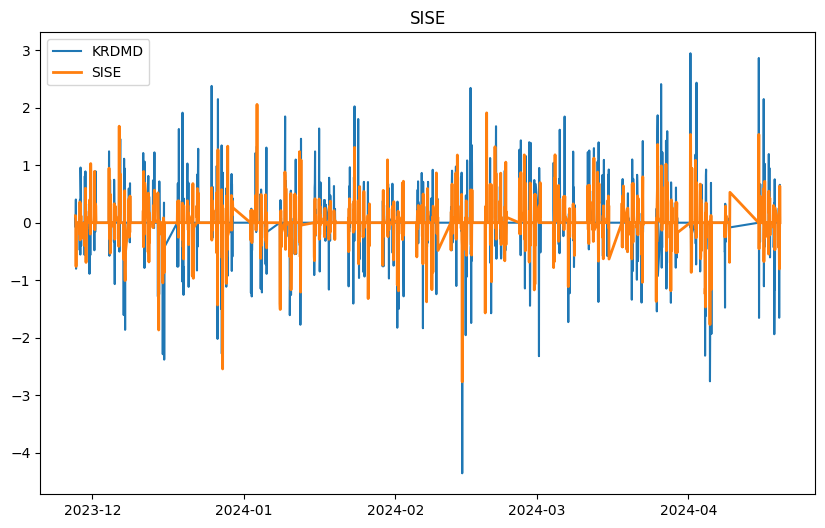

mkdir: OpenCloseChange: File exists


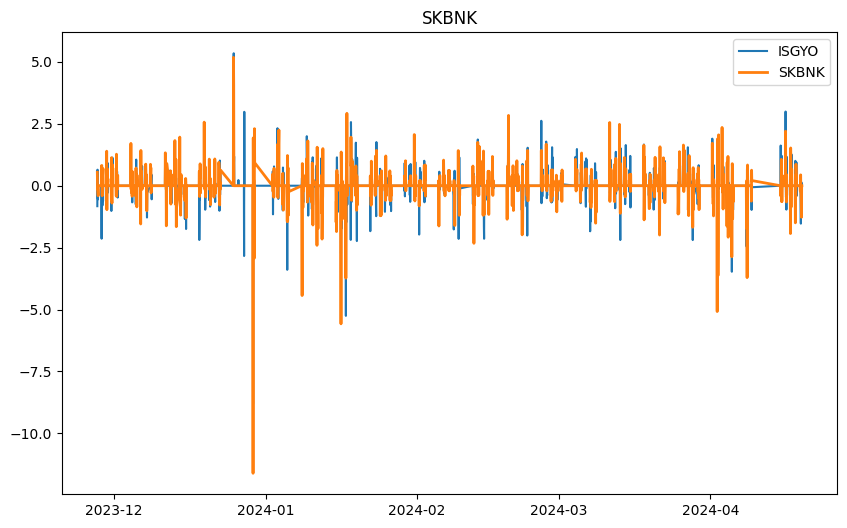

mkdir: OpenCloseChange: File exists


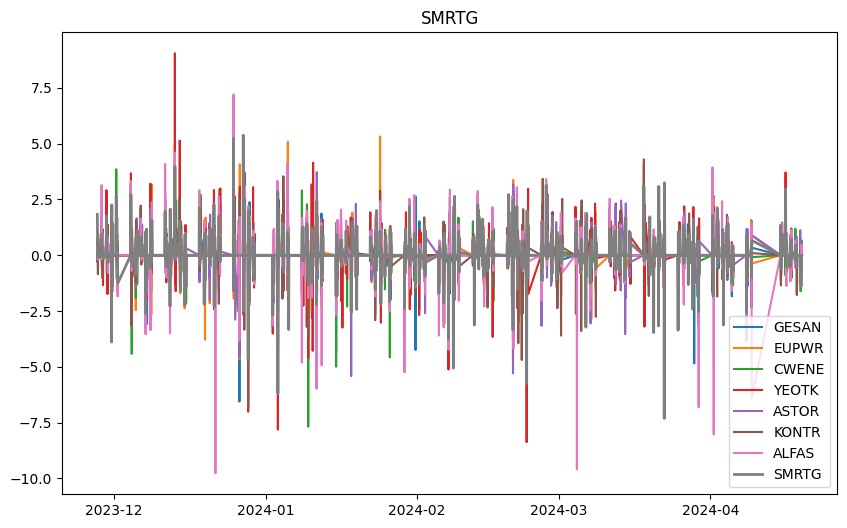

mkdir: OpenCloseChange: File exists


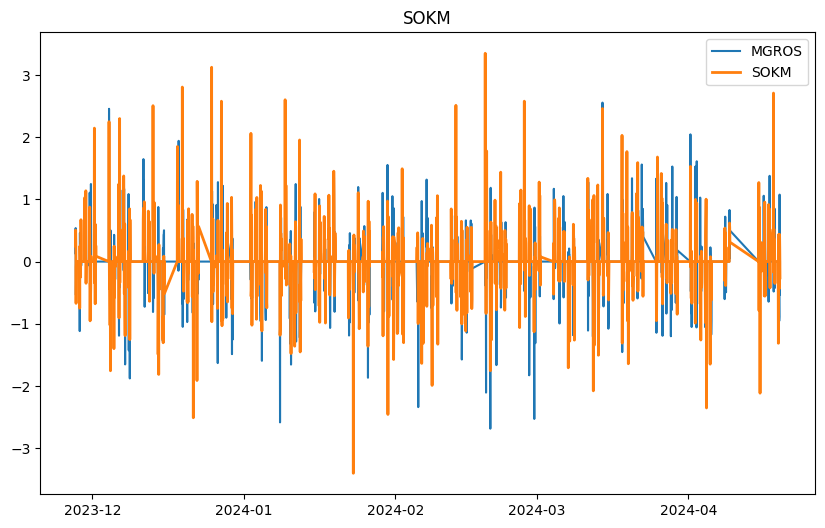

mkdir: OpenCloseChange: File exists


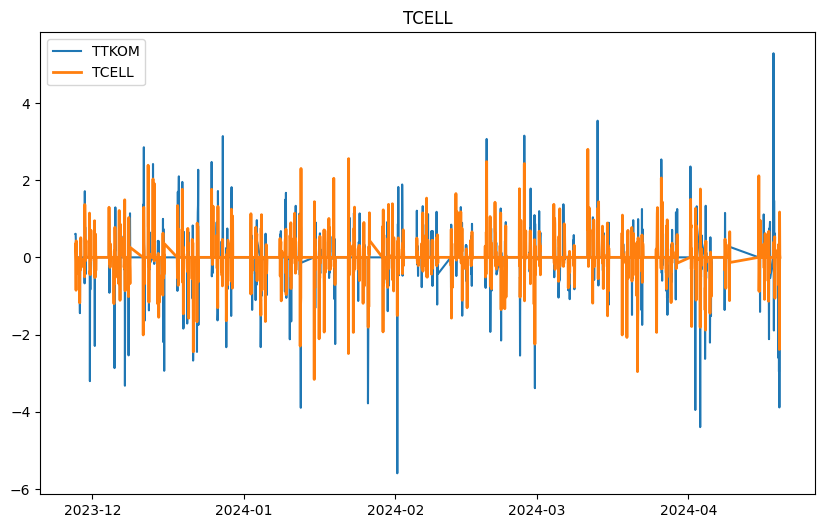

mkdir: OpenCloseChange: File exists


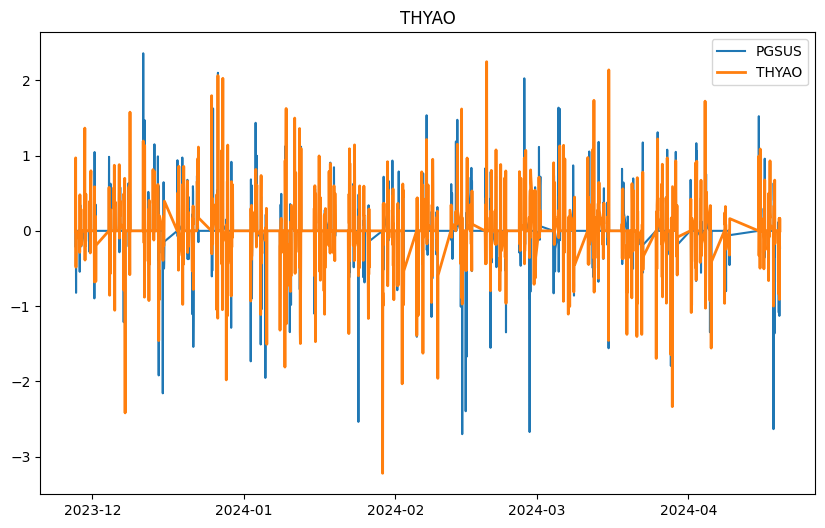

mkdir: OpenCloseChange: File exists


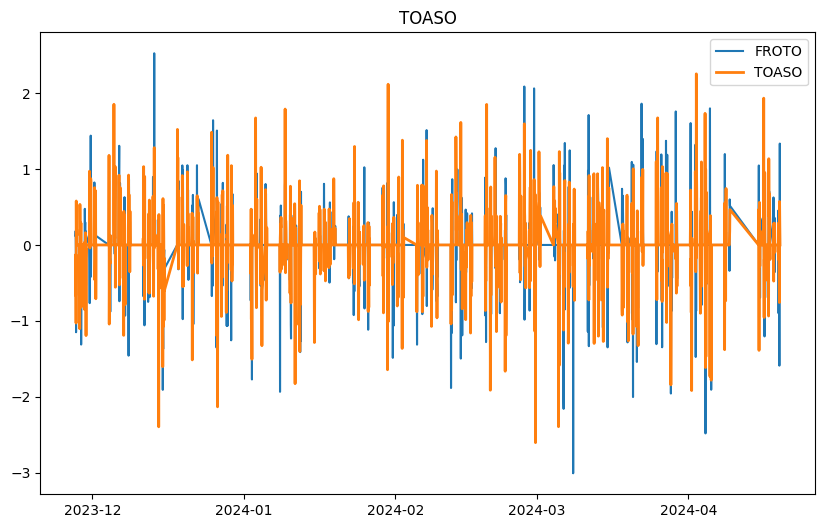

mkdir: OpenCloseChange: File exists


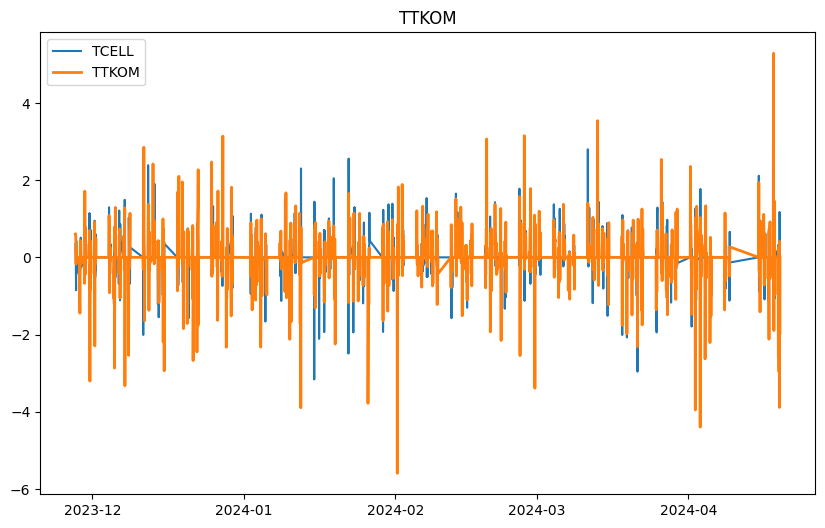

mkdir: OpenCloseChange: File exists


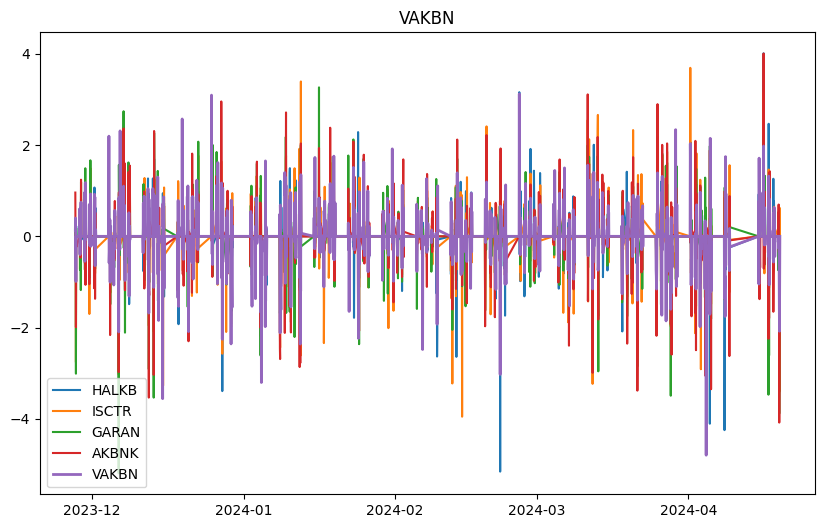

mkdir: OpenCloseChange: File exists


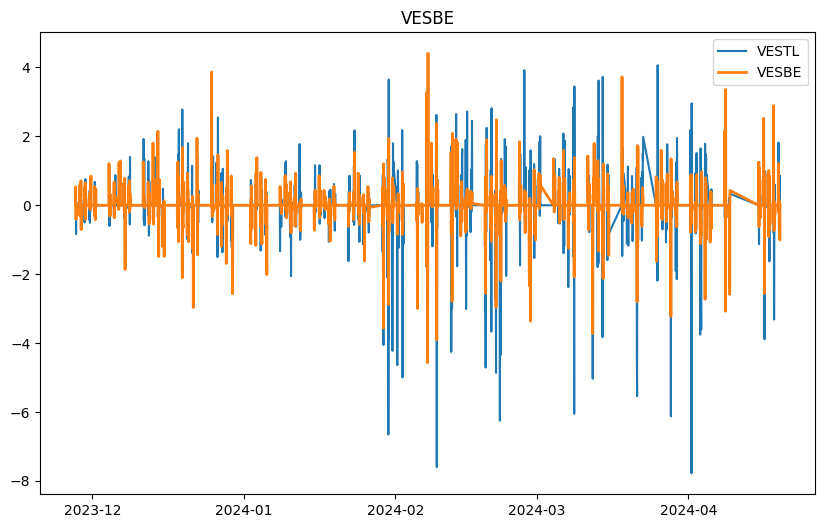

mkdir: OpenCloseChange: File exists


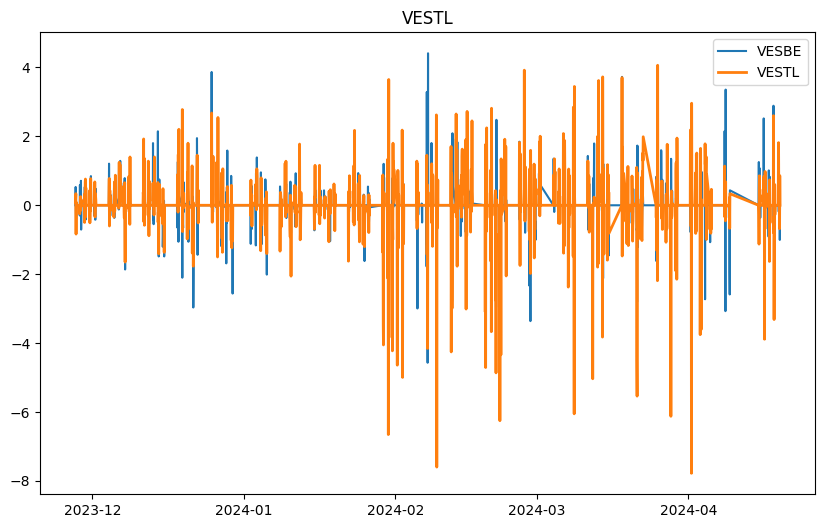

mkdir: OpenCloseChange: File exists


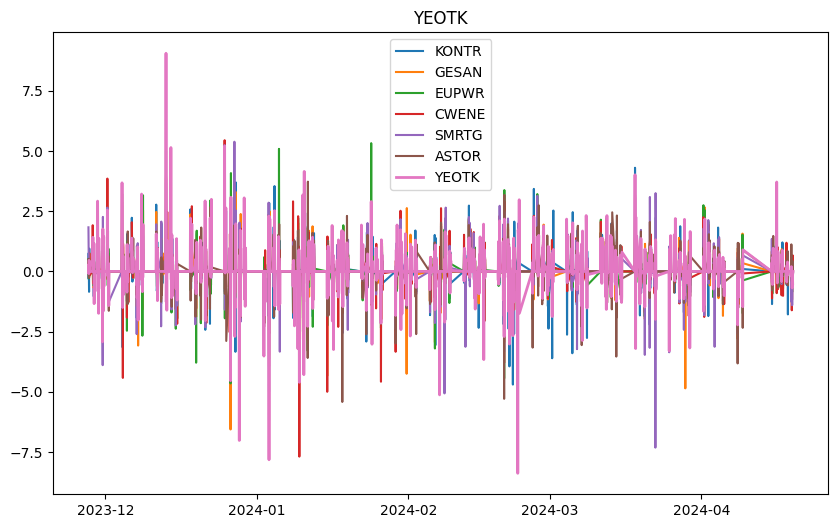

mkdir: OpenCloseChange: File exists


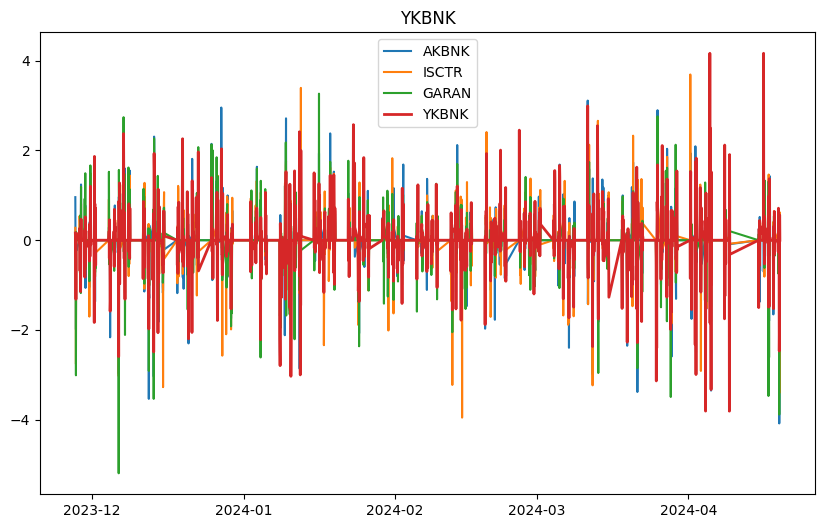

In [112]:
for stocks in correlated_stocks:
    if(len(correlated_stocks[stocks]) != 0):
        plt.figure(figsize=(10, 6))
        plt.title(stocks)
        for stock in correlated_stocks[stocks]:
            plt.plot(dict_stocks[stock]['change_oc_percentage'], label=stock)
        plt.plot(dict_stocks[stocks]['change_oc_percentage'], label=stocks, linewidth=2)
        plt.legend()
        ## save the plot to the OpenCloseChange folder
        ## craete the folder if it does not exist
        os.system("mkdir OpenCloseChange")
        plt.savefig("OpenCloseChange/"+stocks+".png")
        plt.show()


mkdir: NormalizedClose: File exists


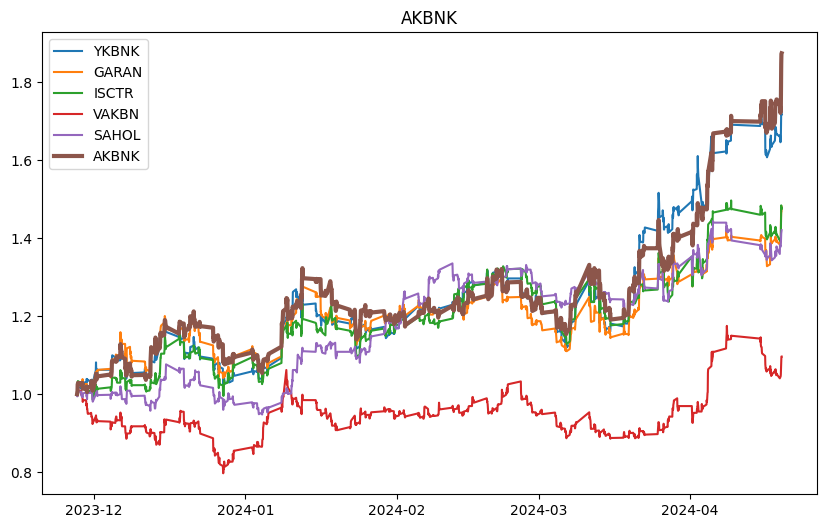

mkdir: NormalizedClose: File exists


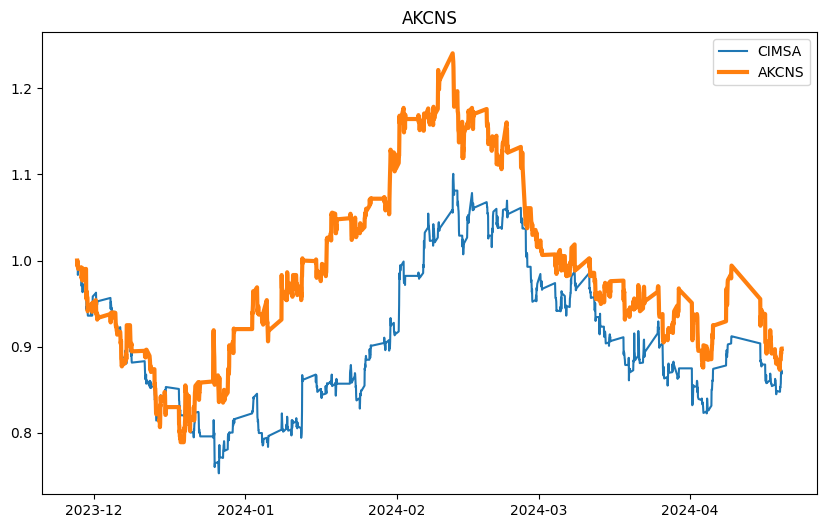

mkdir: NormalizedClose: File exists


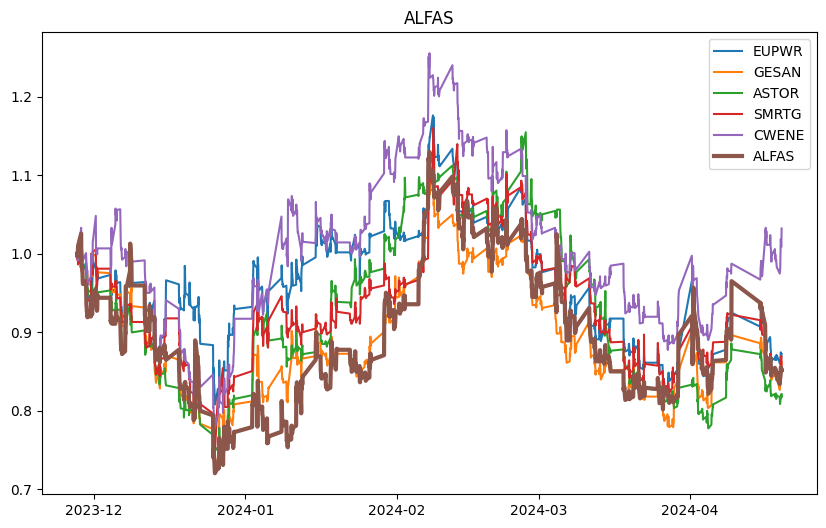

mkdir: NormalizedClose: File exists


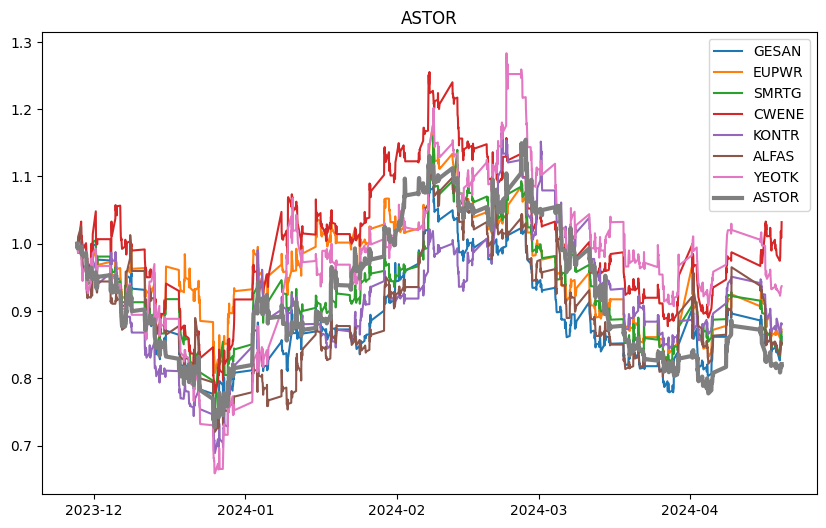

mkdir: NormalizedClose: File exists


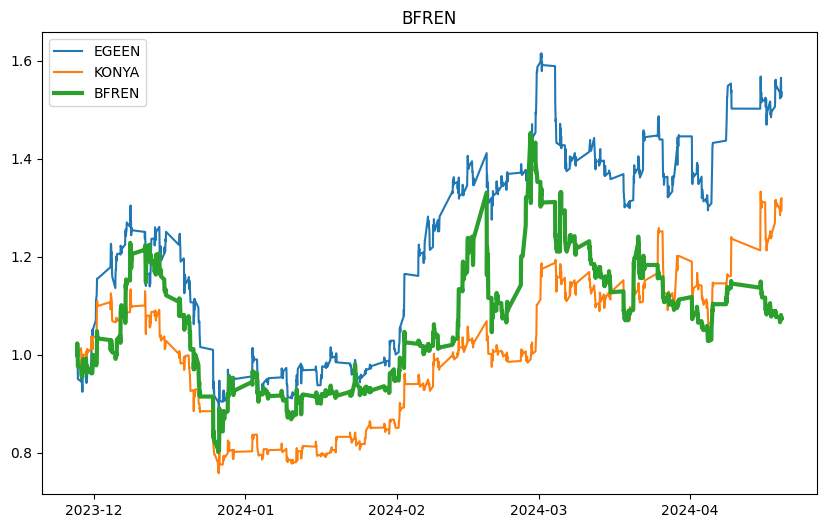

mkdir: NormalizedClose: File exists


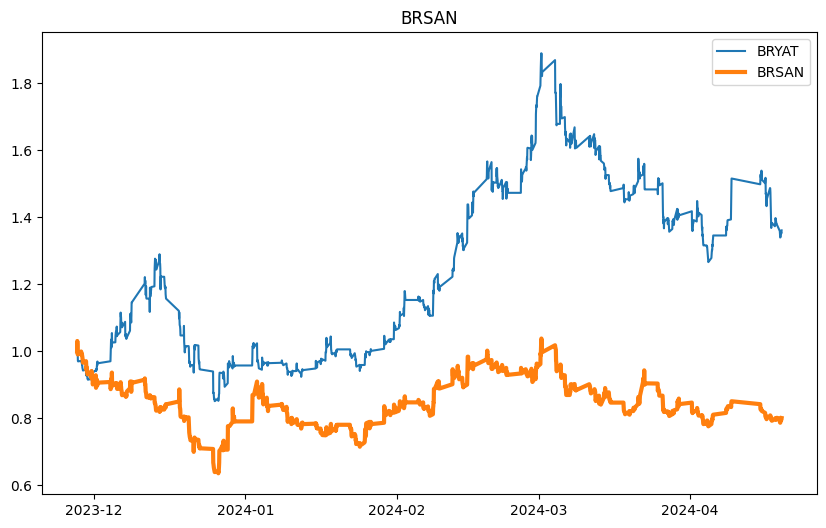

mkdir: NormalizedClose: File exists


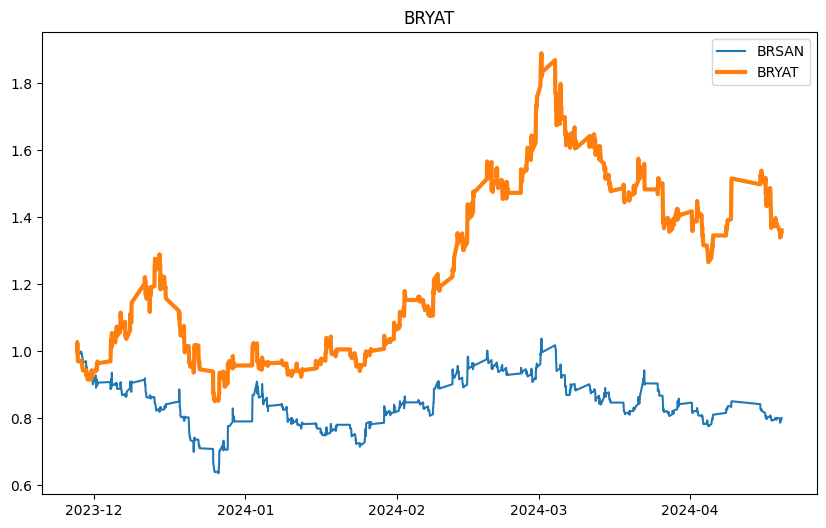

mkdir: NormalizedClose: File exists


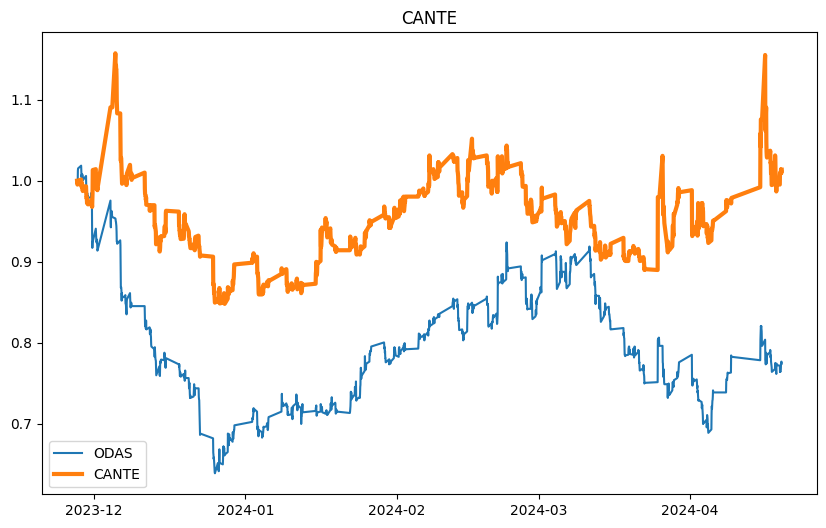

mkdir: NormalizedClose: File exists


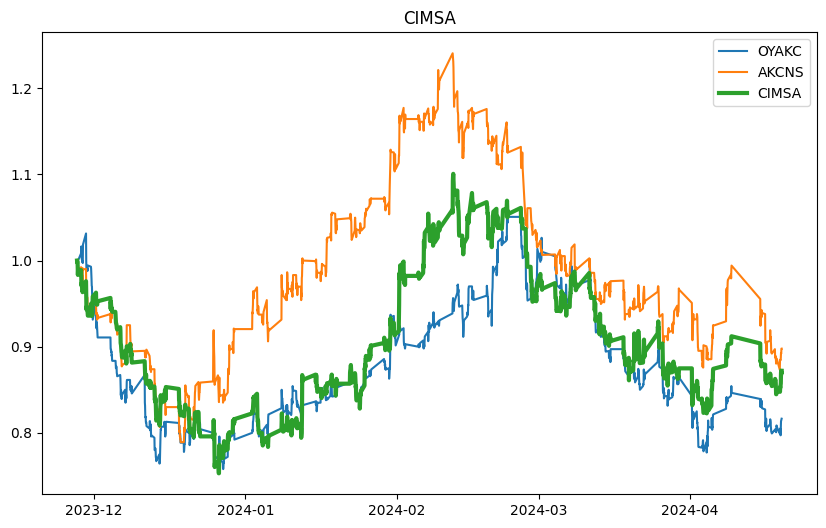

mkdir: NormalizedClose: File exists


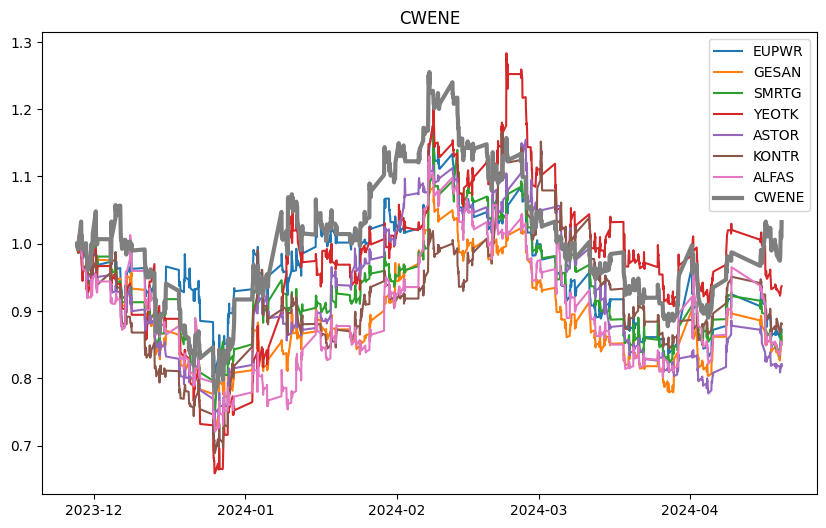

mkdir: NormalizedClose: File exists


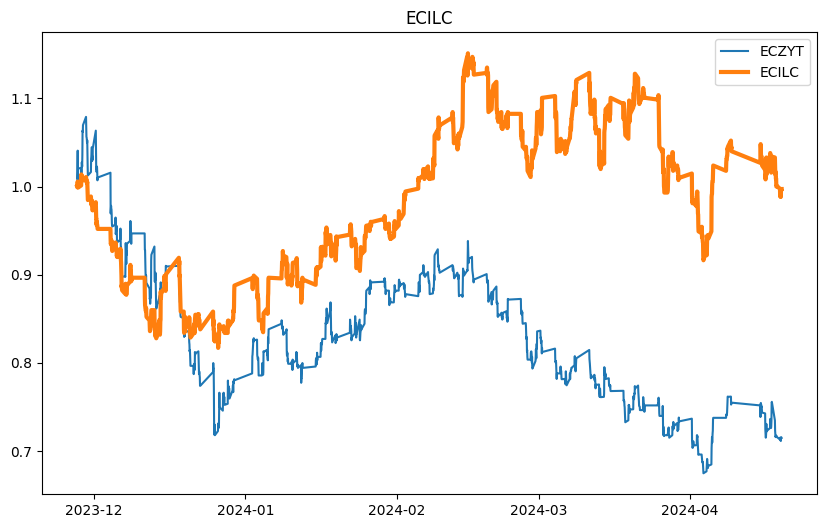

mkdir: NormalizedClose: File exists


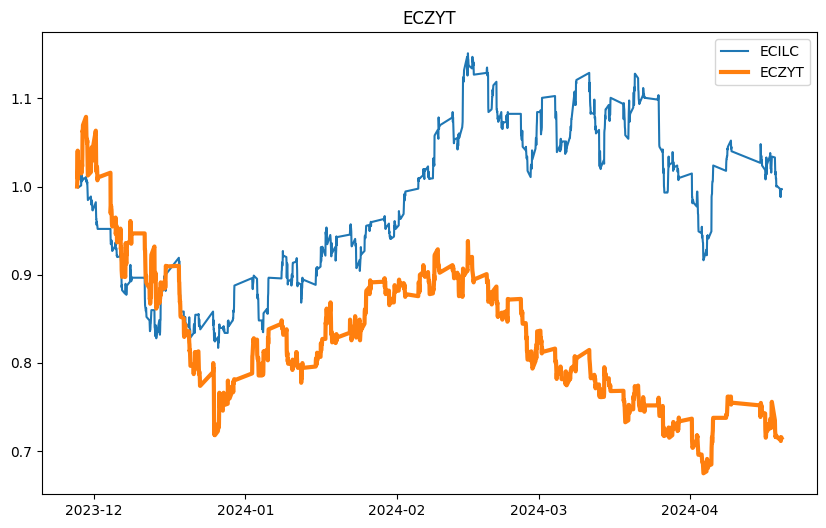

mkdir: NormalizedClose: File exists


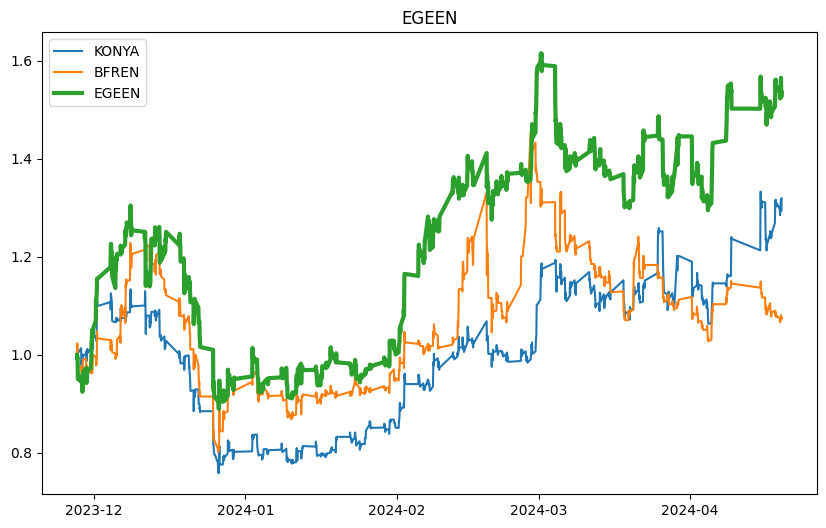

mkdir: NormalizedClose: File exists


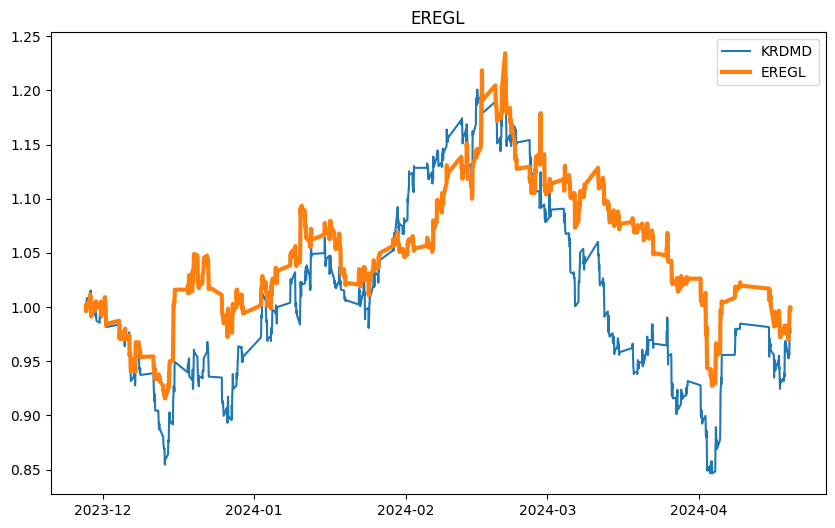

mkdir: NormalizedClose: File exists


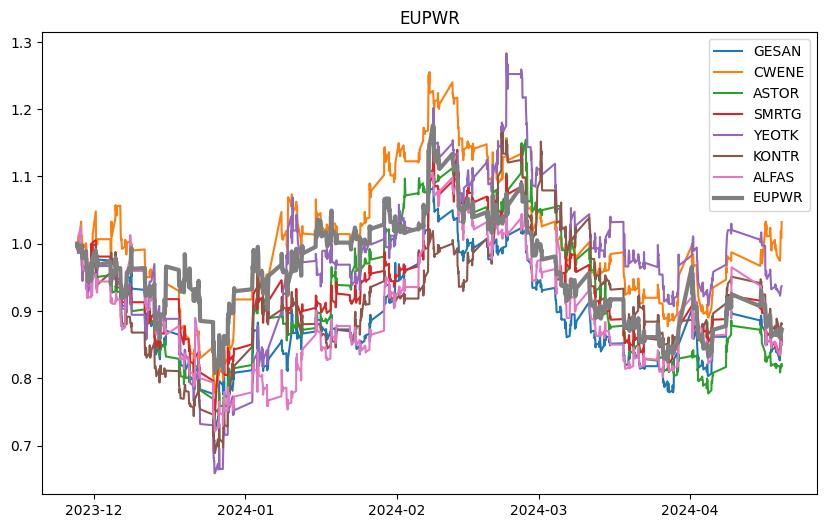

mkdir: NormalizedClose: File exists


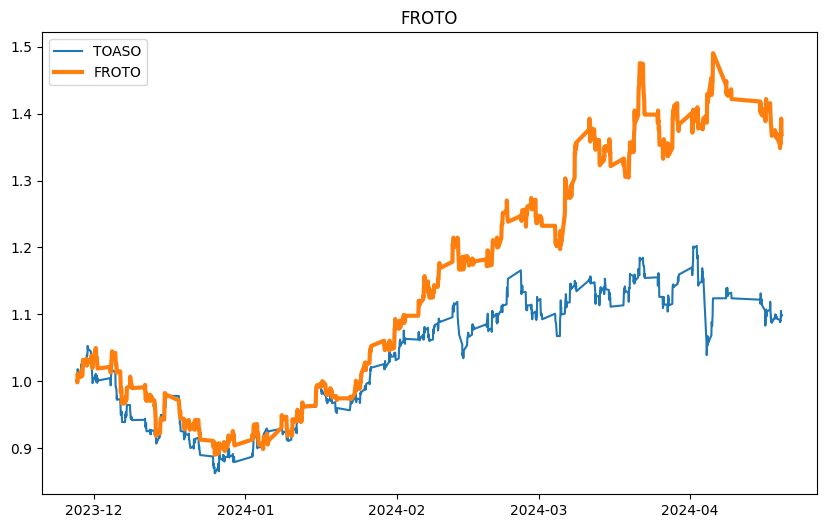

mkdir: NormalizedClose: File exists


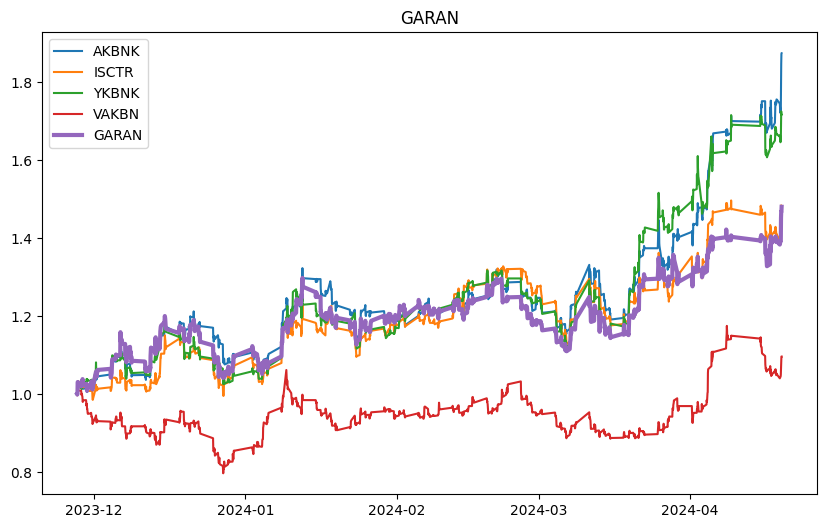

mkdir: NormalizedClose: File exists


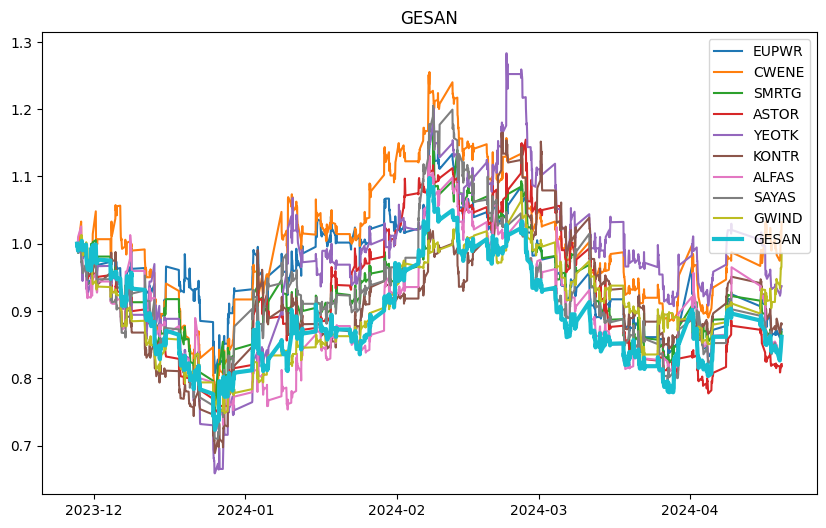

mkdir: NormalizedClose: File exists


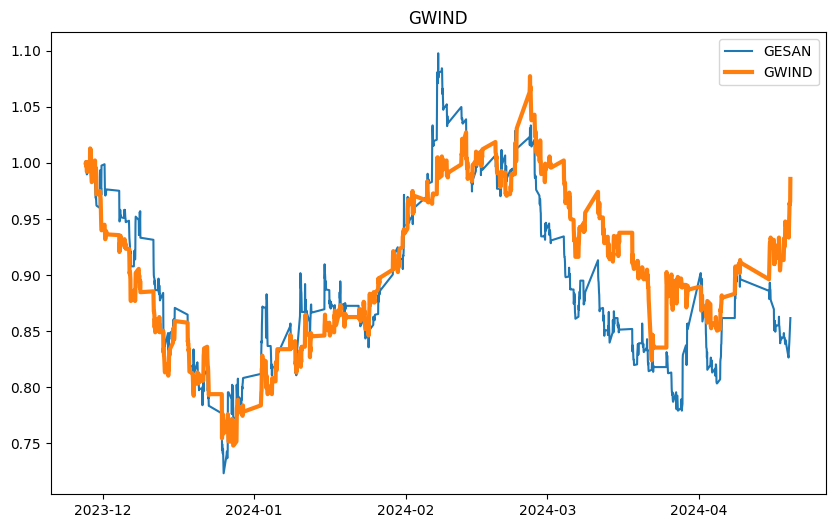

mkdir: NormalizedClose: File exists


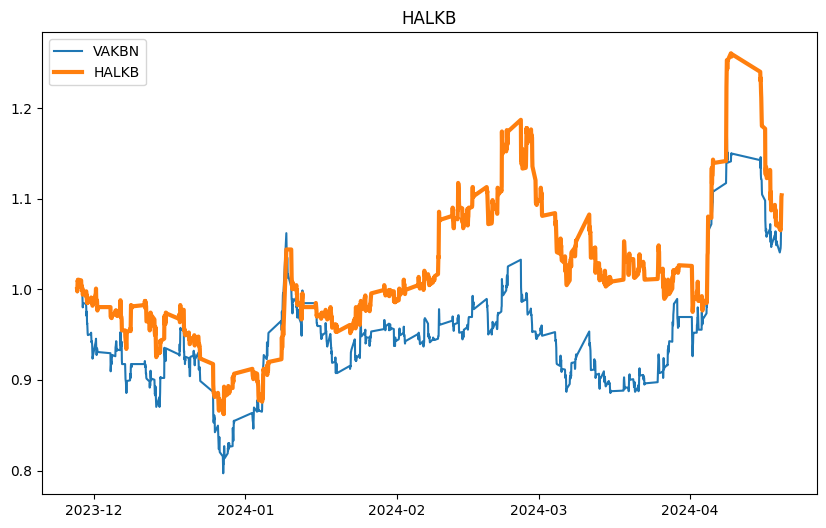

mkdir: NormalizedClose: File exists


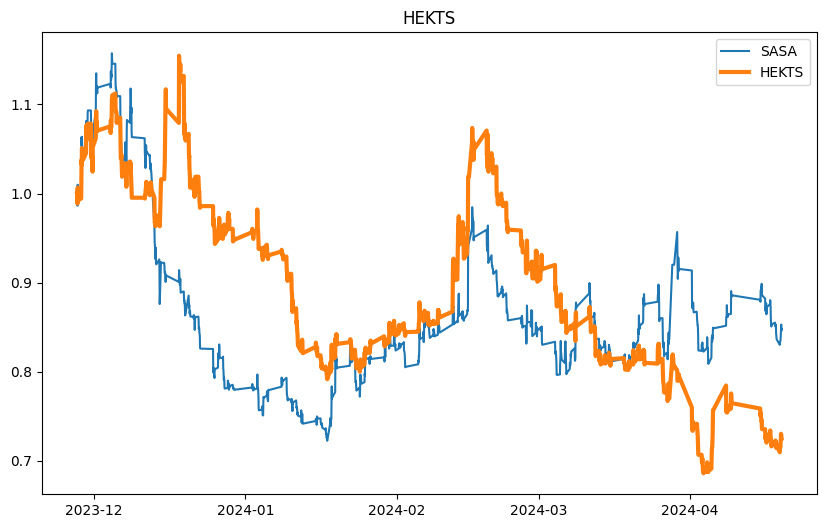

mkdir: NormalizedClose: File exists


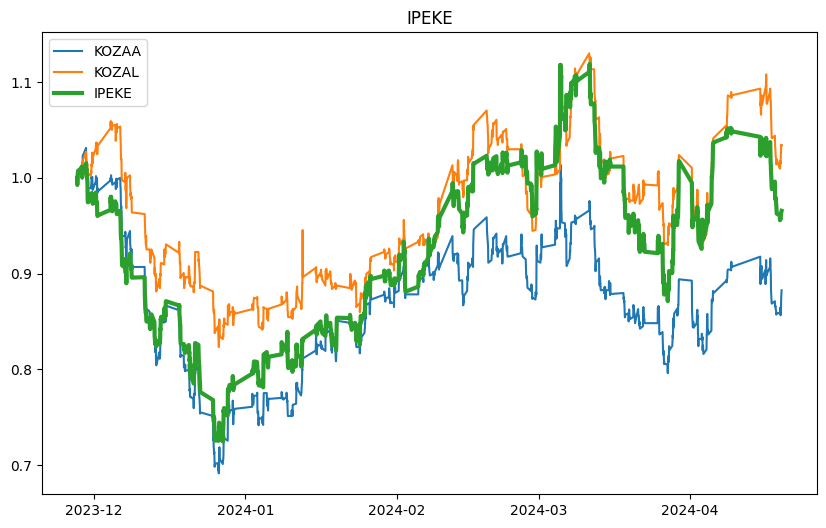

mkdir: NormalizedClose: File exists


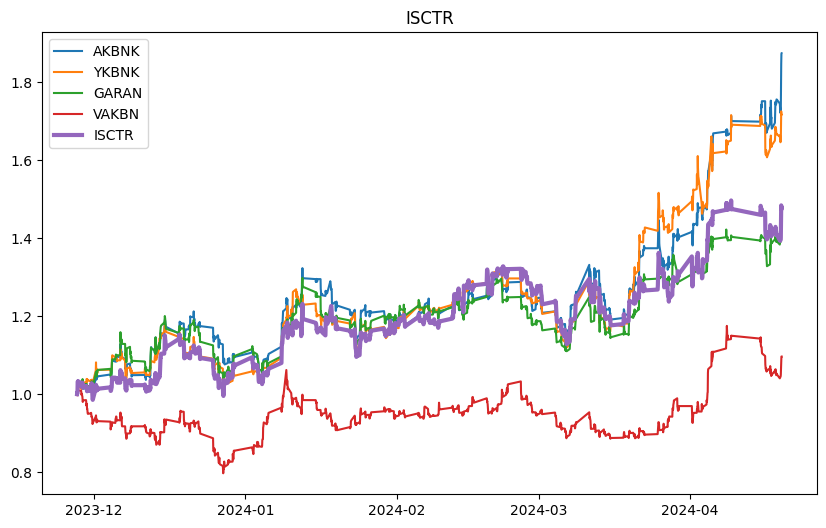

mkdir: NormalizedClose: File exists


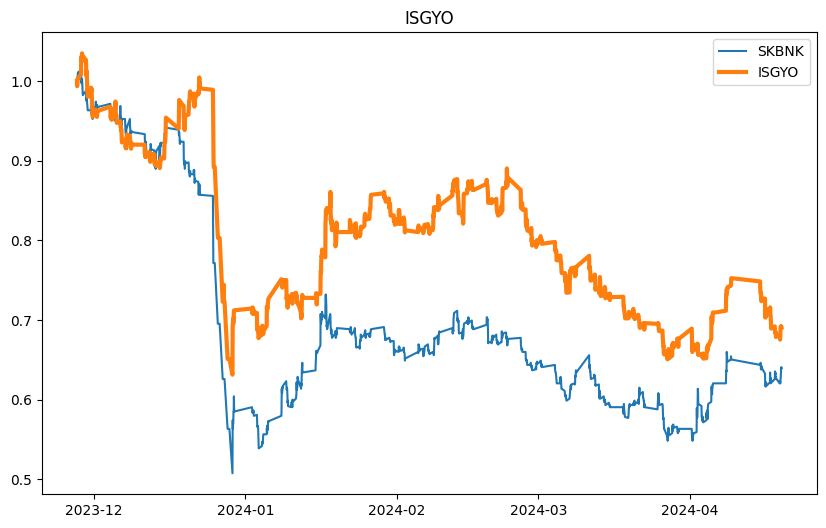

mkdir: NormalizedClose: File exists


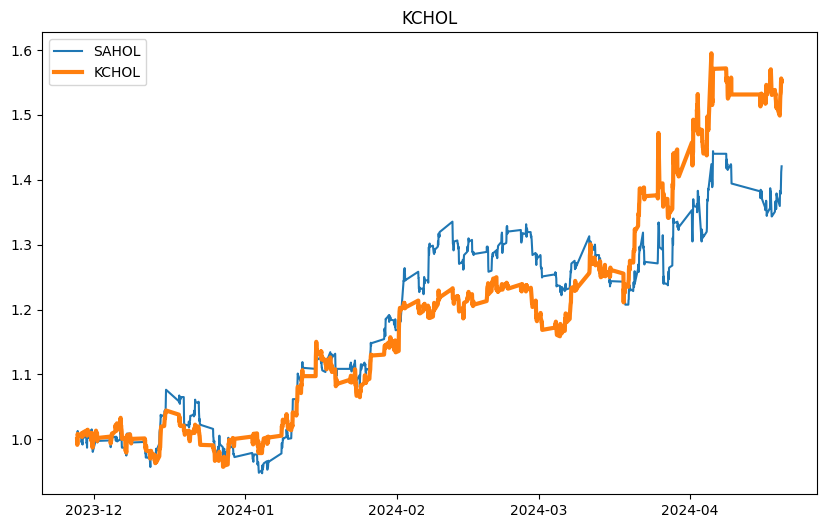

mkdir: NormalizedClose: File exists


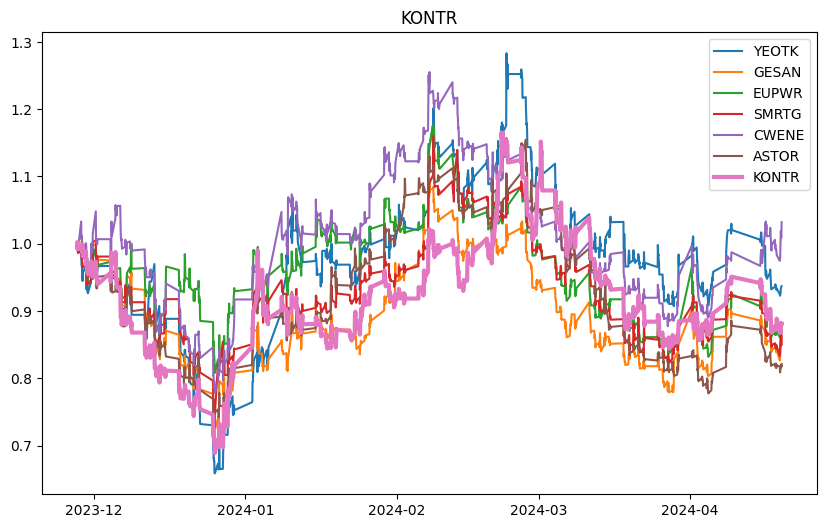

mkdir: NormalizedClose: File exists


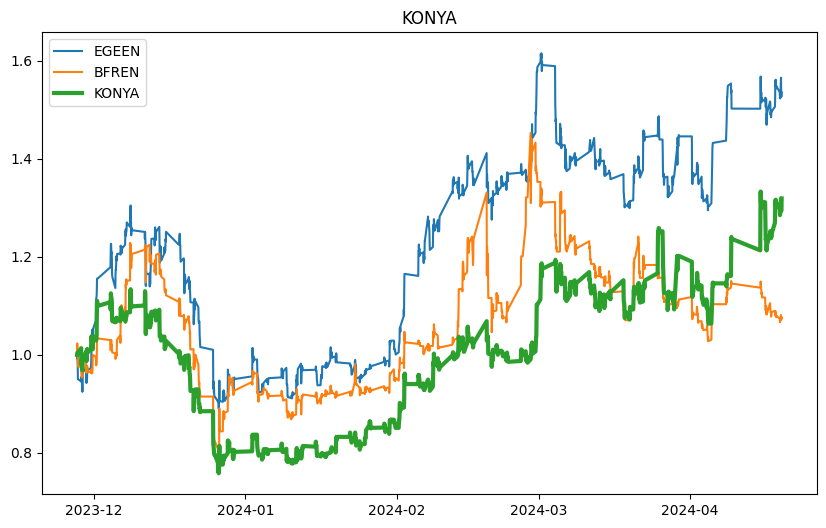

mkdir: NormalizedClose: File exists


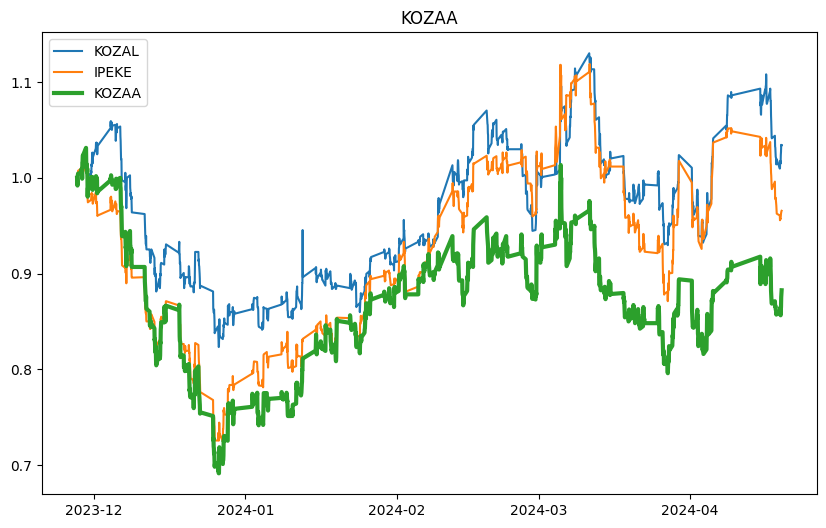

mkdir: NormalizedClose: File exists


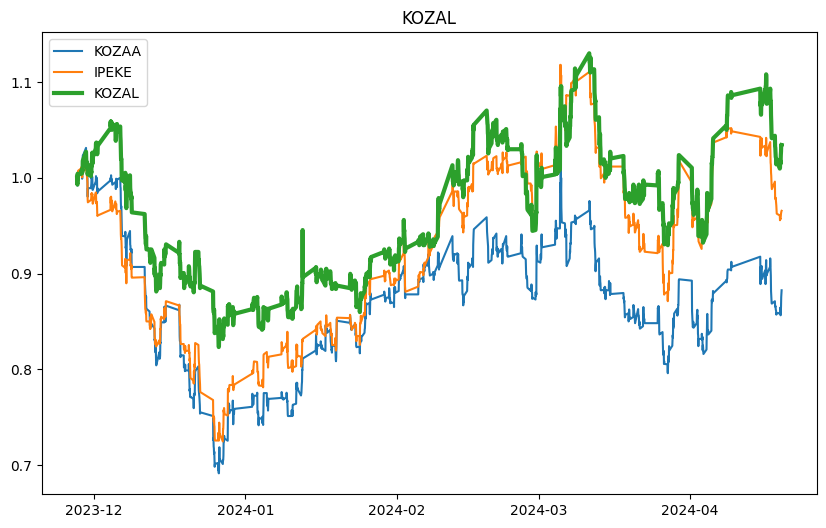

mkdir: NormalizedClose: File exists


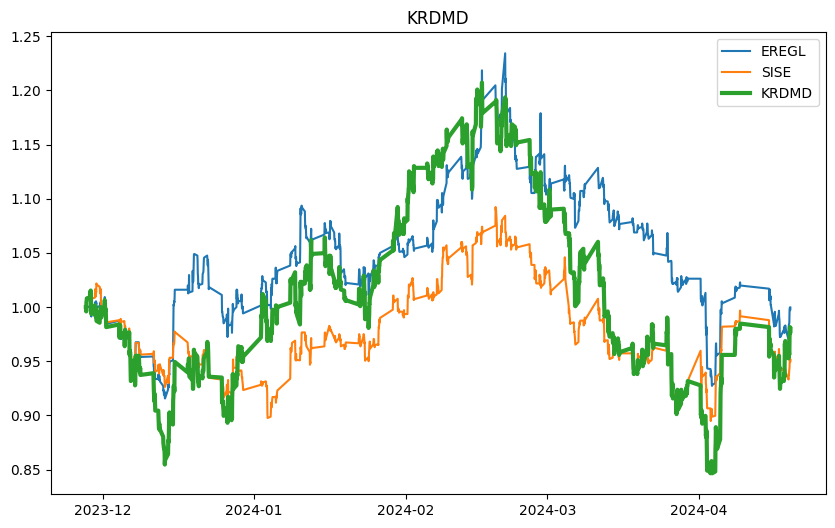

mkdir: NormalizedClose: File exists


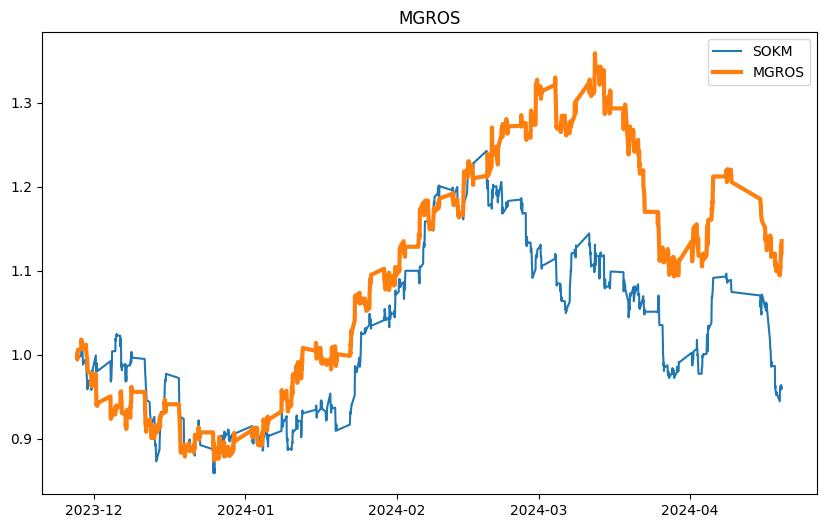

mkdir: NormalizedClose: File exists


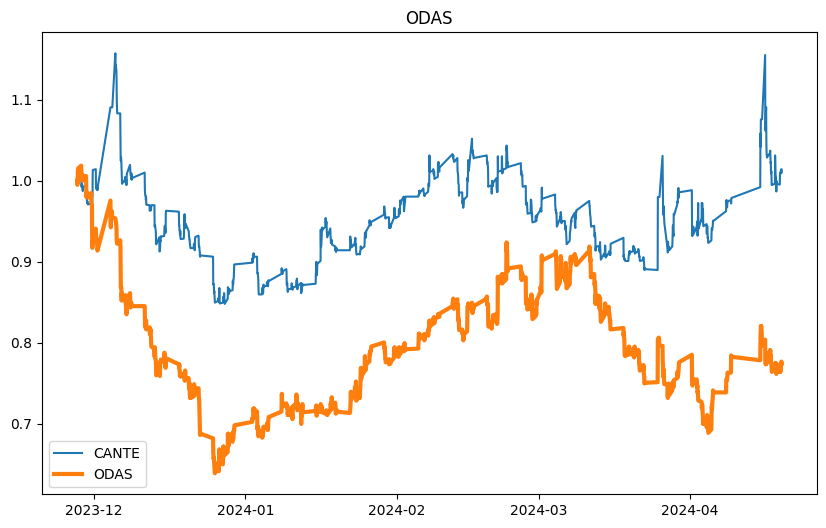

mkdir: NormalizedClose: File exists


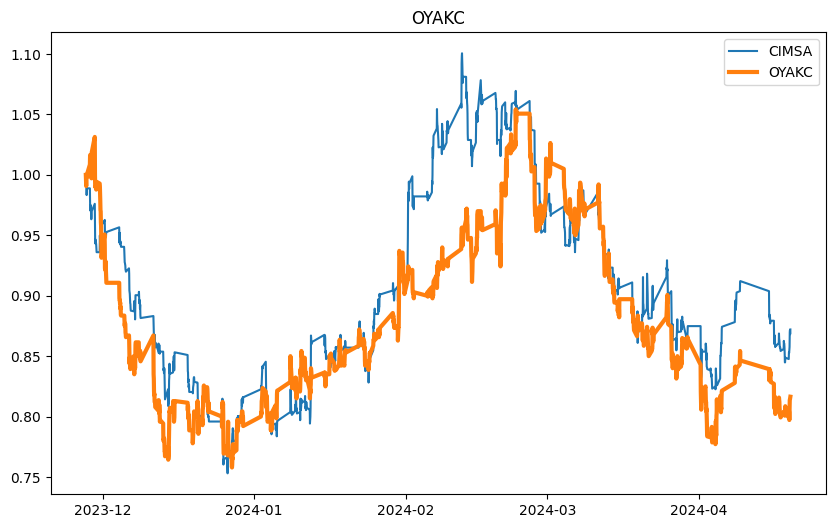

mkdir: NormalizedClose: File exists


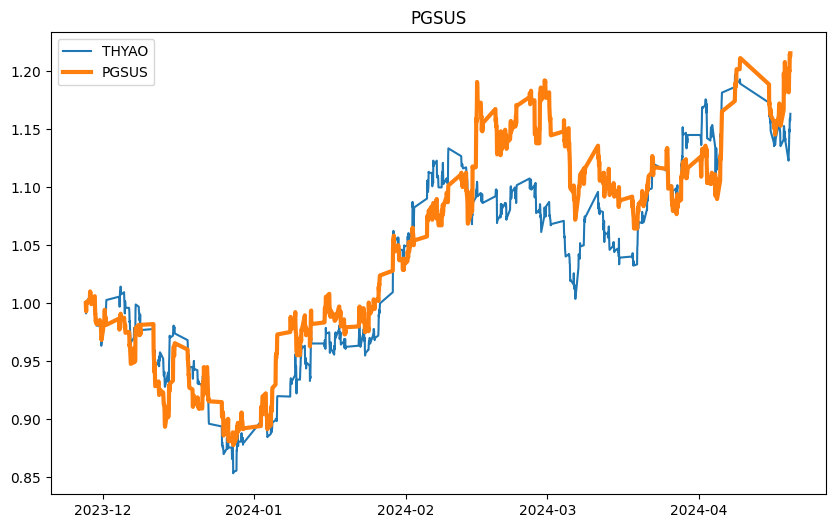

mkdir: NormalizedClose: File exists


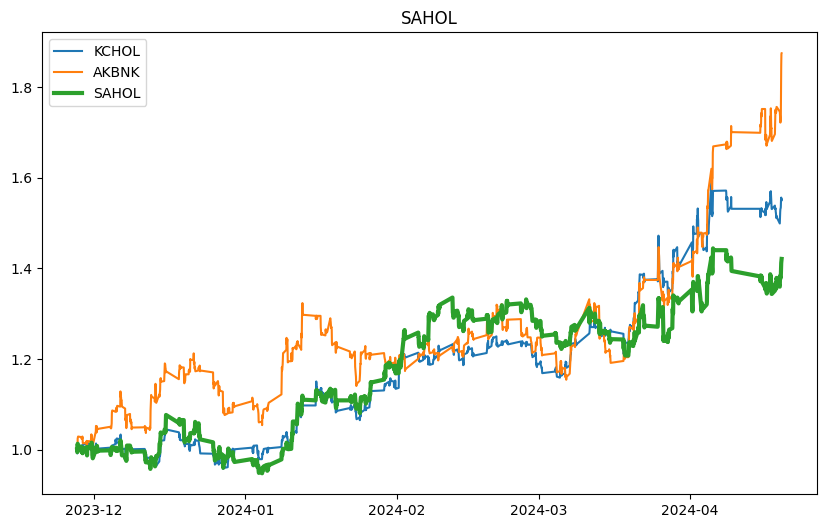

mkdir: NormalizedClose: File exists


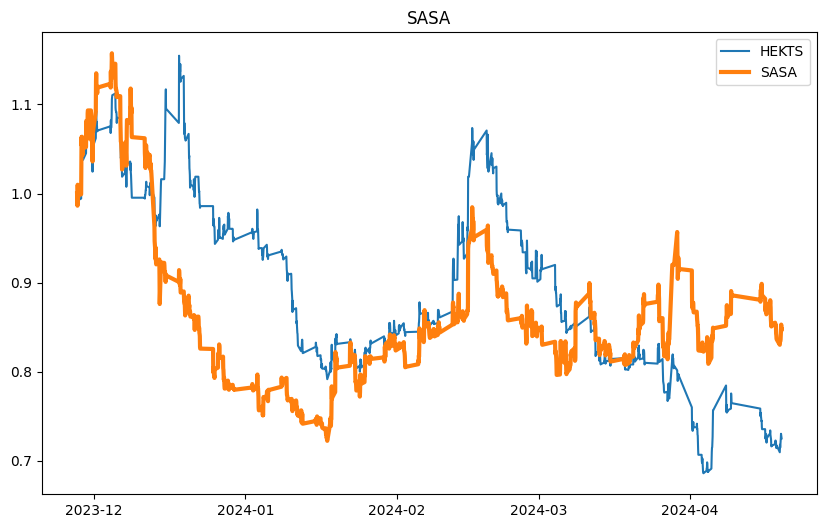

mkdir: NormalizedClose: File exists


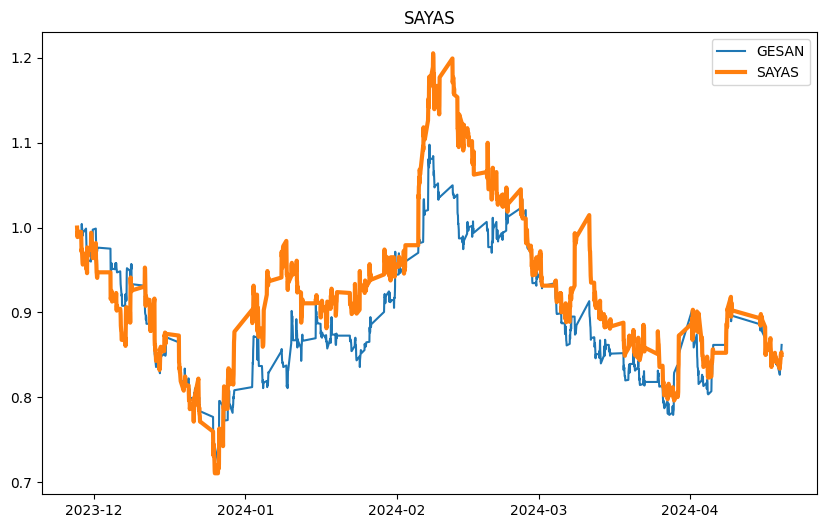

mkdir: NormalizedClose: File exists


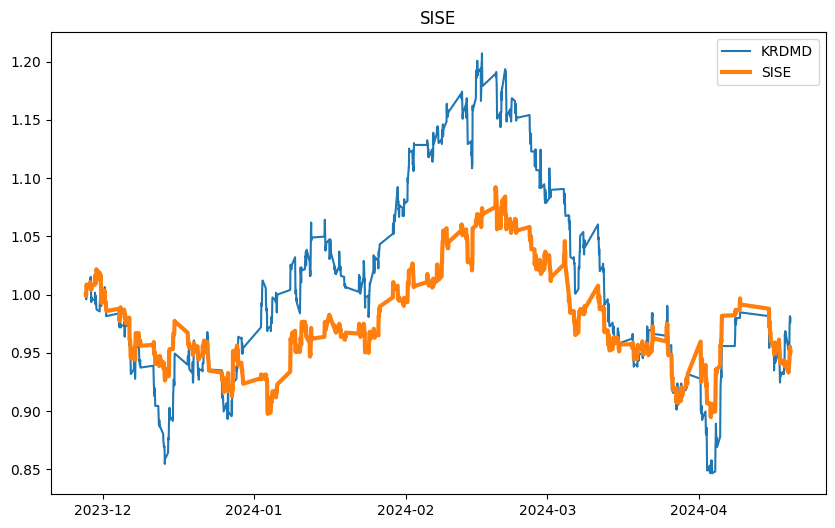

mkdir: NormalizedClose: File exists


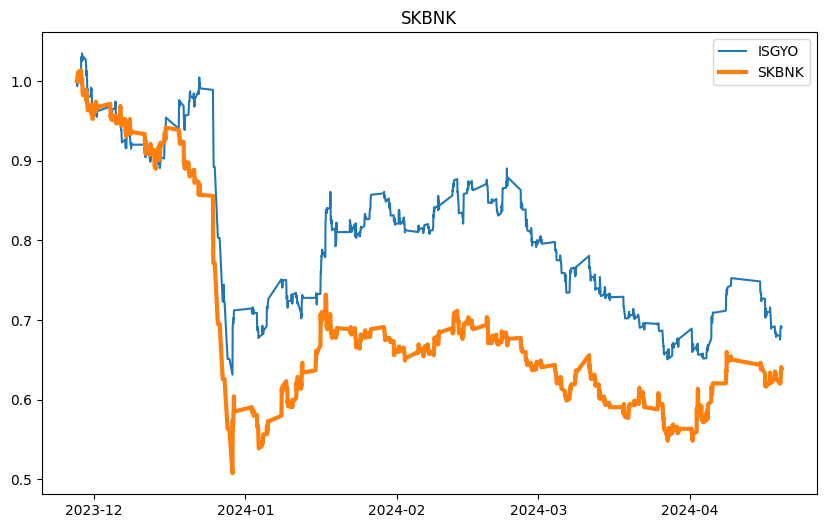

mkdir: NormalizedClose: File exists


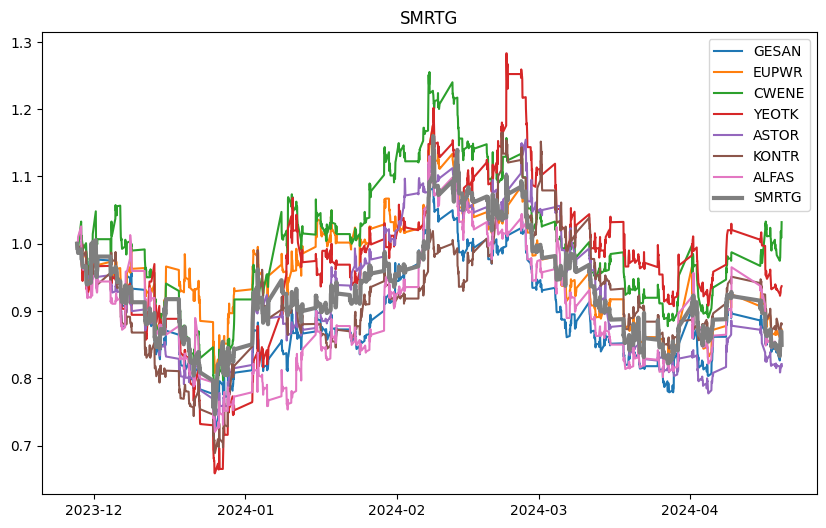

mkdir: NormalizedClose: File exists


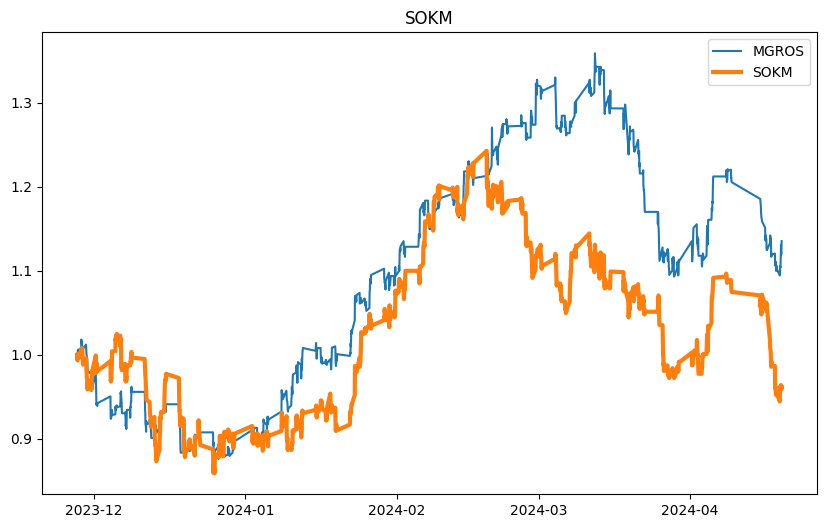

mkdir: NormalizedClose: File exists


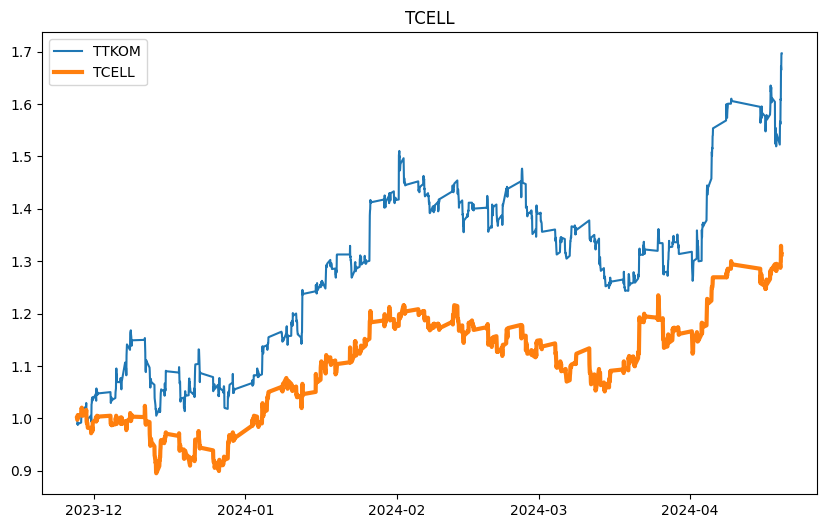

mkdir: NormalizedClose: File exists


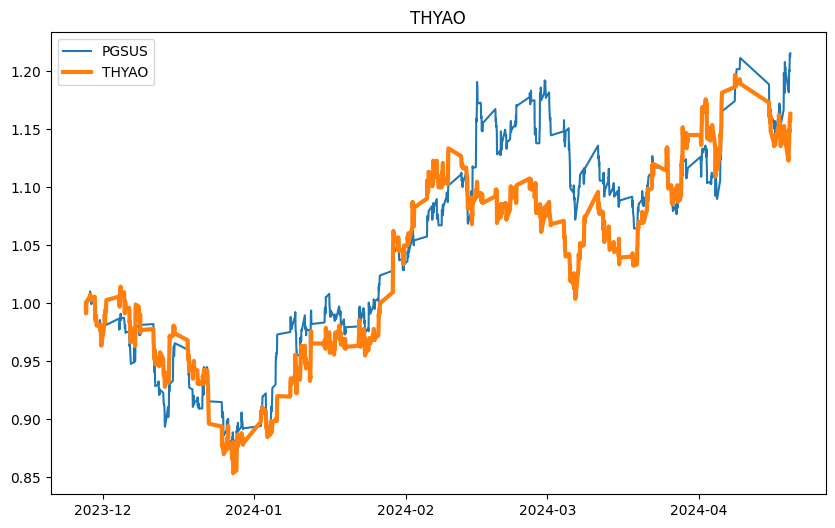

mkdir: NormalizedClose: File exists


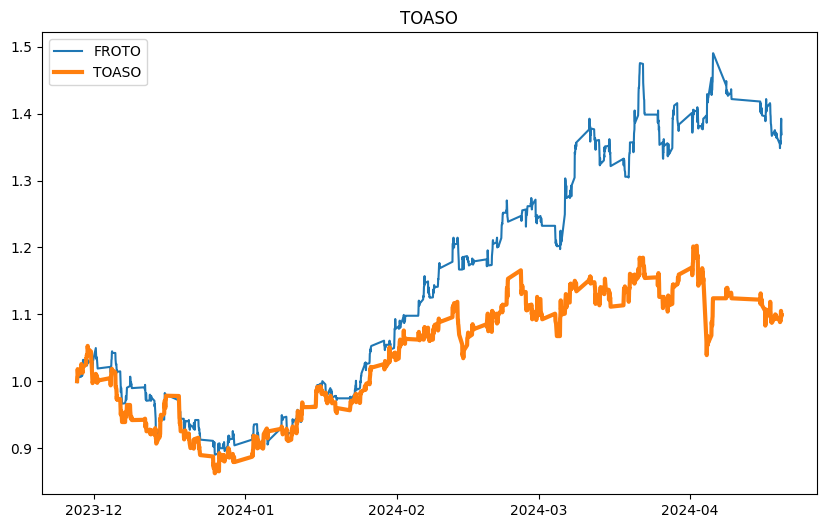

mkdir: NormalizedClose: File exists


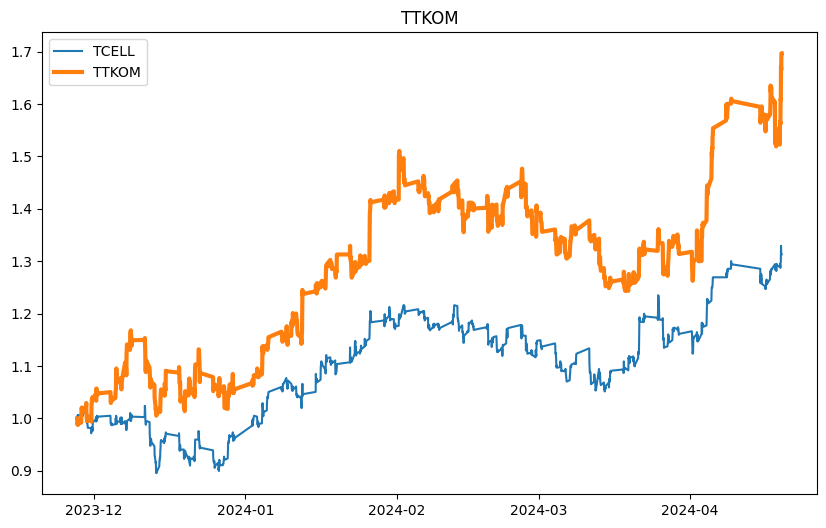

mkdir: NormalizedClose: File exists


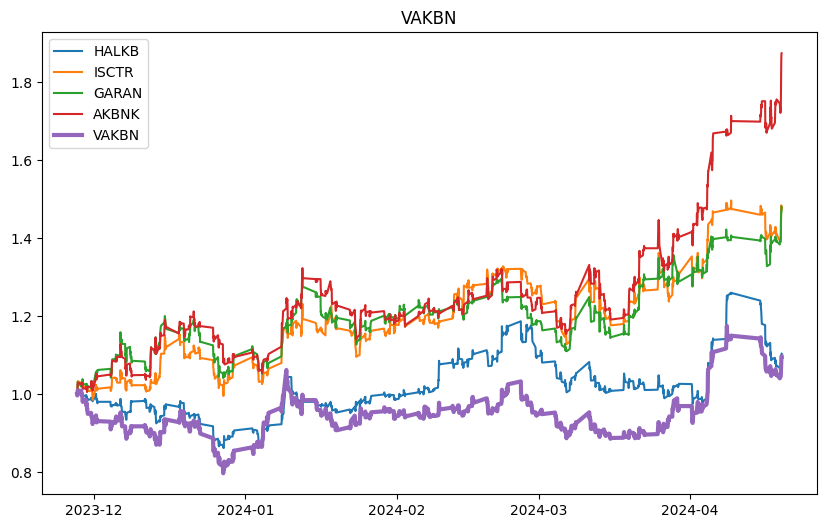

mkdir: NormalizedClose: File exists


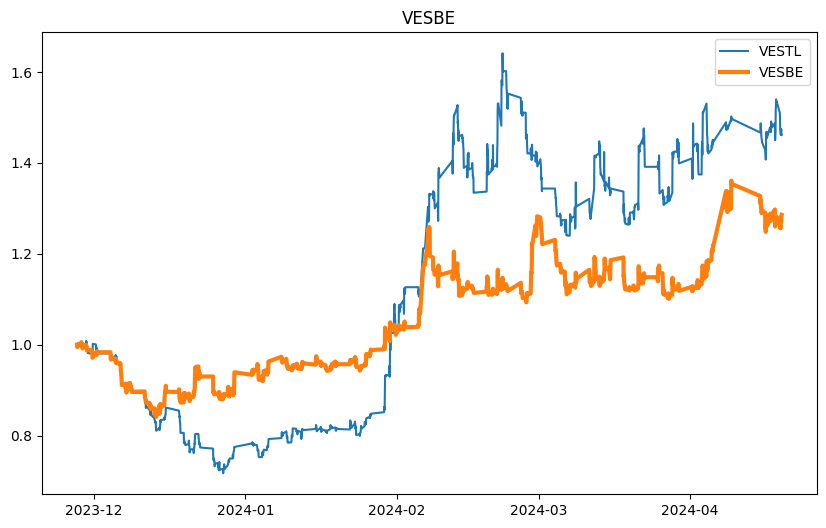

mkdir: NormalizedClose: File exists


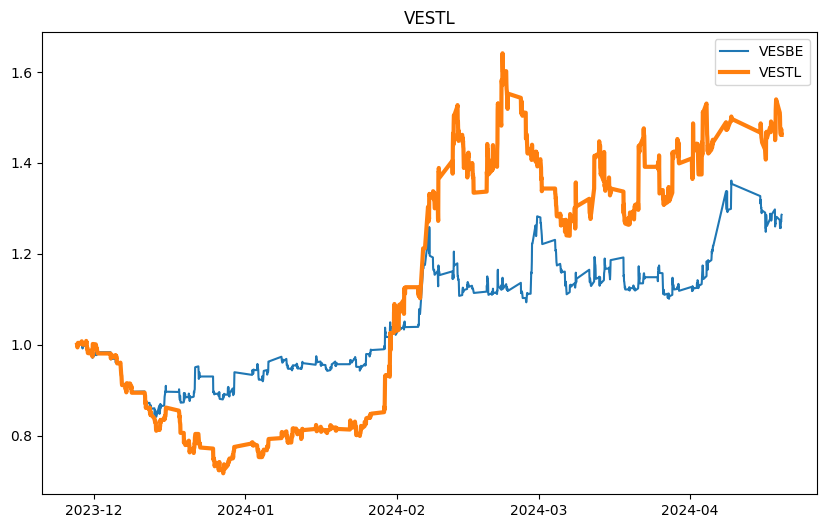

mkdir: NormalizedClose: File exists


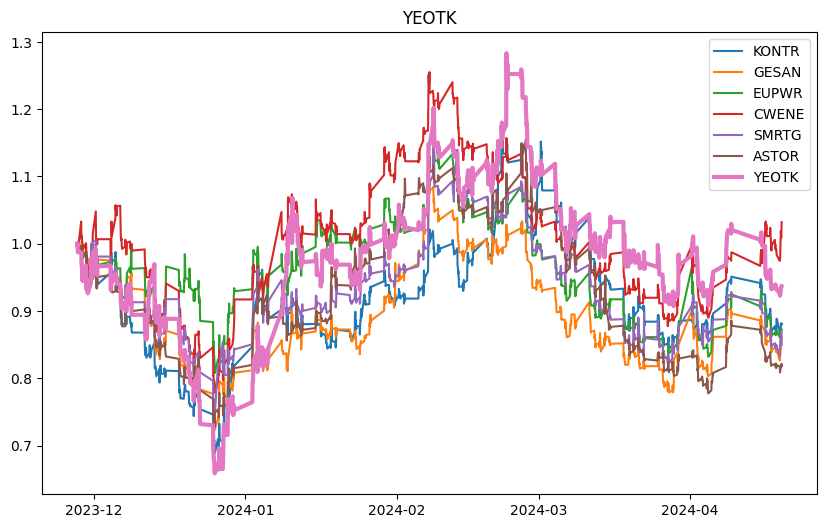

mkdir: NormalizedClose: File exists


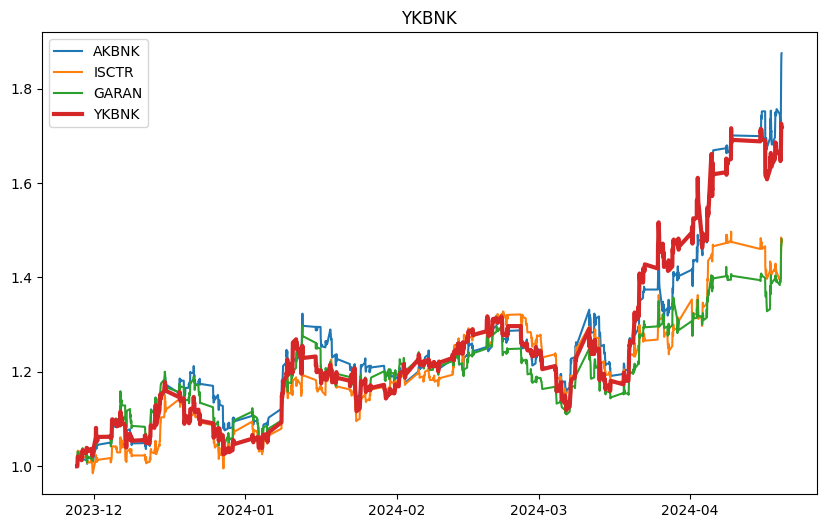

In [114]:
for stocks in correlated_stocks:
    if(len(correlated_stocks[stocks]) != 0):
        plt.figure(figsize=(10, 6))
        plt.title(stocks)
        for stock in correlated_stocks[stocks]:
            plt.plot(dict_stocks[stock]['normalized_close'], label=stock)
        plt.plot(dict_stocks[stocks]['normalized_close'], label=stocks, linewidth=3)
        plt.legend()
        ## save the plot to the OpenCloseChange folder
        ## craete the folder if it does not exist
        os.system("mkdir NormalizedClose")
        plt.savefig("NormalizedClose/"+stocks+".png")
        plt.show()

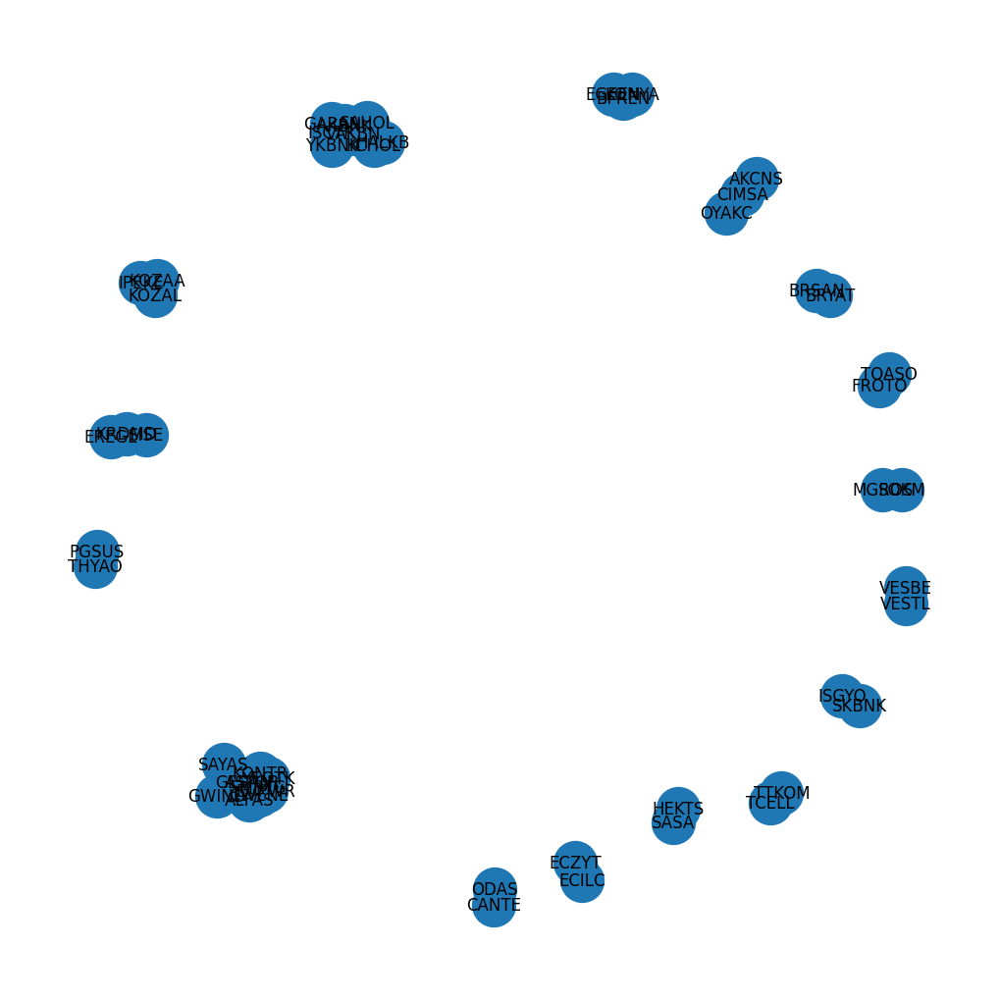

In [94]:
## Create the graph
import networkx as nx
import matplotlib.pyplot as plt
import math

G = nx.Graph()

for stock in stock_names:
    if(len(correlated_stocks[stock]) != 0):
        G.add_node(stock, color='blue', size=200, label=stock, title=stock, correlation=len(correlated_stocks[stock]))

for stock in stock_names:
    for correlated_stock in correlated_stocks[stock]:
        G.add_edge(stock, correlated_stock, weight=1, color='black', title=stock+"-"+correlated_stock, correlation=correlation_matrix[stock][correlated_stock])

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G,scale=2,iterations=400,seed=42,k=5/math.sqrt(G.order()))
nx.draw(G, pos, node_size=1000, with_labels=True)
plt.show()


## Open Close Change Rate Clustering Analysis
* We will use the KMeans, PCA, t-SNE, and dendrogram algorithms to cluster the stocks.
* We will use the elbow method to find the optimal number of clusters.
* We will use the silhouette score to evaluate the clusters.

### But first...
* We need to vectorize the data.
* We will use the daily change rate of the stocks.

In [116]:
vectorized_data = []
for stock in stock_names:
    vectorized_data.append(dict_stocks[stock]['change_oc_percentage'].values)
vectorized_data = np.array(vectorized_data)

In [119]:
print(vectorized_data.shape)

(100, 1000)


Since these are the change rates, we don't need to normalize the data.

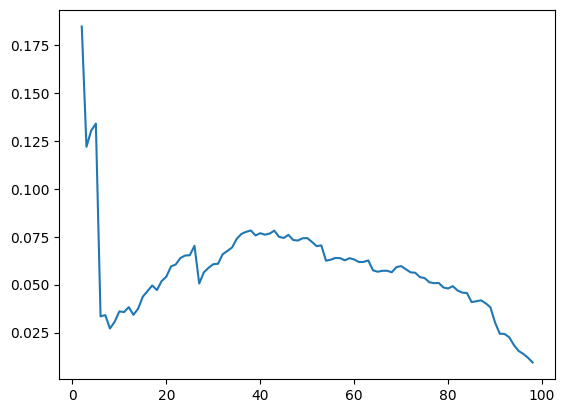

In [165]:
## I want to cluster the stocks based on their open-close change percentage without knowing the number of clusters
## I will use the Agglomerative Clustering algorithm for this purpose
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

silhouette_scores = []
for i in range(2, 99):
    clustering = AgglomerativeClustering(n_clusters=i).fit(vectorized_data)
    silhouette_scores.append(silhouette_score(vectorized_data, clustering.labels_))

plt.plot(range(2, 99), silhouette_scores)
plt.show()

In [167]:
clustering = AgglomerativeClustering(n_clusters=40).fit(vectorized_data)

for i in range(40):
    print("Cluster ", i)
    print(np.array(stock_names)[clustering.labels_ == i])
    print("")


Cluster  0
['VESBE' 'VESTL']

Cluster  1
['BIENY' 'KAYSE' 'KLSER' 'TUKAS' 'YYLGD']

Cluster  2
['AKSEN' 'ALARK' 'BIOEN' 'ENJSA' 'GWIND' 'TKFEN']

Cluster  3
['ALBRK' 'HALKB' 'ISGYO' 'SKBNK' 'TSKB' 'VAKBN']

Cluster  4
['BRSAN' 'BRYAT']

Cluster  5
['ARCLK' 'ASELS' 'DOHOL' 'EKGYO' 'ENKAI' 'EREGL' 'FROTO' 'KCHOL' 'KRDMD'
 'PETKM' 'PGSUS' 'SAHOL' 'SISE' 'TAVHL' 'THYAO' 'TOASO' 'TUPRS']

Cluster  6
['ANSGR' 'TURSG']

Cluster  7
['EGEEN' 'KONYA']

Cluster  8
['AKSA' 'DOAS' 'ISMEN' 'OTKAR' 'TTRAK']

Cluster  9
['AEFES' 'CCOLA']

Cluster  10
['BIMAS' 'MGROS' 'SOKM' 'ULKER']

Cluster  11
['HEKTS' 'SASA']

Cluster  12
['KONTR' 'YEOTK']

Cluster  13
['AKBNK' 'GARAN' 'ISCTR' 'YKBNK']

Cluster  14
['SAYAS']

Cluster  15
['TCELL' 'TTKOM']

Cluster  16
['ECILC' 'ECZYT']

Cluster  17
['ZOREN']

Cluster  18
['ASTOR' 'CWENE' 'EUPWR' 'GESAN' 'SMRTG']

Cluster  19
['CANTE' 'ODAS']

Cluster  20
['GUBRF']

Cluster  21
['ALFAS']

Cluster  22
['EUREN']

Cluster  23
['AKFYE']

Cluster  24
['BFREN']

Cluster  

In [170]:
## if the cluster is only 1 element, then remove it
clustered_stocks = {}
for i in range(40):
    clustered_stocks[i] = np.array(stock_names)[clustering.labels_ == i]
    if(len(clustered_stocks[i]) == 1):
        clustered_stocks.pop(i)

for i in clustered_stocks:
    print("Cluster ", i)
    print(clustered_stocks[i])
    print("")


Cluster  0
['VESBE' 'VESTL']

Cluster  1
['BIENY' 'KAYSE' 'KLSER' 'TUKAS' 'YYLGD']

Cluster  2
['AKSEN' 'ALARK' 'BIOEN' 'ENJSA' 'GWIND' 'TKFEN']

Cluster  3
['ALBRK' 'HALKB' 'ISGYO' 'SKBNK' 'TSKB' 'VAKBN']

Cluster  4
['BRSAN' 'BRYAT']

Cluster  5
['ARCLK' 'ASELS' 'DOHOL' 'EKGYO' 'ENKAI' 'EREGL' 'FROTO' 'KCHOL' 'KRDMD'
 'PETKM' 'PGSUS' 'SAHOL' 'SISE' 'TAVHL' 'THYAO' 'TOASO' 'TUPRS']

Cluster  6
['ANSGR' 'TURSG']

Cluster  7
['EGEEN' 'KONYA']

Cluster  8
['AKSA' 'DOAS' 'ISMEN' 'OTKAR' 'TTRAK']

Cluster  9
['AEFES' 'CCOLA']

Cluster  10
['BIMAS' 'MGROS' 'SOKM' 'ULKER']

Cluster  11
['HEKTS' 'SASA']

Cluster  12
['KONTR' 'YEOTK']

Cluster  13
['AKBNK' 'GARAN' 'ISCTR' 'YKBNK']

Cluster  15
['TCELL' 'TTKOM']

Cluster  16
['ECILC' 'ECZYT']

Cluster  18
['ASTOR' 'CWENE' 'EUPWR' 'GESAN' 'SMRTG']

Cluster  19
['CANTE' 'ODAS']

Cluster  26
['AKCNS' 'BOBET' 'CIMSA' 'OYAKC']

Cluster  37
['IPEKE' 'KOZAA' 'KOZAL']

Cluster  38
['AHGAZ' 'ENERY']



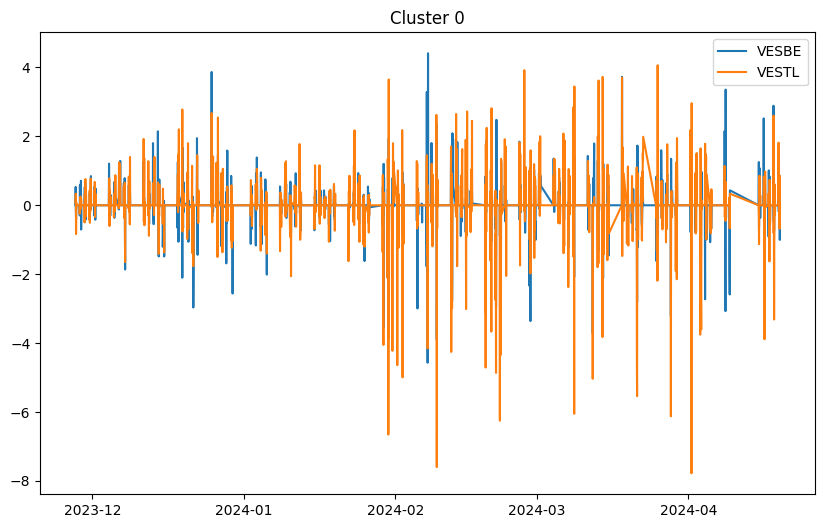

mkdir: ClusteredOpenCloseChange: File exists


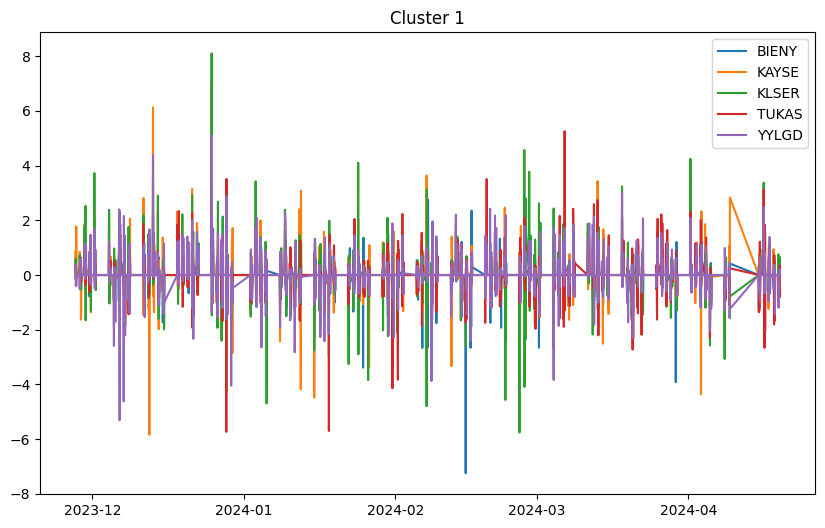

mkdir: ClusteredOpenCloseChange: File exists


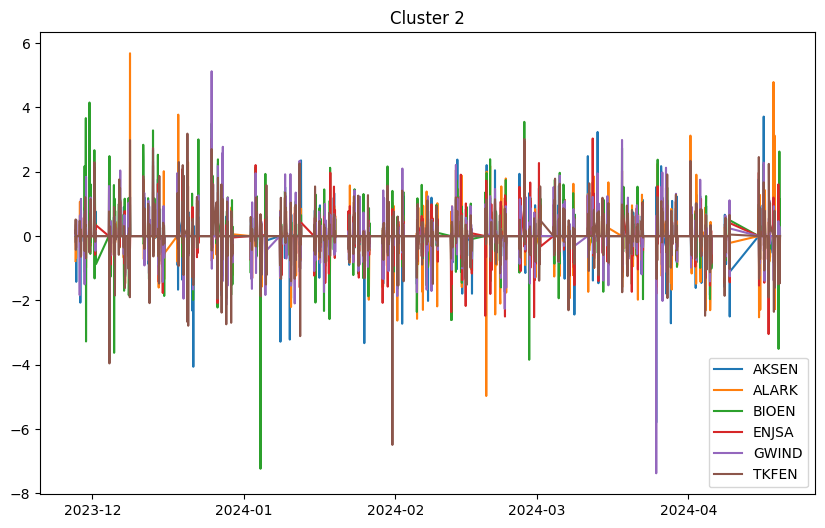

mkdir: ClusteredOpenCloseChange: File exists


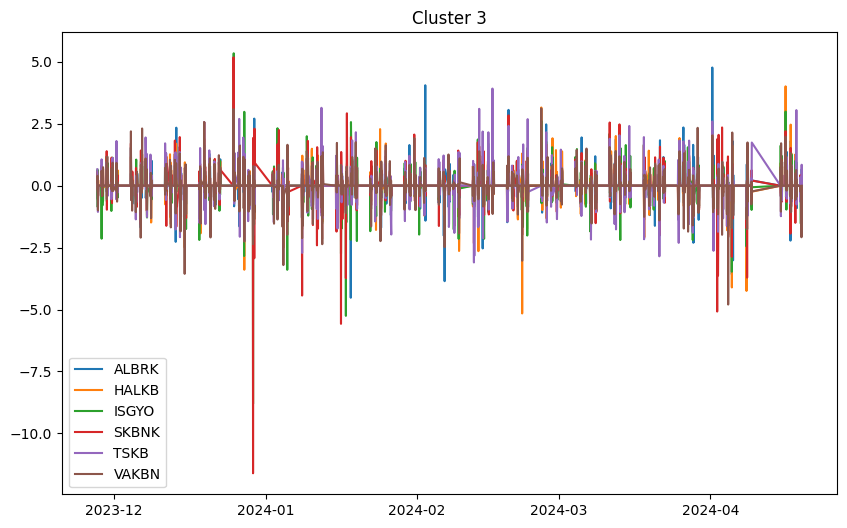

mkdir: ClusteredOpenCloseChange: File exists


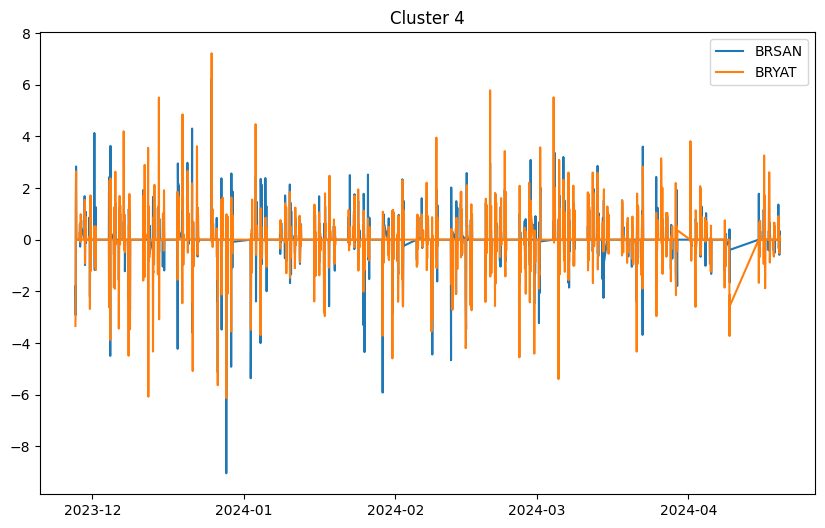

mkdir: ClusteredOpenCloseChange: File exists


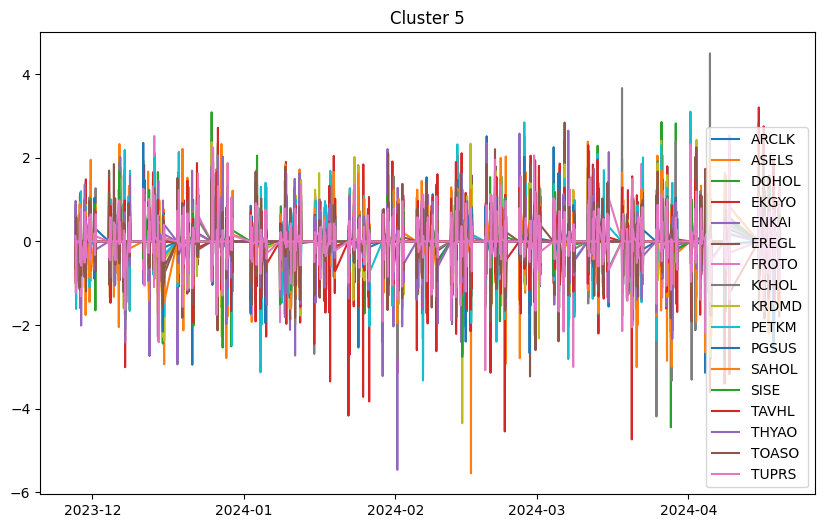

mkdir: ClusteredOpenCloseChange: File exists


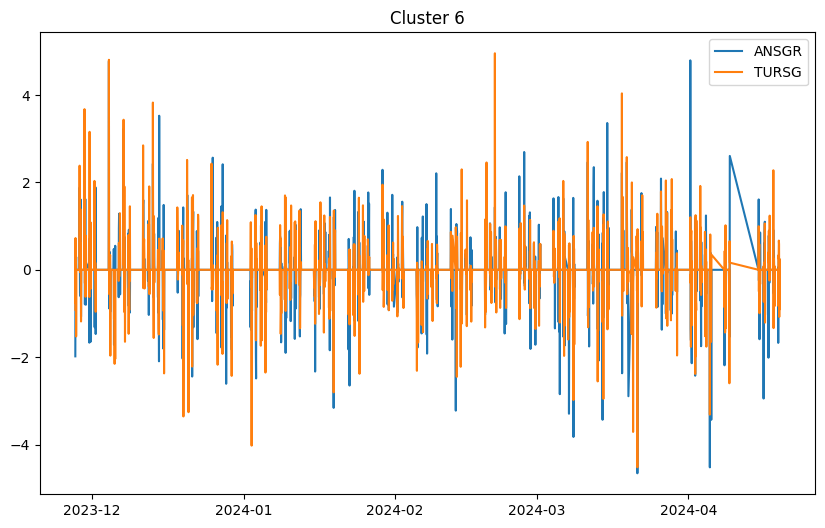

mkdir: ClusteredOpenCloseChange: File exists


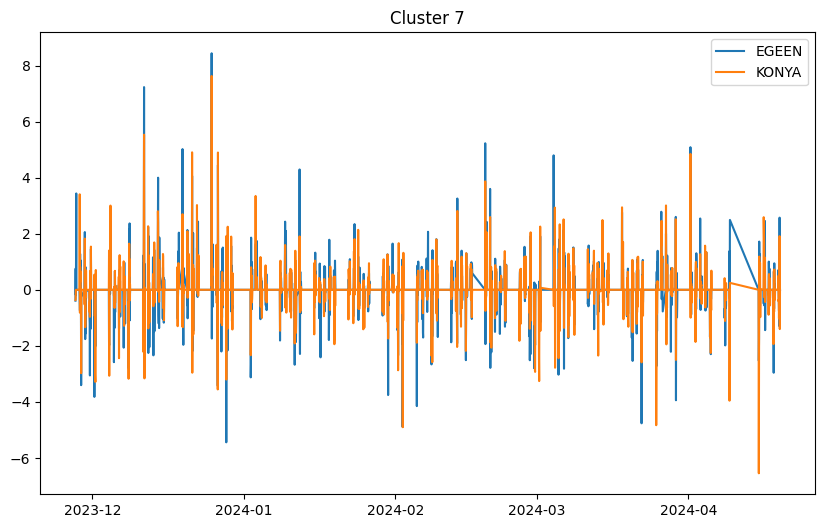

mkdir: ClusteredOpenCloseChange: File exists


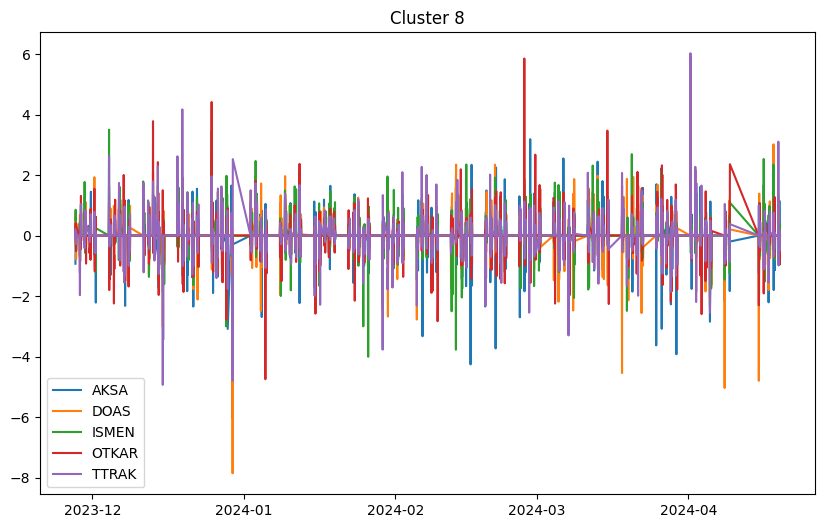

mkdir: ClusteredOpenCloseChange: File exists


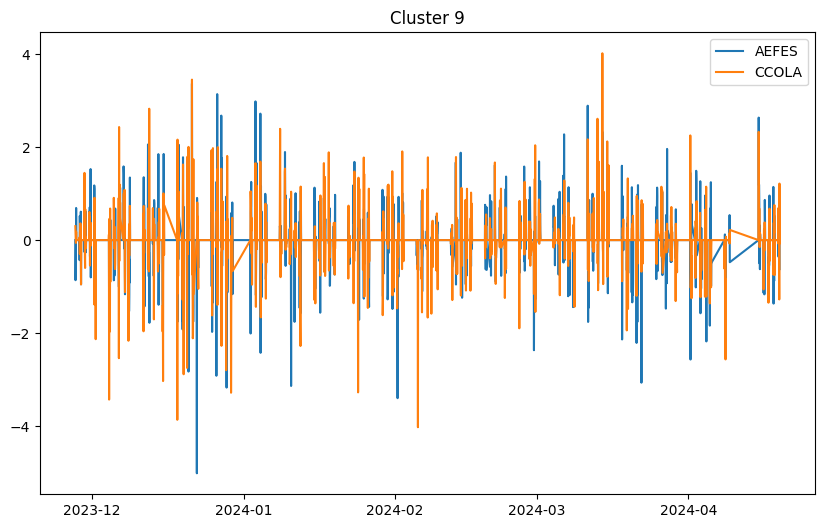

mkdir: ClusteredOpenCloseChange: File exists


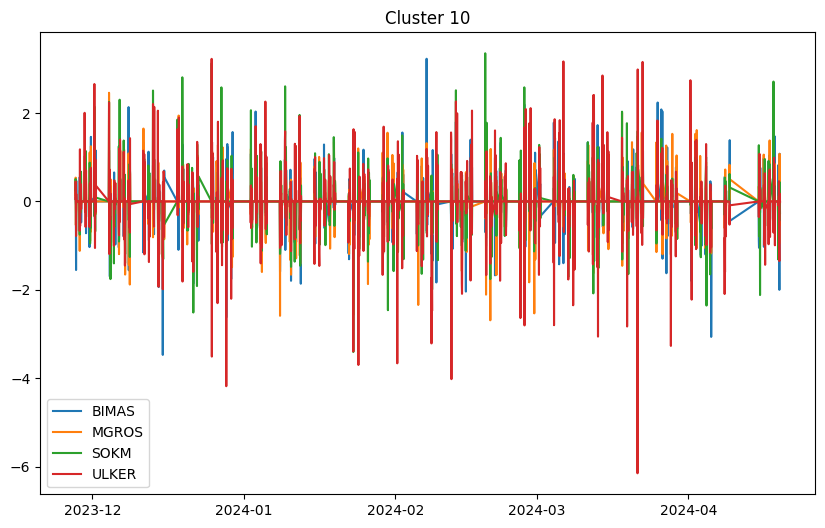

mkdir: ClusteredOpenCloseChange: File exists


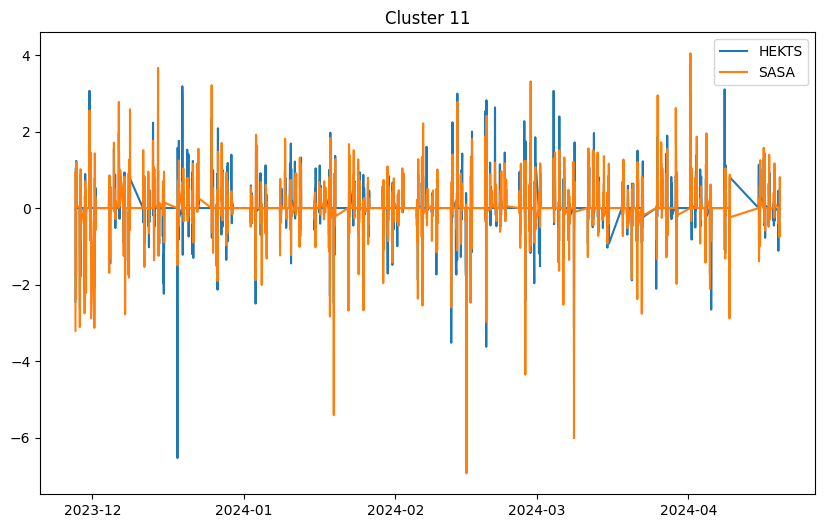

mkdir: ClusteredOpenCloseChange: File exists


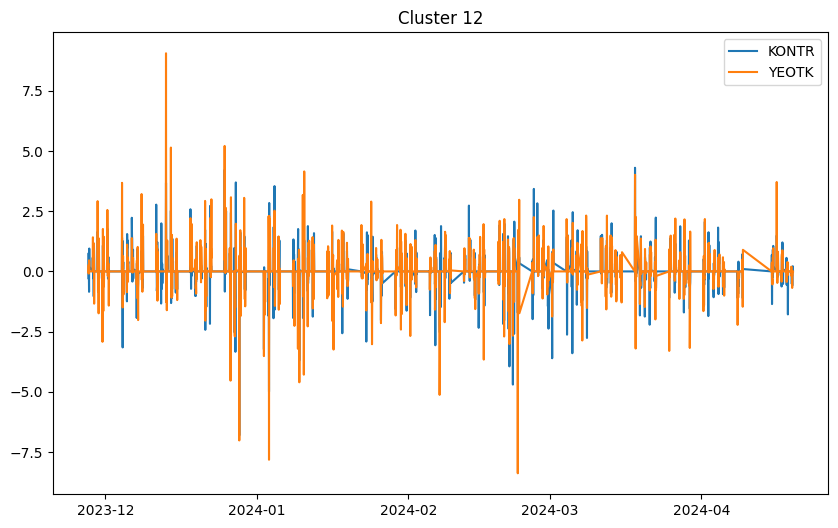

mkdir: ClusteredOpenCloseChange: File exists


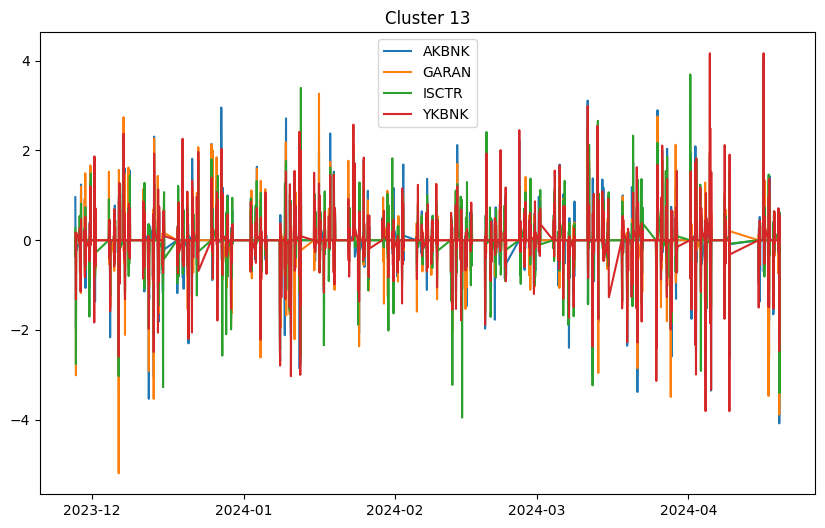

mkdir: ClusteredOpenCloseChange: File exists


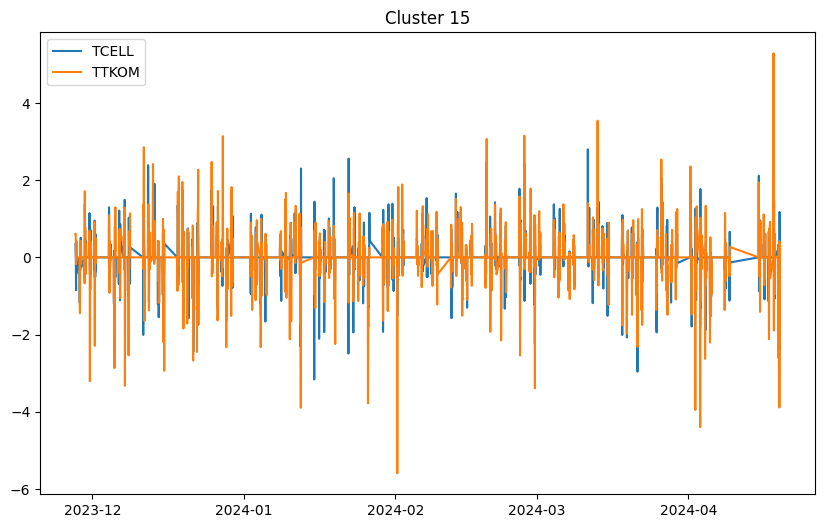

mkdir: ClusteredOpenCloseChange: File exists


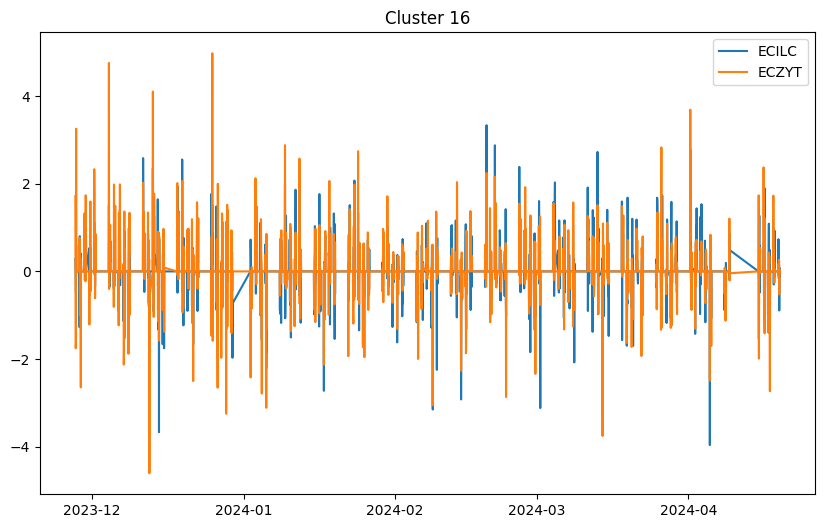

mkdir: ClusteredOpenCloseChange: File exists


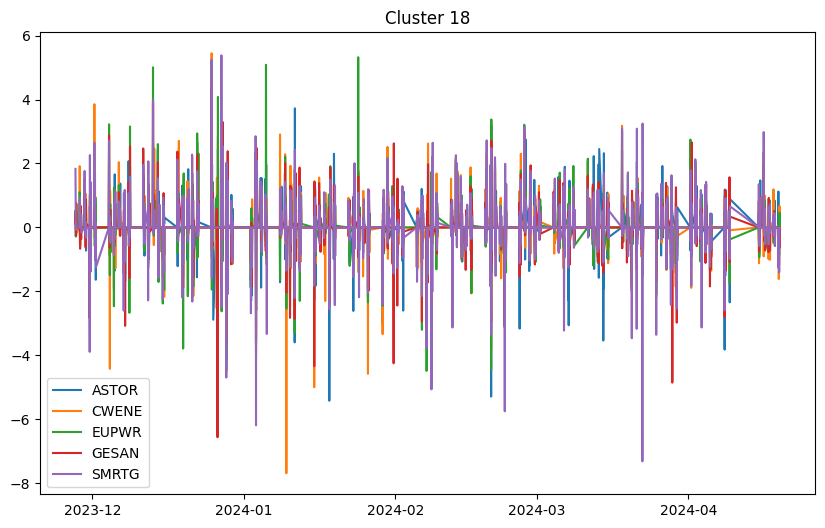

mkdir: ClusteredOpenCloseChange: File exists


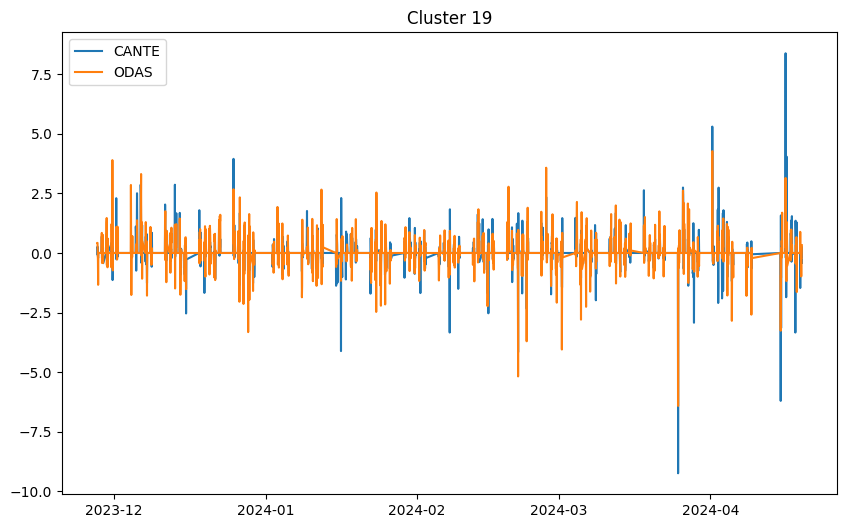

mkdir: ClusteredOpenCloseChange: File exists


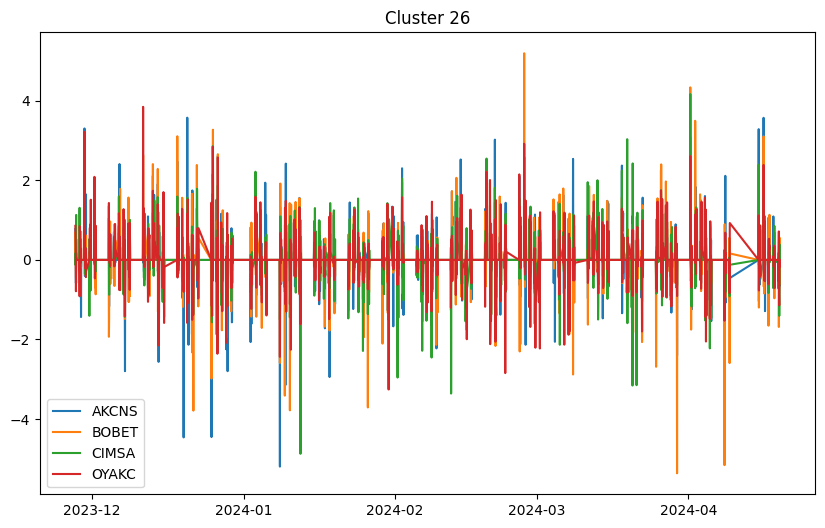

mkdir: ClusteredOpenCloseChange: File exists


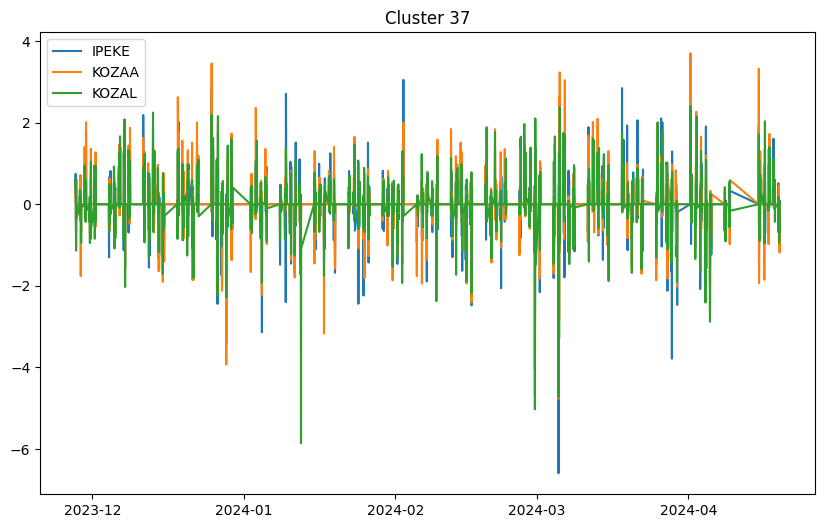

mkdir: ClusteredOpenCloseChange: File exists


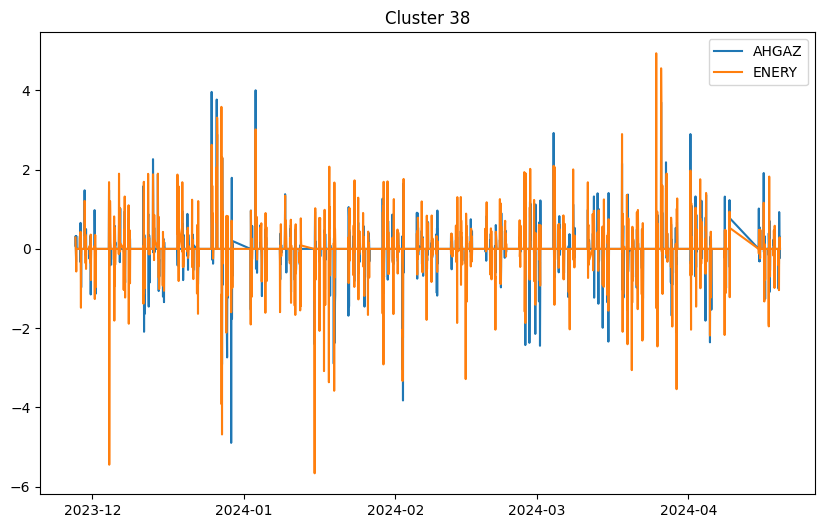

In [171]:
## Plot the clustered stocks

for i in clustered_stocks:
    plt.figure(figsize=(10, 6))
    plt.title("Cluster "+str(i))
    for stock in clustered_stocks[i]:
        plt.plot(dict_stocks[stock]['change_oc_percentage'], label=stock)
    plt.legend()
    ## save the plot to the OpenCloseChange folder
    ## craete the folder if it does not exist
    os.system("mkdir ClusteredOpenCloseChange")
    plt.savefig("ClusteredOpenCloseChange/Cluster"+str(i)+".png")
    plt.show()
    

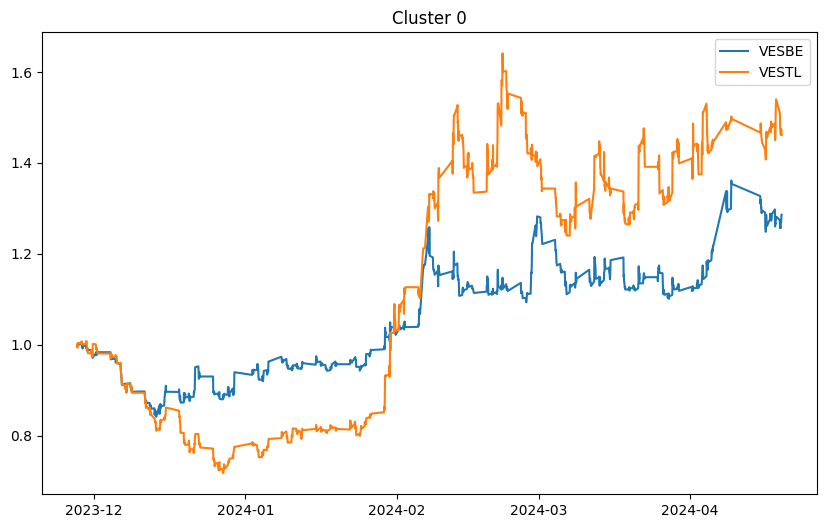

mkdir: ClusteredNormalizedClose: File exists


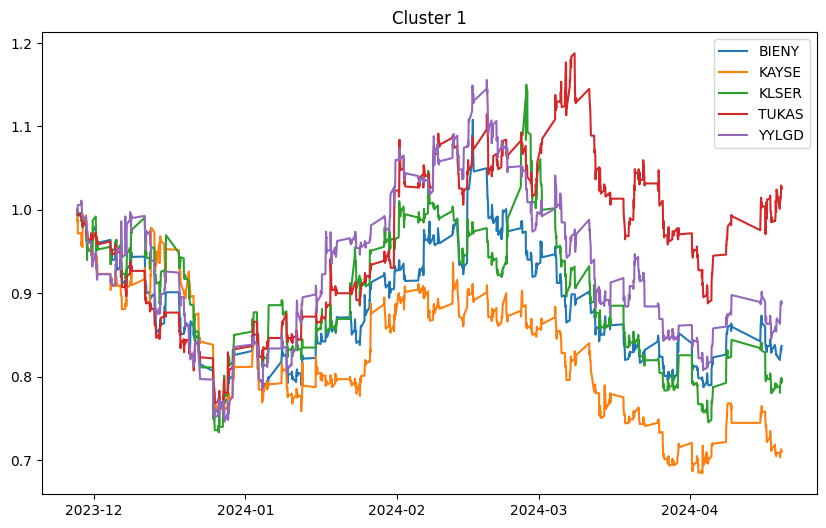

mkdir: ClusteredNormalizedClose: File exists


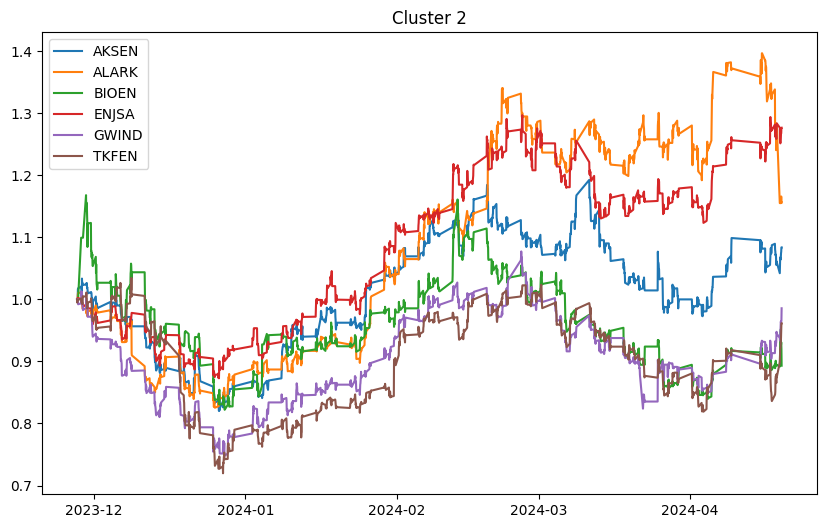

mkdir: ClusteredNormalizedClose: File exists


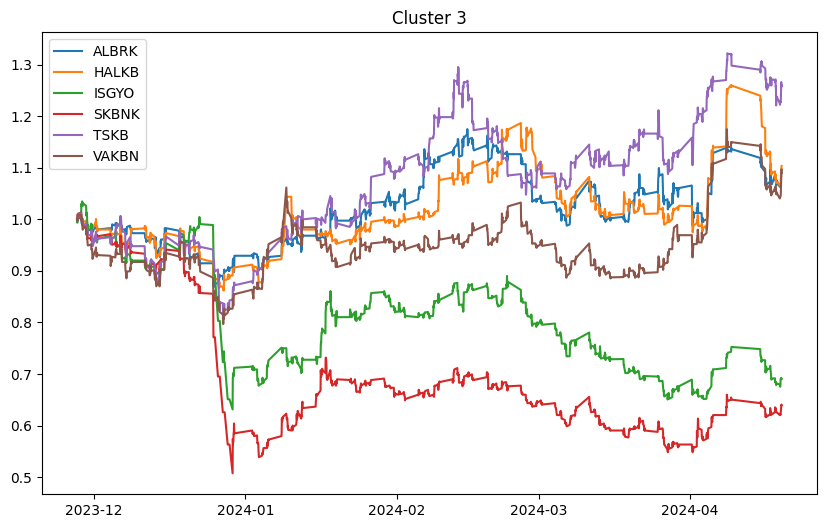

mkdir: ClusteredNormalizedClose: File exists


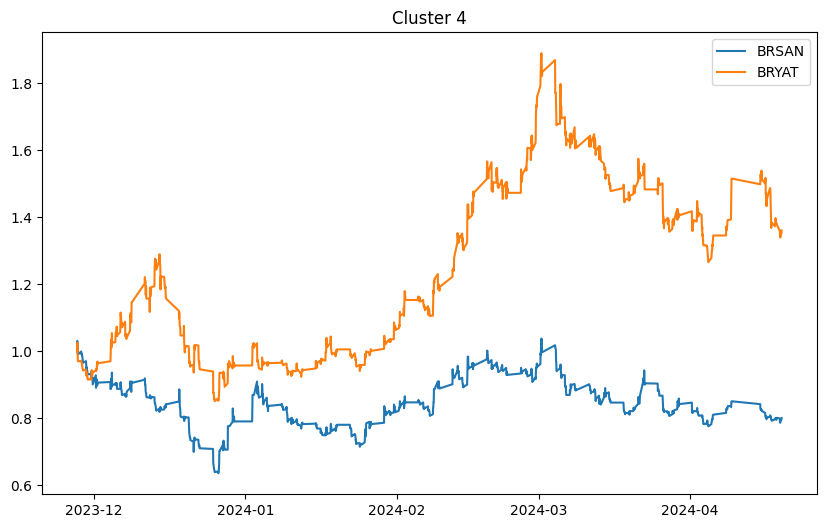

mkdir: ClusteredNormalizedClose: File exists


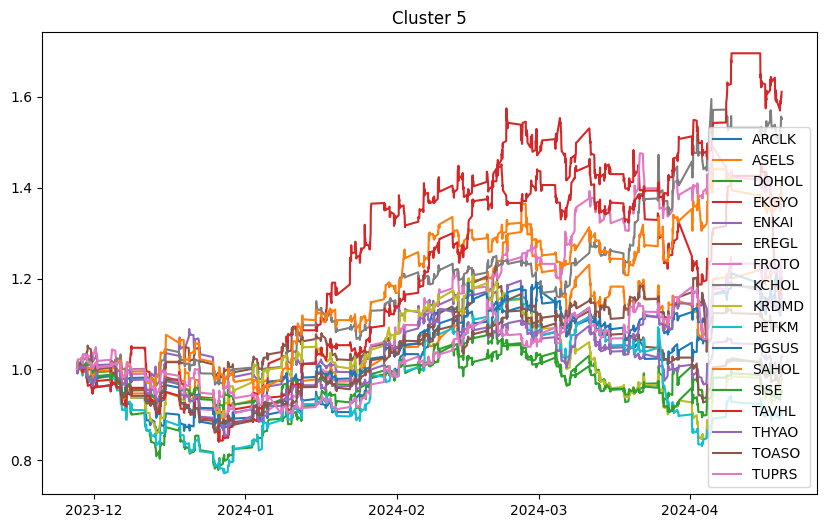

mkdir: ClusteredNormalizedClose: File exists


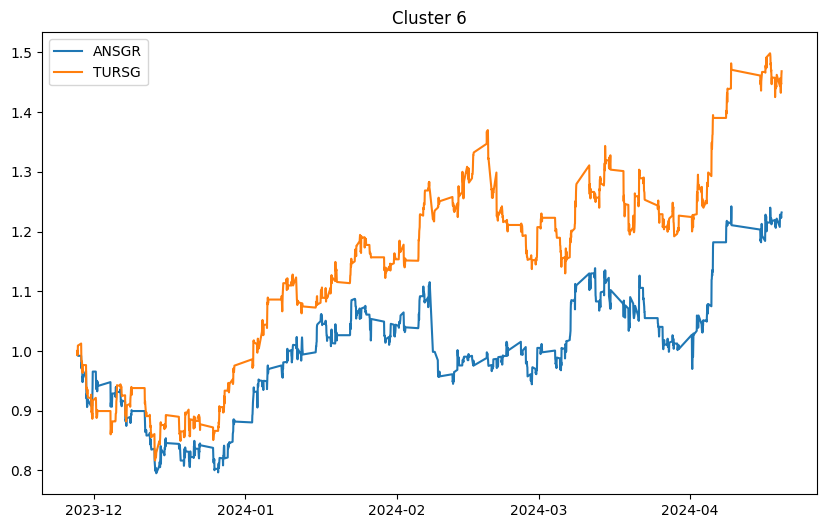

mkdir: ClusteredNormalizedClose: File exists


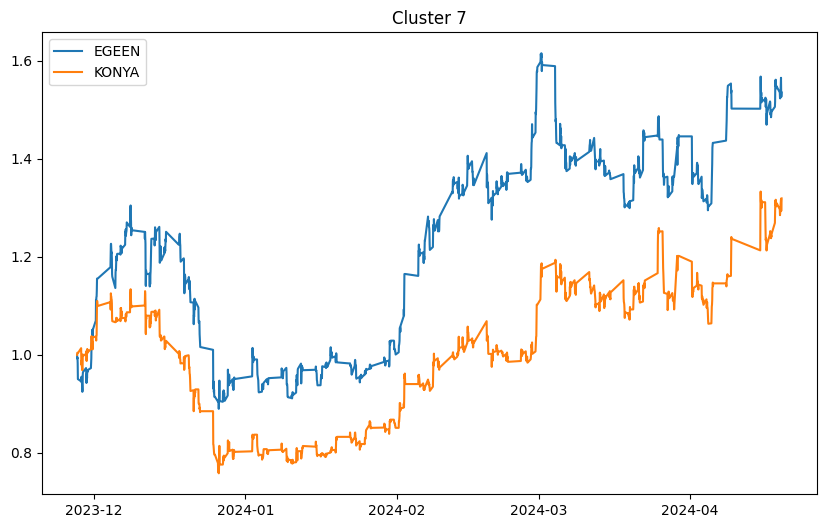

mkdir: ClusteredNormalizedClose: File exists


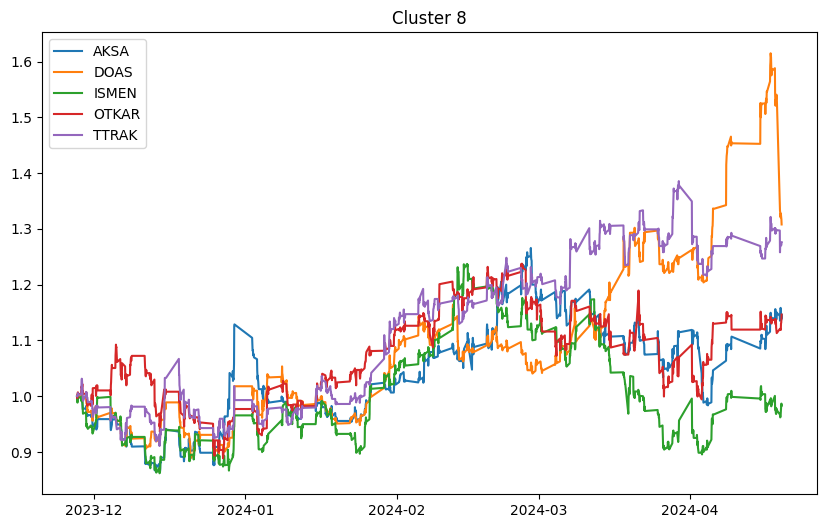

mkdir: ClusteredNormalizedClose: File exists


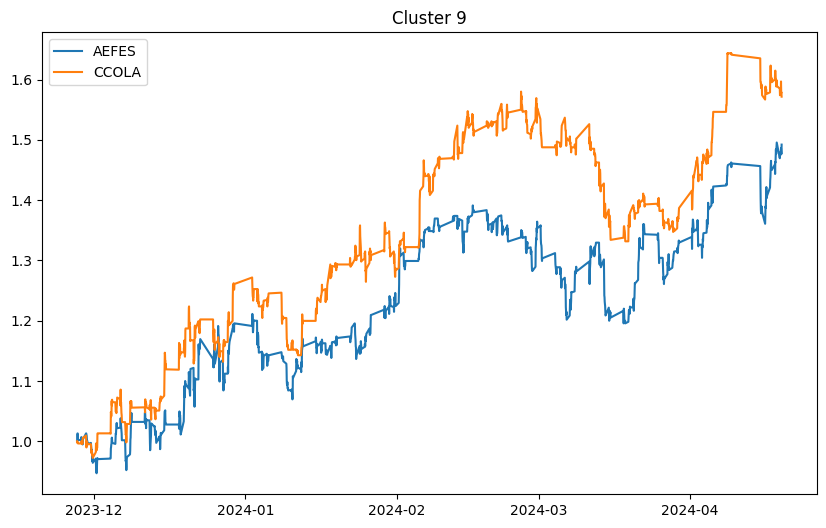

mkdir: ClusteredNormalizedClose: File exists


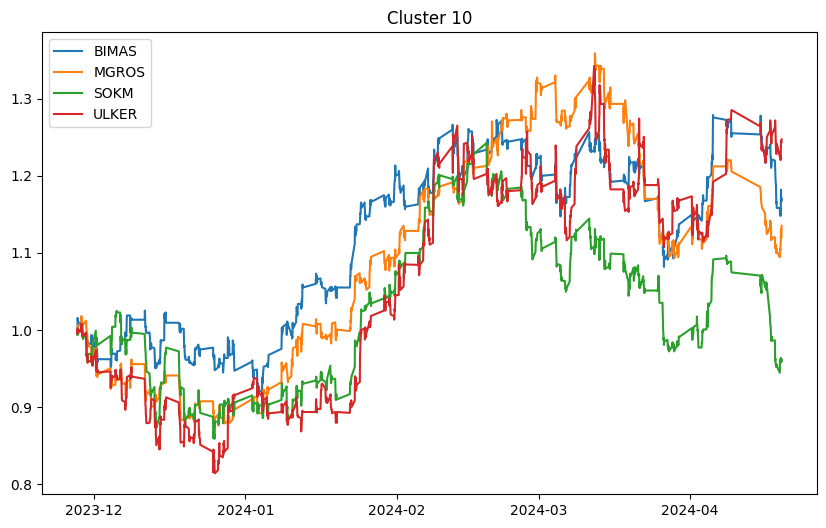

mkdir: ClusteredNormalizedClose: File exists


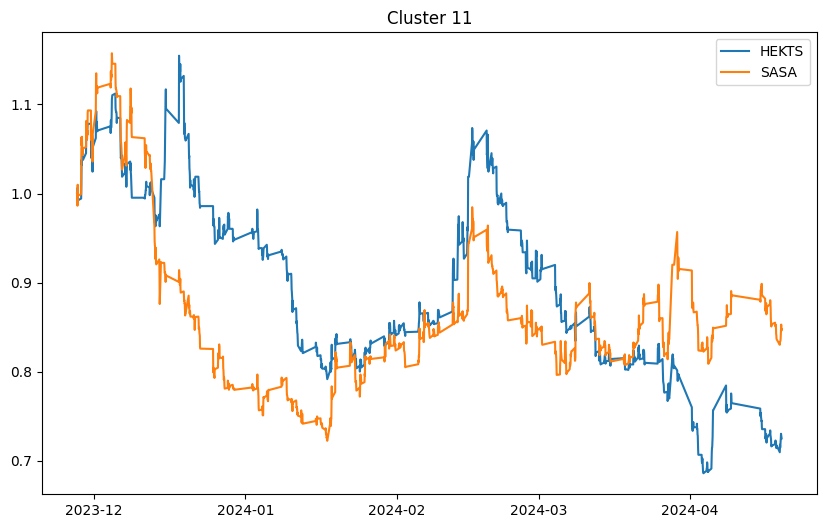

mkdir: ClusteredNormalizedClose: File exists


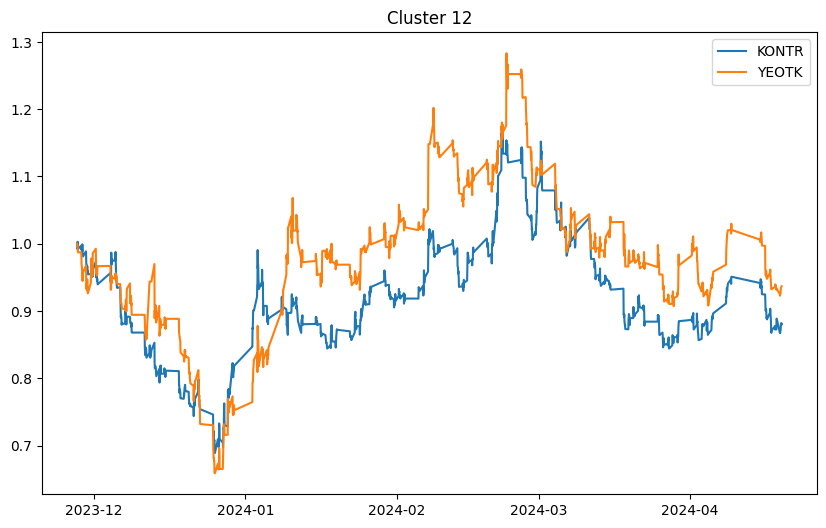

mkdir: ClusteredNormalizedClose: File exists


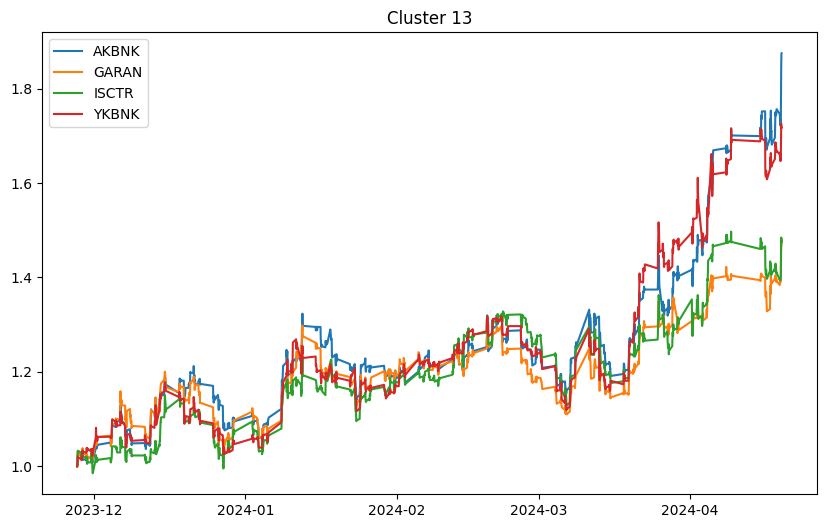

mkdir: ClusteredNormalizedClose: File exists


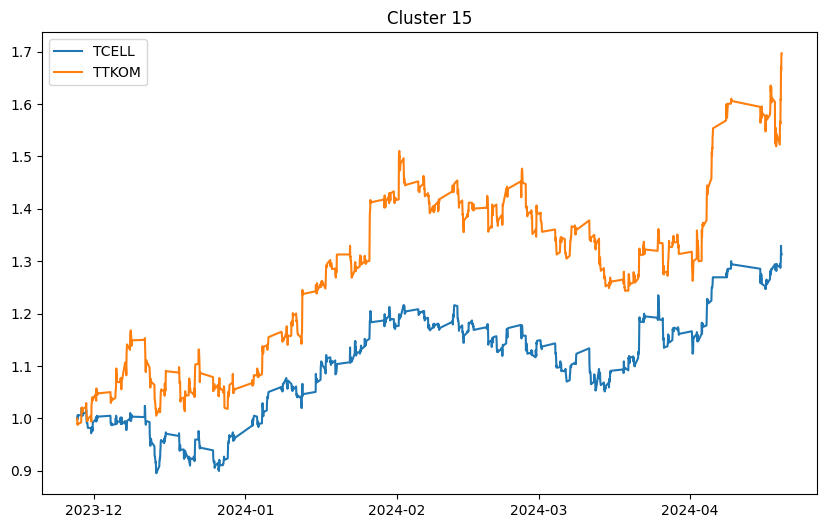

mkdir: ClusteredNormalizedClose: File exists


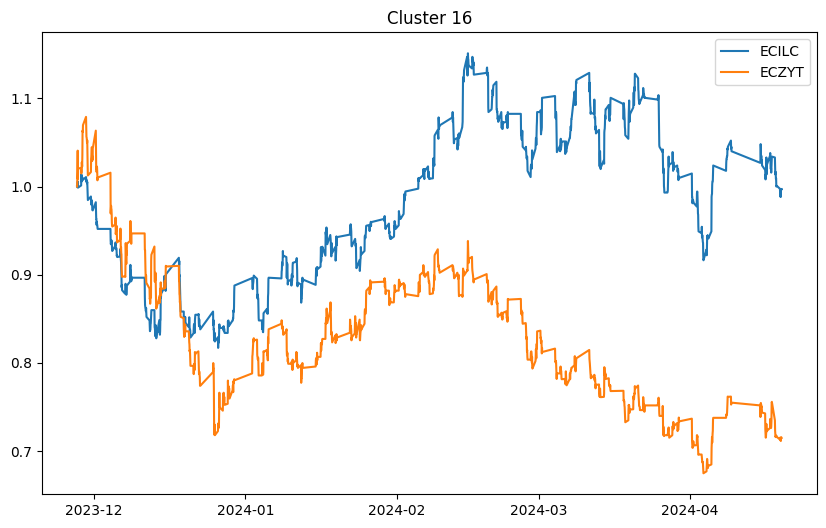

mkdir: ClusteredNormalizedClose: File exists


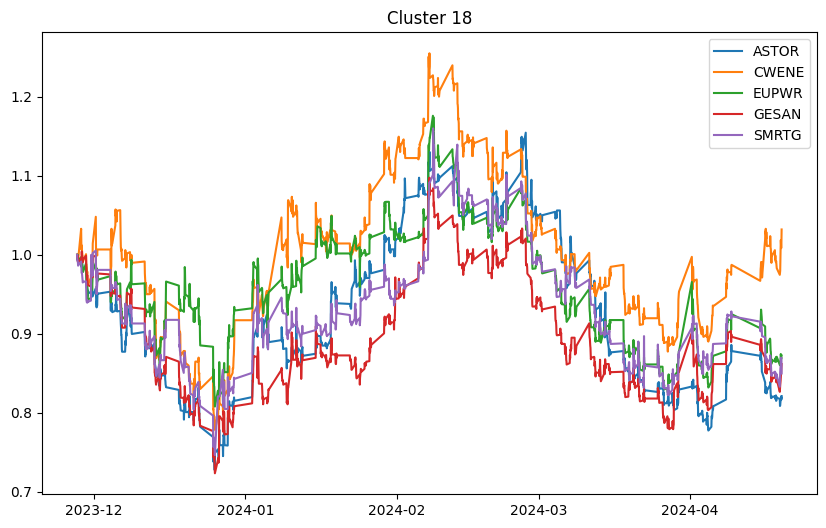

mkdir: ClusteredNormalizedClose: File exists


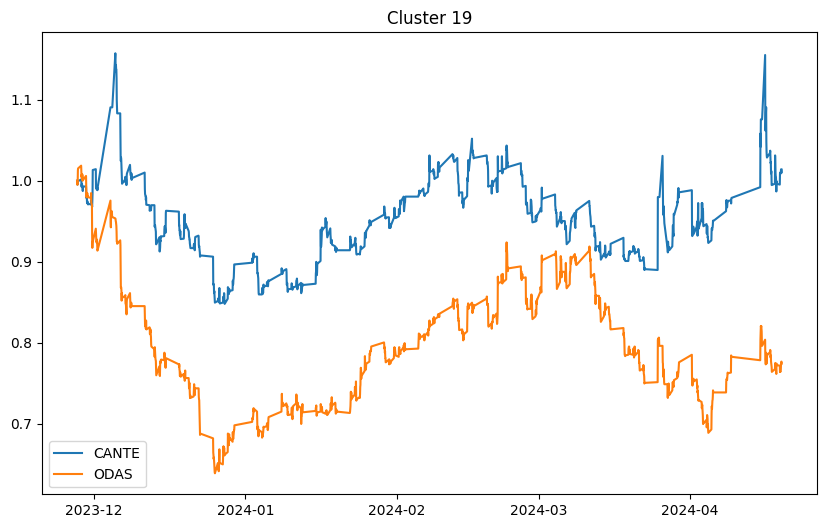

mkdir: ClusteredNormalizedClose: File exists


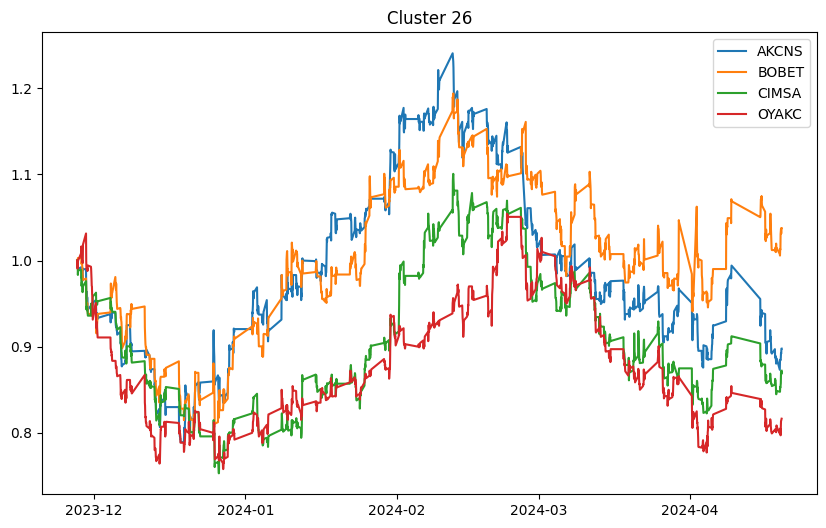

mkdir: ClusteredNormalizedClose: File exists


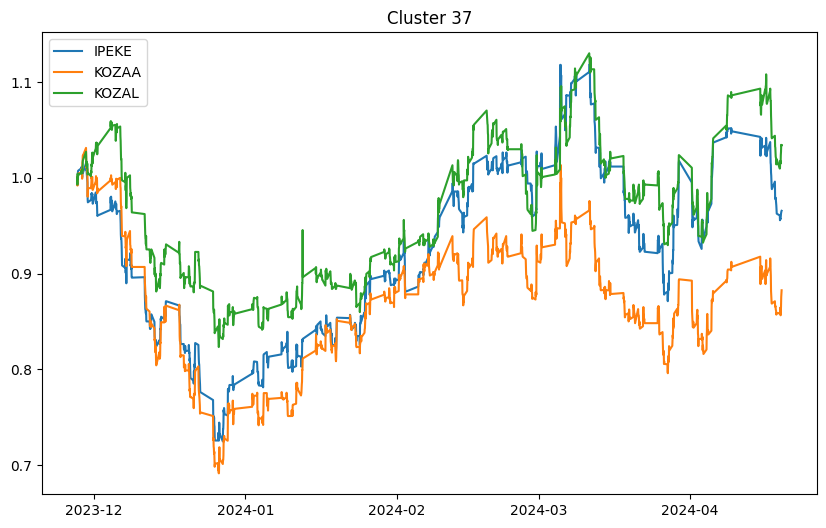

mkdir: ClusteredNormalizedClose: File exists


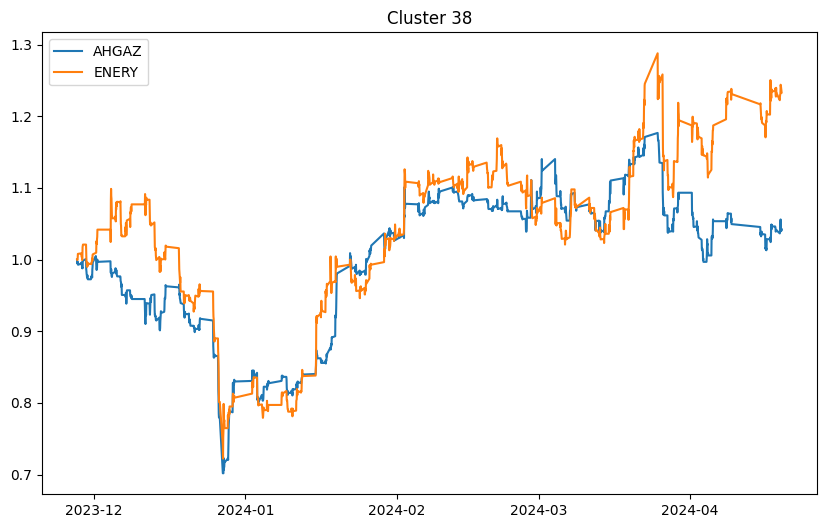

In [172]:
for i in clustered_stocks:
    plt.figure(figsize=(10, 6))
    plt.title("Cluster "+str(i))
    for stock in clustered_stocks[i]:
        plt.plot(dict_stocks[stock]['normalized_close'], label=stock)
    plt.legend()
    ## save the plot to the OpenCloseChange folder
    ## craete the folder if it does not exist
    os.system("mkdir ClusteredNormalizedClose")
    plt.savefig("ClusteredNormalizedClose/Cluster"+str(i)+".png")
    plt.show()

In [177]:
## save the clusters to a json file
import json
clustered_stocks = {str(key): value.tolist() for key, value in clustered_stocks.items()}
with open('clustered_stocks.json', 'w') as fp:
    json.dump(clustered_stocks, fp)


AttributeError: 'list' object has no attribute 'tolist'